In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_file_path = '/content/drive/MyDrive/processed_images_newtimelapse_2.zip'
extract_to_path = '/content/extracted_images/'
!mkdir -p "{extract_to_path}"
print(f"Starting extraction of '{zip_file_path}' to '{extract_to_path}'...")
!unzip -q "{zip_file_path}" -d "{extract_to_path}"
print("Extraction finished!")

Starting extraction of '/content/drive/MyDrive/processed_images_newtimelapse_2.zip' to '/content/extracted_images/'...
Extraction finished!


In [ ]:
# ------------------------------------------------------------
# 0)  INSTALL & IMPORT
# ------------------------------------------------------------
import os, subprocess, sys, json, pathlib, textwrap, inspect
if not os.path.isdir("TransUNet"):
    !git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git

# 📦  minimal, compile-free deps – NO mmcv-full
!pip install -q ml_collections einops medpy surface-distance
import os, glob, random, json
from pathlib import Path
import numpy as np
from PIL import Image

import torch, torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torch.optim as optim

from TransUNet.networks.vit_seg_modeling import VisionTransformer as ViT_seg
from TransUNet.networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg

print(CONFIGS_ViT_seg.keys())

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.3/156.3 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 47.8 MB/s eta 0:00:00
dict_keys(['ViT-B_16', 'ViT-B_32', 'ViT-L_16', 'ViT-L_32', 'ViT-H_14', 'R50-ViT-B_16', 'R50-ViT-L_16', 'testing'])


In [ ]:

# ------------------------------------------------------------
# 1)  STATIC CONFIG (edit paths ↓)
# ------------------------------------------------------------
IMG_DIR  = Path("/content/extracted_images/processed_images_newtimelapse/grayscale")
MASK_DIR = Path("/content/extracted_images/processed_images_newtimelapse/masks")

NUM_CLASSES   = 5                # black red green blue yellow
CLASS_COLORS  = {                # RGB ➜ integer id
    (  0,  0,  0): 0,            # black (background)
    (255,  0,  0): 1,            # red
    (  0,255,  0): 2,            # green
    (  0,  0,255): 3,            # blue
    (255,255,  0): 4             # yellow
}
IMG_SIZE      = 512
BATCH_SIZE    = 12
EPOCHS        = 30
LR            = 2e-4

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------------------
# 2)  DATASET
# ------------------------------------------------------------
class SegDataset(Dataset):
    def __init__(self, img_dir, mask_dir, tf=None):
        self.img_paths  = sorted(glob.glob(str(img_dir / "*")))
        self.mask_paths = sorted(glob.glob(str(mask_dir / "*")))
        assert len(self.img_paths) == len(self.mask_paths), "images != masks"
        self.color2id   = CLASS_COLORS
        self.tf         = tf

    @staticmethod
    def _rgb2mask(rgb, lut):
        """Map every pixel’s RGB triplet to its class id."""
        h, w, _ = rgb.shape
        mask = np.zeros((h, w), dtype=np.int64)
        for rgb_val, idx in lut.items():
            match = np.all(rgb == rgb_val, axis=-1)
            mask[match] = idx
        return mask

    def __getitem__(self, idx):
        img  = Image.open(self.img_paths[idx]).convert("L")           # grayscale input
        img  = img.convert("RGB")                                     # replicate to 3-ch
        mask = Image.open(self.mask_paths[idx]).convert("RGB")

        if self.tf: img  = self.tf(img)
        mask = np.array(mask.resize((IMG_SIZE, IMG_SIZE), Image.NEAREST))
        mask = torch.from_numpy(self._rgb2mask(mask, self.color2id))

        return img, mask

    def __len__(self): return len(self.img_paths)

# basic augmentation / normalisation
tf_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomRotation(degrees=30),
    transforms.GaussianBlur(kernel_size=(9, 15), sigma=(1, 5)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
tf_val = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

full_ds = SegDataset(IMG_DIR, MASK_DIR, tf_train)
val_len = int(0.25 * len(full_ds))
train_ds, val_ds = random_split(full_ds, [len(full_ds)-val_len, val_len],
                                generator=torch.Generator().manual_seed(1337))
# switch val transforms
val_ds.dataset.tf = tf_val

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ------------------------------------------------------------
# 3)  MODEL
# ------------------------------------------------------------
cfg           = CONFIGS_ViT_seg["R50-ViT-B_16"]
cfg.n_classes = NUM_CLASSES
cfg.n_skip    = 3
cfg.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)

model = ViT_seg(cfg, img_size=IMG_SIZE, num_classes=NUM_CLASSES).to(DEVICE)
weights_path = "/content/R50+ViT-B_16.npz"
!rm -f "{weights_path}"
if not Path(weights_path).exists():
    !wget -q https://storage.googleapis.com/vit_models/imagenet21k/R50+ViT-B_16.npz -O "$weights_path"

model.load_from(np.load(weights_path))

# ------------------------------------------------------------
# 4)  LOSSES & METRICS   ——  Dice + Cross-Entropy
# ------------------------------------------------------------

class FocalLoss(nn.Module):
    """
    Multi-class Focal Loss for segmentation.
    FL(pt) = -alpha * (1 - pt)**gamma * log(pt)
    Expects network logits (B,C,H,W) and target indices (B,H,W).
    Args:
        gamma (float): Focusing parameter. Default=2.0.
        alpha (Tensor | float | None): Weighting factor for classes.
            - Can be a Tensor of shape [C] with weights for each class.
            - Can be a single float/int to apply to all classes.
            - If None, no alpha weighting is applied. Default=None.
        reduction (str): Specifies the reduction to apply ('none', 'mean', 'sum').
                         'none': no reduction, 'mean': mean of outputs, 'sum': sum of outputs.
                         Default='mean'.
    """
    def __init__(self, gamma=2.0, alpha=None, reduction='mean'):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction
        if isinstance(self.alpha, (float, int)):
            if self.alpha < 0: raise ValueError("Alpha value must be non-negative")
        elif isinstance(self.alpha, torch.Tensor):
            if self.alpha.ndim != 1: raise ValueError("Alpha tensor must be 1D (shape [C])")
        elif self.alpha is not None:
            raise TypeError("Alpha must be float, int, tensor, or None")


    def forward(self, logits, target):
        target = target.long()
        log_probs = F.log_softmax(logits, dim=1)
        ce_loss_elements = F.nll_loss(log_probs, target, reduction='none')
        pt = torch.exp(-ce_loss_elements).clamp(min=1e-8, max=1.0 - 1e-8)
        modulating_factor = (1.0 - pt) ** self.gamma
        focal_loss_elements = modulating_factor * ce_loss_elements

        if self.alpha is not None:
            if isinstance(self.alpha, (float, int)):
                focal_loss_elements = self.alpha * focal_loss_elements
            elif isinstance(self.alpha, torch.Tensor):
                alpha_local = self.alpha.to(target.device)
                alpha_weights = alpha_local[target]
                focal_loss_elements = alpha_weights * focal_loss_elements

        if self.reduction == 'mean':
            focal_loss = focal_loss_elements.mean()
        elif self.reduction == 'sum':
            focal_loss = focal_loss_elements.sum()
        elif self.reduction == 'none':
            focal_loss = focal_loss_elements
        else:
            raise ValueError(f"Invalid reduction type: {self.reduction}")

        return focal_loss



class DiceLoss(nn.Module):
    """
    Soft Dice for multi-class segmentation.
    Expects network logits (B,C,H,W) and target indices (B,H,W).
    """
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, target):
        probs = torch.softmax(logits, dim=1)
        target_1hot = torch.nn.functional.one_hot(target, NUM_CLASSES)
        target_1hot = target_1hot.permute(0,3,1,2).float()
        dims = (0,2,3)
        intersection = (probs * target_1hot).sum(dims)
        cardinality  = probs.sum(dims) + target_1hot.sum(dims)

        dice = (2. * intersection + self.smooth) / (cardinality + self.smooth)
        return 1.0 - dice.mean()

class IoULoss(nn.Module):
    """
    Soft IoU (Jaccard) Loss for multi-class segmentation.
    IoU = Intersection / Union
    Loss = 1 - Mean IoU across classes.
    Expects network logits (B,C,H,W) and target indices (B,H,W).
    """
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, target):
        probs = torch.softmax(logits, dim=1)
        target_1hot = F.one_hot(target.long(), NUM_CLASSES)        # (B,H,W,C)
        target_1hot = target_1hot.permute(0, 3, 1, 2).float()
        dims = (0, 2, 3)
        intersection = (probs * target_1hot).sum(dims)
        cardinality = probs.sum(dims) + target_1hot.sum(dims)      # (C,)
        union = cardinality - intersection
        iou = (intersection + self.smooth) / (union + self.smooth)
        mean_iou = iou.mean()
        return 1.0 - mean_iou

# --- CHOOSE YOUR WEIGHTS HERE ---
λ_CE   = 0.0     # Weight for Cross-Entropy
λ_DICE = 0.0     # Weight for Dice Loss
λ_IOU  = 0.25     # Weight for IoU Loss
λ_FOCAL  = 0.75
# ---------------------------------

# Instantiate the individual loss functions
ce_loss   = nn.CrossEntropyLoss()
dice_loss = DiceLoss()
iou_loss  = IoULoss()
focal_loss  = FocalLoss()

def criterion(logits, target):

    total_loss = 0.0
    if λ_CE > 0:
        total_loss += λ_CE * ce_loss(logits, target)
    if λ_DICE > 0:
        total_loss += λ_DICE * dice_loss(logits, target)
    if λ_IOU > 0:
        total_loss += λ_IOU * iou_loss(logits, target)
    if λ_FOCAL > 0:
        total_loss += λ_FOCAL * focal_loss(logits, target)

    if total_loss == 0.0 and λ_CE == 0 and λ_DICE == 0 and λ_IOU == 0 and λ_FOCAL==0:
         print("Warning: All loss weights (λ_CE, λ_DICE, λ_IOU, λ_FOCAL) are zero. Defaulting to CE Loss.")
         return ce_loss(logits, target)

    return total_loss


# criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

@torch.no_grad()
def iou(pred, target):
    pred = pred.argmax(1)
    ious = []
    for c in range(NUM_CLASSES):
        inter = ((pred == c) & (target == c)).float().sum()
        union = ((pred == c) | (target == c)).float().sum()
        ious.append((inter+1e-6)/(union+1e-6))
    return torch.tensor(ious)

# ------------------------------------------------------------
# 5)  TRAIN LOOP
# ------------------------------------------------------------
best = 1e9
for epoch in range(1, EPOCHS+1):
    model.train(); tr_loss = 0
    for imgs, msks in train_loader:
        imgs, msks = imgs.to(DEVICE), msks.to(DEVICE)
        optimizer.zero_grad()
        out = model(imgs)
        loss = criterion(out, msks)
        loss.backward(); optimizer.step()
        tr_loss += loss.item()
    scheduler.step()

    # ---------- validation ----------
    model.eval(); val_loss = 0; iou_accum = torch.zeros(NUM_CLASSES)
    with torch.no_grad():
        for imgs, msks in val_loader:
            imgs, msks = imgs.to(DEVICE), msks.to(DEVICE)
            out = model(imgs)
            val_loss += criterion(out, msks).item()
            iou_accum += iou(out, msks)
    val_loss /= len(val_loader)
    iou_mean = (iou_accum / len(val_loader)).tolist()

    print(f"[{epoch:3d}/{EPOCHS}]  "
          f"train {tr_loss/len(train_loader):.3f} | "
          f"val {val_loss:.3f} | "
          f"mIoU {np.mean(iou_mean):.3f}")

    if val_loss < best:
        best = val_loss
        torch.save(model.state_dict(), "/content/best_transunet.pth")

print("✓ training complete — best model saved to best_transunet.pth")


load_pretrained: grid-size from 14 to 32
[  1/30]  train 0.470 | val 0.322 | mIoU 0.613
[  2/30]  train 0.264 | val 0.224 | mIoU 0.797
[  3/30]  train 0.206 | val 0.190 | mIoU 0.800
[  4/30]  train 0.166 | val 0.162 | mIoU 0.814
[  5/30]  train 0.144 | val 0.192 | mIoU 0.668
[  6/30]  train 0.131 | val 0.124 | mIoU 0.837
[  7/30]  train 0.108 | val 0.117 | mIoU 0.831
[  8/30]  train 0.096 | val 0.109 | mIoU 0.837
[  9/30]  train 0.086 | val 0.105 | mIoU 0.840
[ 10/30]  train 0.073 | val 0.094 | mIoU 0.859
[ 11/30]  train 0.065 | val 0.090 | mIoU 0.863
[ 12/30]  train 0.060 | val 0.088 | mIoU 0.861
[ 13/30]  train 0.056 | val 0.089 | mIoU 0.859
[ 14/30]  train 0.053 | val 0.088 | mIoU 0.865
[ 15/30]  train 0.051 | val 0.081 | mIoU 0.870
[ 16/30]  train 0.045 | val 0.081 | mIoU 0.873
[ 17/30]  train 0.042 | val 0.085 | mIoU 0.866
[ 18/30]  train 0.043 | val 0.100 | mIoU 0.849
[ 19/30]  train 0.046 | val 0.087 | mIoU 0.865
[ 20/30]  train 0.040 | val 0.082 | mIoU 0.872
[ 21/30]  train 0.0

In [ ]:
# ------------------------------------------------------------
# 0)  IMPORTS  (same as before)
# ------------------------------------------------------------
import torch, numpy as np, matplotlib.pyplot as plt
from torchvision import transforms
from pathlib import Path
from PIL import Image

# ------------------------------------------------------------
# 1)  CONSTANTS / LOOK-UP TABLES
# ------------------------------------------------------------
NUM_CLASSES  = 5
CLASS_NAMES  = ["Black", "Red", "Green", "Blue", "Yellow"]

# class-id ➜ pseudo-RGB for matplotlib (0-1 float range)
VIS_COLORS   = {
    0: (0, 0, 0),
    1: (1, 0, 0),
    2: (0, 1, 0),
    3: (0, 0, 1),
    4: (1, 1, 0)
}

# ------------------------------------------------------------
# 2)  IoU helpers
# ------------------------------------------------------------
def class_iou(pred, tgt, cls):
    inter = ((pred == cls) & (tgt == cls)).sum()
    union = ((pred == cls) | (tgt == cls)).sum()
    return float(inter) / float(union) if union else 0.0

def evaluate_dataset(model, dataset, device):
    model.eval()
    results = []

    for idx in range(len(dataset)):
        img, tgt = dataset[idx]
        with torch.no_grad():
            out  = model(img.unsqueeze(0).to(device))
            pred = out.argmax(1).squeeze(0).cpu().numpy()

        ious = [class_iou(pred, tgt.numpy(), c) for c in range(NUM_CLASSES)]

        results.append({
            "idx"        : idx,
            "class_ious" : ious,
            "avg_iou"    : np.mean(ious),
            "pred"       : pred,
            "mask"       : tgt.numpy()
        })

    return sorted(results, key=lambda x: x["avg_iou"])   # worst ➜ best

# ------------------------------------------------------------
# 3)  REPORTING
# ------------------------------------------------------------
def print_stats(results):
    per_class = {c: [] for c in range(NUM_CLASSES)}
    all_avg   = []

    for r in results:
        for c, iou in enumerate(r["class_ious"]):
            per_class[c].append(iou)
        all_avg.append(r["avg_iou"])

    def line(title,val): print(f"{title:<12}: {val:.3f}")

    print("\n=== IoU statistics per class ===")
    for c in range(NUM_CLASSES):
        ious = per_class[c]
        print(f"\n{CLASS_NAMES[c]} (n={len(ious)})")
        line("min",   np.min(ious))
        line("max",   np.max(ious))
        line("mean",  np.mean(ious))
        line("median",np.median(ious))
        line("std",   np.std(ious))
        for p in (10,25,50,75,90):
            line(f"{p}%ile", np.percentile(ious, p))
        print(f"<0.30: {(np.array(ious)<0.30).sum()}   >0.80: {(np.array(ious)>0.80).sum()}")

    print("\n=== Average over ALL classes ===")
    line("min",   np.min(all_avg))
    line("max",   np.max(all_avg))
    line("mean",  np.mean(all_avg))
    line("median",np.median(all_avg))
    line("std",   np.std(all_avg))

# ------------------------------------------------------------
# 4)  VISUALISATION
# ------------------------------------------------------------
def colorize(mask):
    rgb = np.zeros((*mask.shape,3))
    for k,v in VIS_COLORS.items(): rgb[mask==k] = v
    return rgb

def show_cases(sorted_results, dataset, N=5):
    splits = [("Poor", sorted_results[:N]),
              ("Average", sorted_results[len(sorted_results)//2 - N//2 : len(sorted_results)//2 + N//2]),
              ("Good", sorted_results[-N:])]

    for title, cases in splits:
        fig, ax = plt.subplots(len(cases), 3, figsize=(15,5*len(cases)))
        fig.suptitle(f"{title} cases", fontsize=16)
        for row, case in enumerate(cases):
            img,_ = dataset[case["idx"]]
            img_np = img.permute(1,2,0).cpu().numpy()

            ax[row,0].imshow(img_np, cmap="gray"); ax[row,0].set_title("input"); ax[row,0].axis("off")
            ax[row,1].imshow(colorize(case["mask"])); ax[row,1].set_title("ground-truth"); ax[row,1].axis("off")
            ax[row,2].imshow(colorize(case["pred"])); ax[row,2].axis("off")
            sub = f"avg IoU {case['avg_iou']:.3f}\n" + \
                  "\n".join([f"{CLASS_NAMES[c]} {case['class_ious'][c]:.2f}" for c in range(NUM_CLASSES)])
            ax[row,2].set_title(sub)
        plt.tight_layout(); plt.show()

# ------------------------------------------------------------
# 5)  MAIN DRIVER
# ------------------------------------------------------------
def main():
    from TransUNet.networks.vit_seg_modeling import VisionTransformer as ViT_seg
    from TransUNet.networks.vit_seg_modeling import CONFIGS as CFG

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ----- model -----
    cfg           = CFG["R50-ViT-B_16"]
    cfg.n_classes = NUM_CLASSES
    cfg.n_skip    = 3
    cfg.patches.grid = (384//16, 384//16)

    model = ViT_seg(cfg, img_size=384, num_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load("/content/best_transunet.pth"))    # ← path from the training script

    # ----- dataset (same class you used for training) -----
    tf = transforms.Compose([
        transforms.Resize((384,384)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3,[0.5]*3)
    ])

    dataset = SegDataset(
        Path("/content/extracted_images/processed_images_newtimelapse/grayscale"),
        Path("/content/extracted_images/processed_images_newtimelapse/masks"),
        tf
    )

    # ----- evaluate -----
    sorted_results = evaluate_dataset(model, dataset, device)
    print_stats(sorted_results)
    show_cases(sorted_results, dataset, N=20)

if __name__ == "__main__":
    main()


RuntimeError: Error(s) in loading state_dict for VisionTransformer:
	size mismatch for transformer.embeddings.position_embeddings: copying a param with shape torch.Size([1, 1024, 768]) from checkpoint, the shape in current model is torch.Size([1, 576, 768]).

Using device: cuda
Loading 5-class TransUNet model...
Loading model weights from /content/best_transunet.pth
Model weights loaded successfully.
Visualizing 204135685_1170_1_A.mov from 0s up to 25s at 1 analysis FPS...
  Processing frame at 1.00s


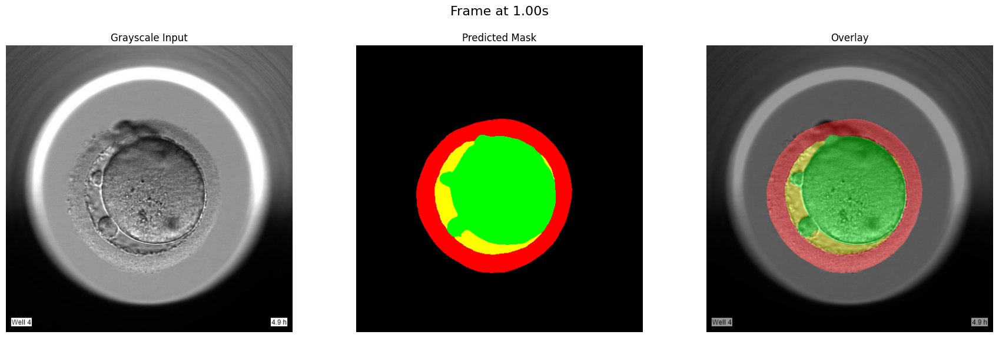

  Processing frame at 1.99s


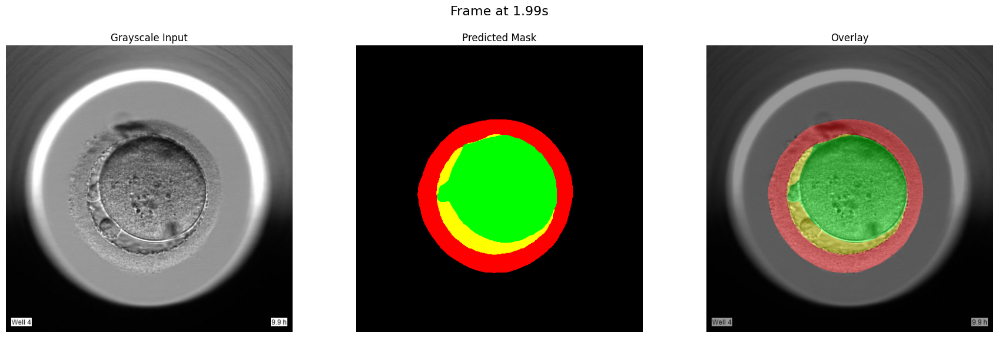

  Processing frame at 2.99s


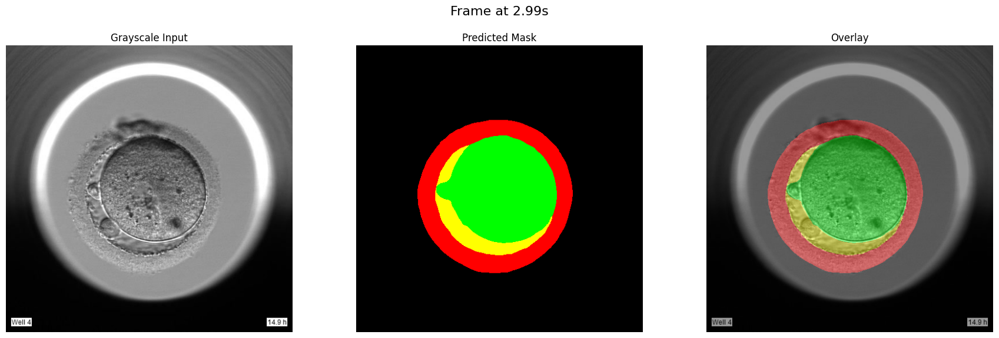

  Processing frame at 3.99s


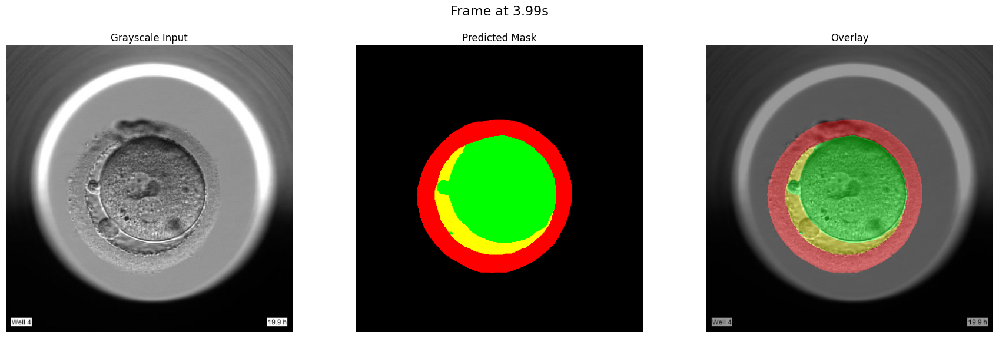

  Processing frame at 4.98s


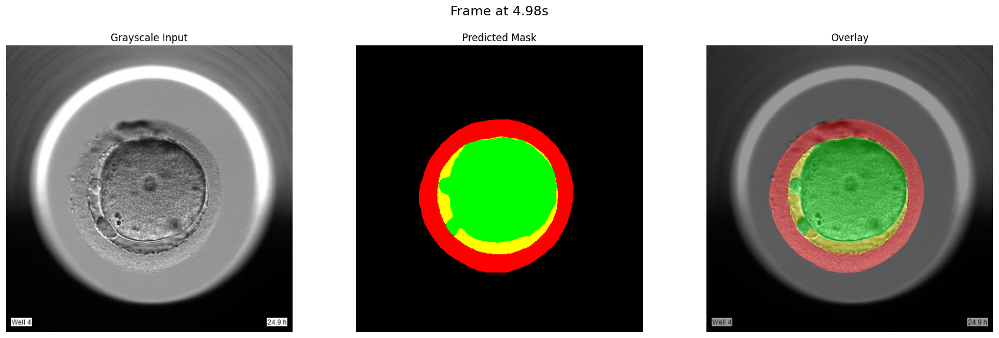

  Processing frame at 5.98s


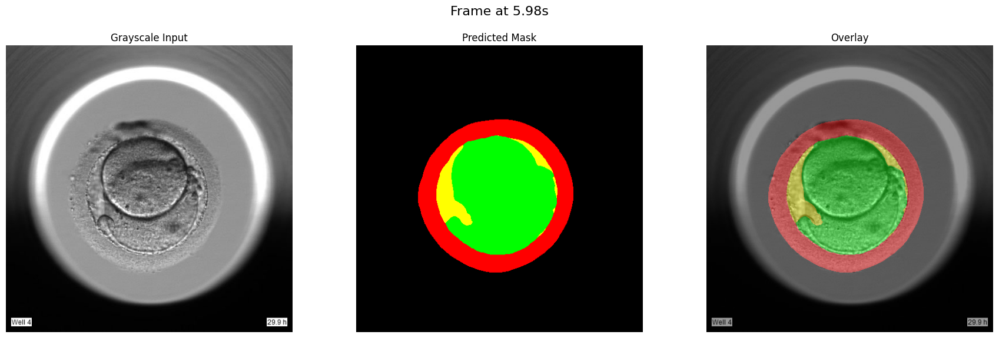

  Processing frame at 6.98s


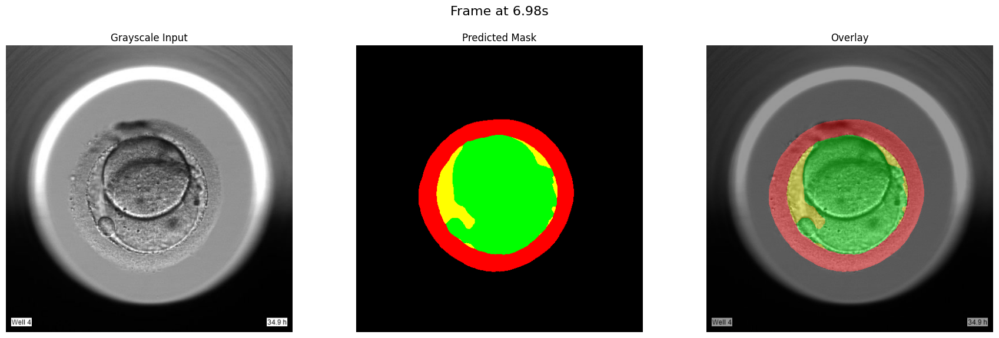

  Processing frame at 7.97s


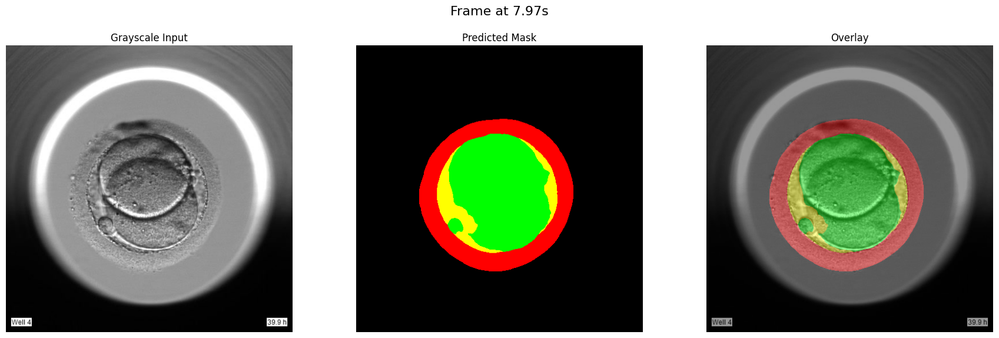

  Processing frame at 8.97s


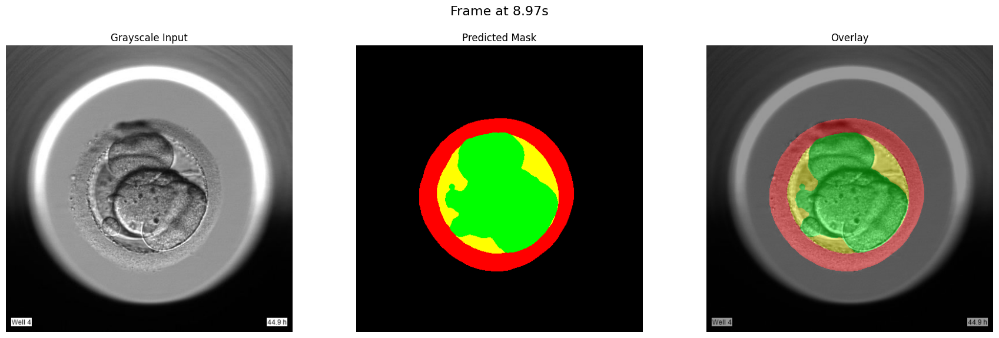

  Processing frame at 9.97s


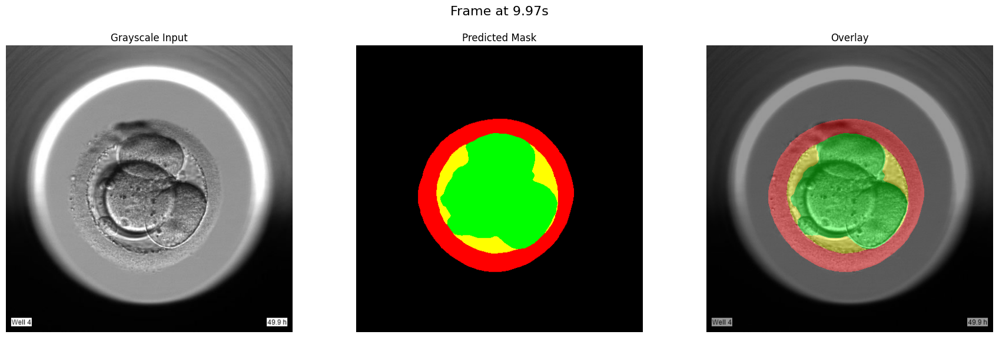

  Processing frame at 10.96s


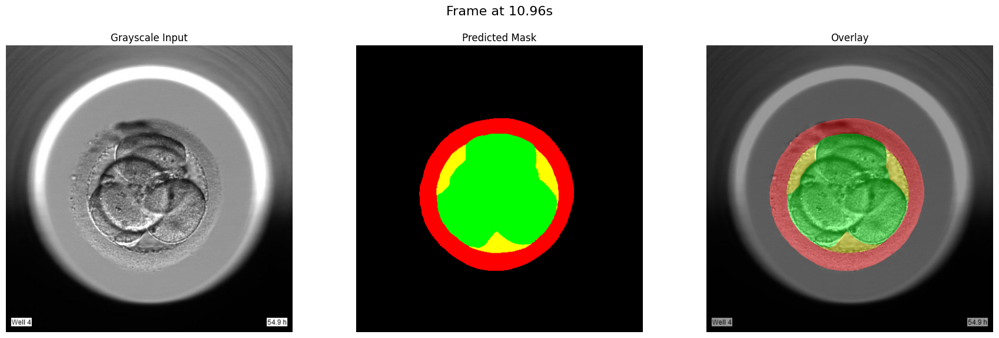

  Processing frame at 11.96s


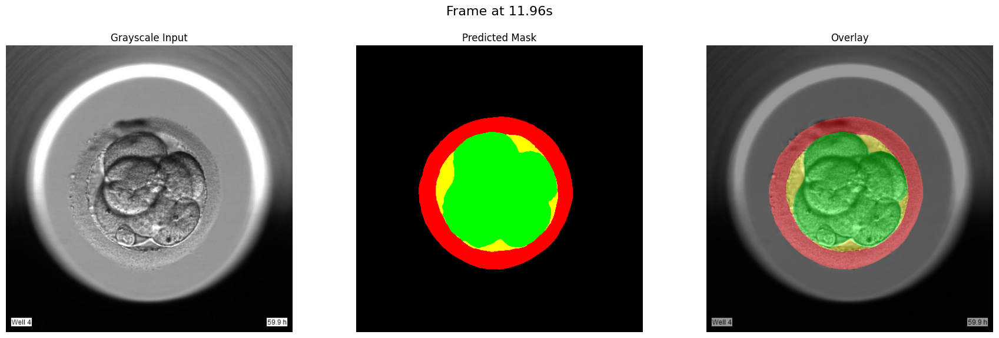

  Processing frame at 12.96s


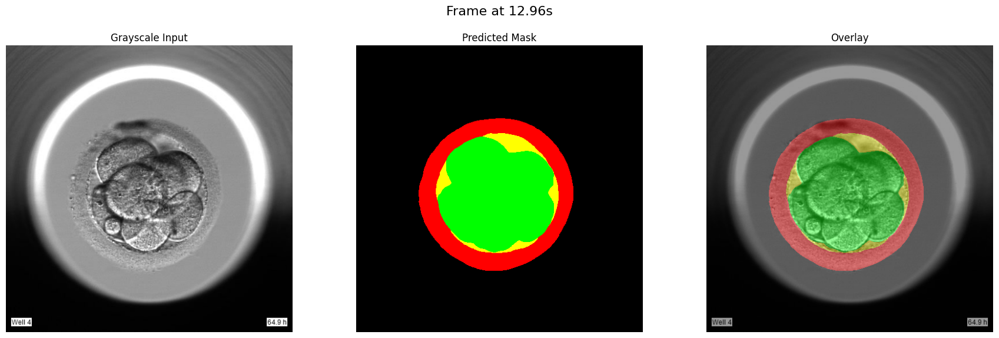

  Processing frame at 13.95s


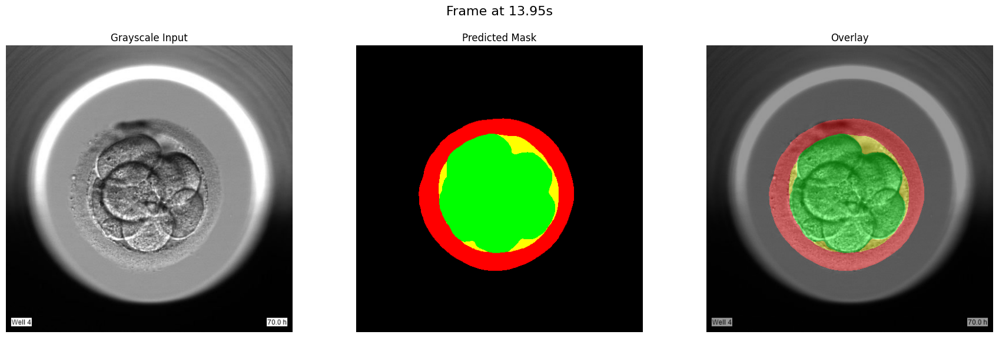

  Processing frame at 14.95s


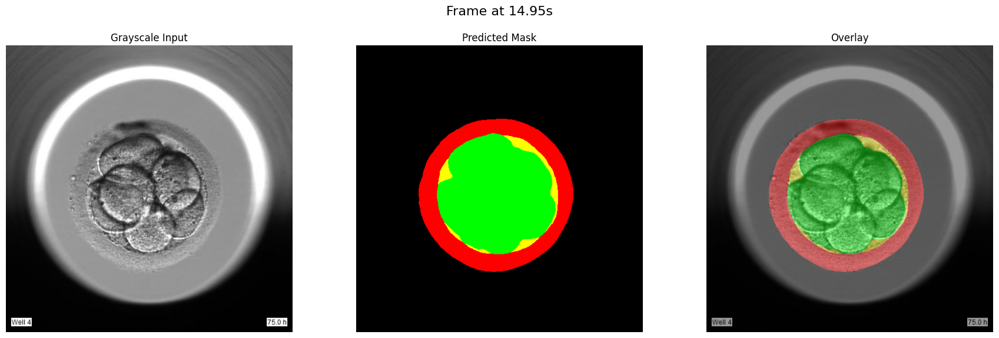

  Processing frame at 15.95s


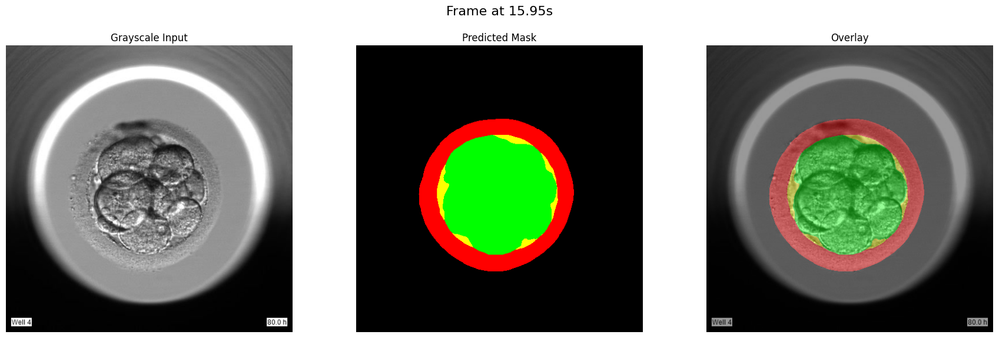

  Processing frame at 16.94s


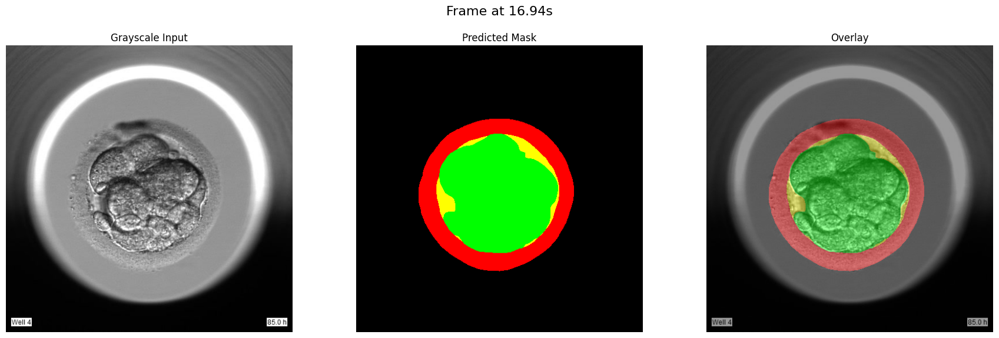

  Processing frame at 17.94s


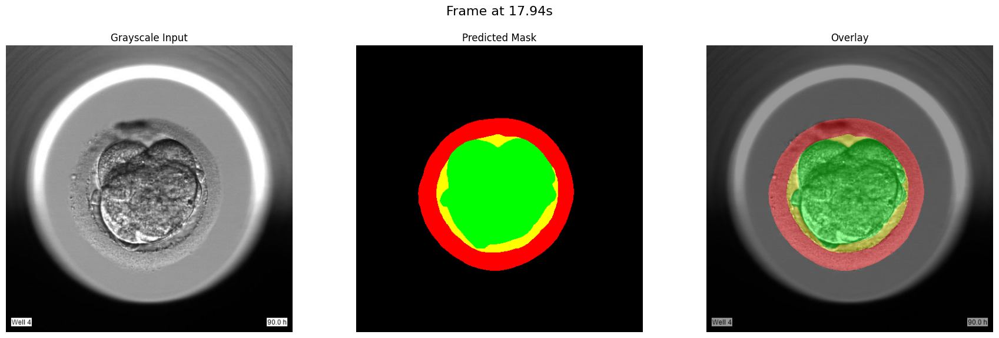

  Processing frame at 18.94s


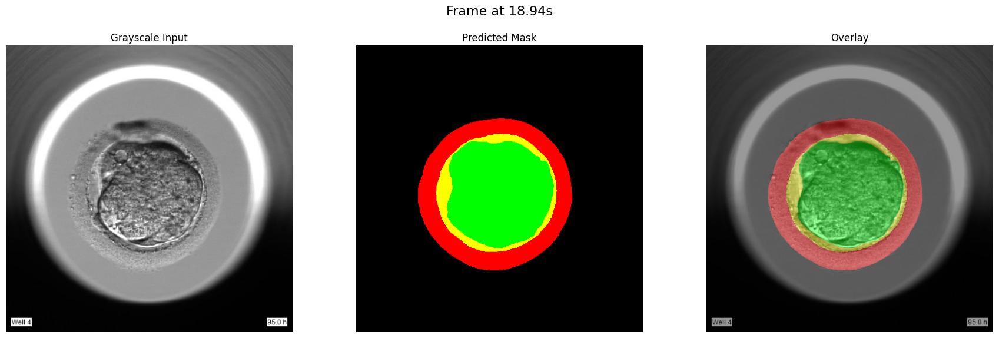

  Processing frame at 19.93s


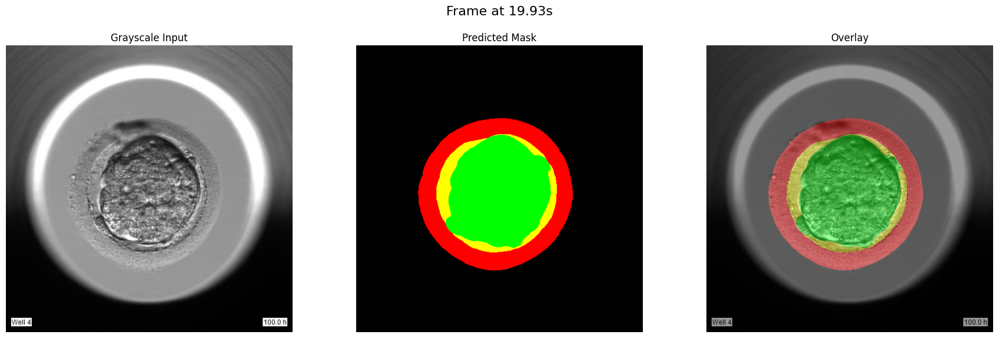

  Processing frame at 20.93s


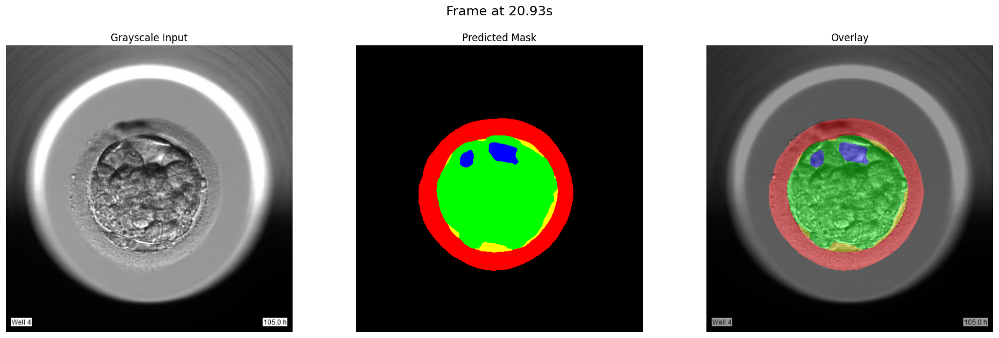

  Processing frame at 21.93s


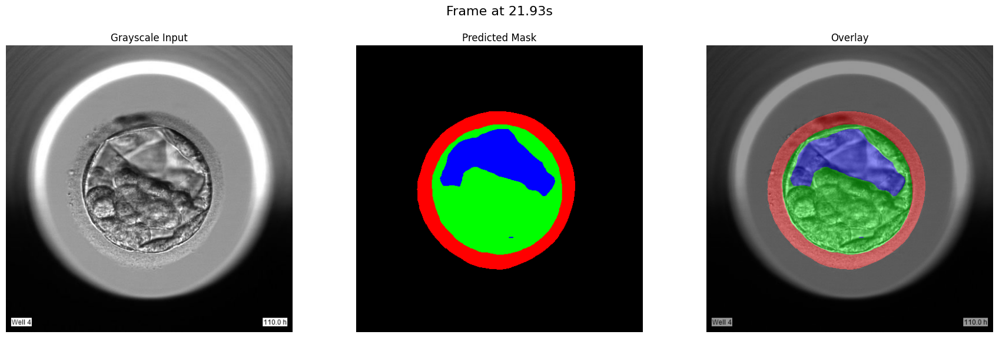

  Processing frame at 22.92s


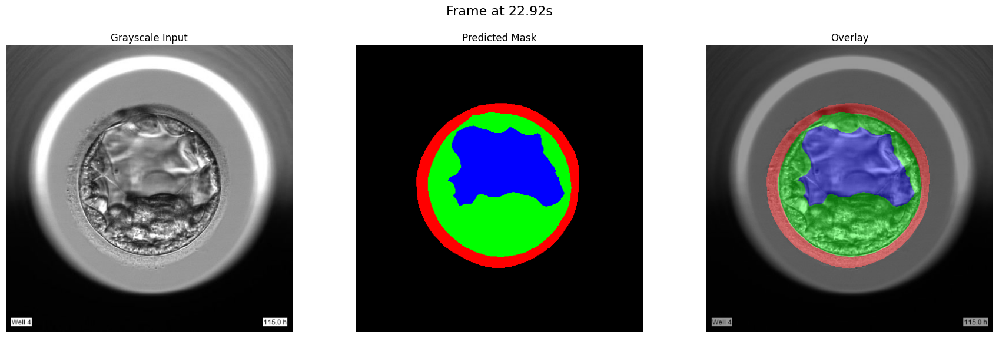

  Processing frame at 23.92s


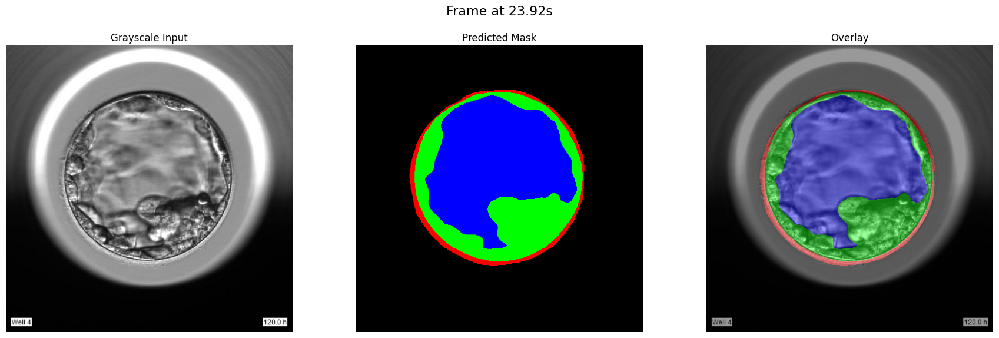

Visualization finished. Displayed 24 frames.
Visualization script finished.


In [ ]:
import cv2
import torch
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms
from datetime import timedelta
import matplotlib.pyplot as plt
from typing import Dict, List
# from scipy.interpolate import LSQUnivariateSpline # Not needed for visualization
import os
from pathlib import Path
import sys

# --- TransUNet Imports (Ensure these run) ---
if not os.path.isdir("TransUNet"):
     print("Cloning TransUNet repository...")
     os.system("git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git")
from TransUNet.networks.vit_seg_modeling import VisionTransformer as ViT_seg
from TransUNet.networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg

# --- Constants (Ensure these match your model/training) ---
NUM_CLASSES = 5
IMG_SIZE = 512
CLASS_NAMES = ["Black", "Red", "Green", "Blue", "Yellow"]

# --- Visualization Color Map (Class ID -> RGB tuple 0-1 range for matplotlib) ---
# Using 0-255 range initially, will normalize for imshow later if needed,
# but easier for OpenCV overlay this way.
VIS_COLORS_BGR = { # Using BGR for easy OpenCV compatibility
    0: (0, 0, 0),       # Black
    1: (0, 0, 255),     # Red
    2: (0, 255, 0),     # Green
    3: (255, 0, 0),     # Blue
    4: (0, 255, 255)    # Yellow
}

def colorize_mask(mask: np.ndarray) -> np.ndarray:
    """Converts a grayscale integer mask (HxW) to a color BGR image (HxWx3)."""
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color_bgr in VIS_COLORS_BGR.items():
        color_mask[mask == class_id] = color_bgr
    return color_mask

# --- predict_image function (remains the same) ---
def predict_image(model: torch.nn.Module, pil_image: Image.Image, device: torch.device) -> np.ndarray:
    """
    Predict segmentation mask for a single image using the 5-class model.
    Returns: numpy array with class indices (0: Black, 1: Red, 2: Green, 3: Blue, 4: Yellow)
    """
    transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    original_size = pil_image.size # PIL size is (width, height)
    input_tensor = transform(pil_image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        prediction = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
        prediction_pil = Image.fromarray(prediction.astype(np.uint8))
        prediction_pil = prediction_pil.resize(original_size, Image.NEAREST)
        prediction = np.array(prediction_pil)
    return prediction

# --- NEW Visualization Function ---
def visualize_predictions_for_video(
    video_path: str,
    model: torch.nn.Module,
    device: torch.device,
    start_second: int = 0,
    stop_second: int = 25,
    target_vis_fps: int = 2 # Target visualization FPS
):
    """
    Generates and displays visualizations (grayscale, mask, overlay)
    for frames sampled from a video within a time range.
    """
    if not Path(video_path).exists():
        print(f"Error: Video file not found at {video_path}")
        return

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    original_fps = cap.get(cv2.CAP_PROP_FPS)
    if original_fps == 0:
         print(f"Warning: Could not get FPS for video {video_path}. Assuming 30.")
         original_fps = 30

    frame_interval = max(1, int(original_fps // target_vis_fps))
    start_frame = start_second * int(original_fps)

    if stop_second is not None and stop_second <= start_second:
        print(f"Warning: stop_second ({stop_second}) is less than or equal to start_second ({start_second}). No frames will be visualized.")
        cap.release()
        return

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    current_frame = start_frame
    frames_processed_count = 0

    print(f"Visualizing {Path(video_path).name} from {start_second}s up to {stop_second}s at {target_vis_fps} analysis FPS...")

    while True:
        # Skip frames
        for _ in range(frame_interval - 1):
            ret, _ = cap.read()
            if not ret: break

        ret, frame_bgr = cap.read() # Read frame in BGR
        if not ret: break

        current_frame += frame_interval
        timestamp = timedelta(seconds=current_frame/original_fps)

        # Check stop condition
        if stop_second is not None and timestamp.total_seconds() > stop_second:
            print(f"Reached stop time ({stop_second:.2f}s). Stopping visualization.")
            break

        print(f"  Processing frame at {timestamp.total_seconds():.2f}s")
        frames_processed_count += 1

        # 1. Prepare Input Image
        frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(frame_rgb)
        # Also create grayscale version for display
        gray_image = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)
        # Convert grayscale back to 3 channels for consistent display/overlay
        gray_3channel = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR) # BGR format

        # 2. Get Prediction
        prediction_mask_int = predict_image(model, pil_image, device) # Returns HxW numpy int array

        # 3. Colorize Prediction (ensure it's same size as original frame)
        color_mask_bgr = colorize_mask(prediction_mask_int) # Returns HxWx3 numpy uint8 BGR

        # Ensure consistent dimensions (should be handled by predict_image resizing)
        if color_mask_bgr.shape[:2] != gray_3channel.shape[:2]:
             print(f"Warning: Dimension mismatch between frame ({gray_3channel.shape[:2]}) and mask ({color_mask_bgr.shape[:2]}). Resizing mask.")
             color_mask_bgr = cv2.resize(color_mask_bgr, (gray_3channel.shape[1], gray_3channel.shape[0]), interpolation=cv2.INTER_NEAREST)


        # 4. Create Overlay
        alpha = 0.6 # Opacity of the original frame
        beta = 0.4  # Opacity of the mask
        gamma = 0   # Scalar added to each sum
        overlay_bgr = cv2.addWeighted(gray_3channel, alpha, color_mask_bgr, beta, gamma)

        # 5. Display using Matplotlib
        fig, axes = plt.subplots(1, 3, figsize=(18, 6)) # Adjust figsize as needed
        fig.suptitle(f"Frame at {timestamp.total_seconds():.2f}s", fontsize=16)

        # Display Grayscale (convert BGR to RGB for plt)
        axes[0].imshow(cv2.cvtColor(gray_3channel, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Grayscale Input')
        axes[0].axis('off')

        # Display Color Mask (convert BGR to RGB for plt)
        axes[1].imshow(cv2.cvtColor(color_mask_bgr, cv2.COLOR_BGR2RGB))
        axes[1].set_title('Predicted Mask')
        axes[1].axis('off')

        # Display Overlay (convert BGR to RGB for plt)
        axes[2].imshow(cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB))
        axes[2].set_title('Overlay')
        axes[2].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
        plt.show()

    cap.release()
    print(f"Visualization finished. Displayed {frames_processed_count} frames.")


# --- Main Execution Block ---
if __name__ == "__main__":
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load the 5-class model
    print("Loading 5-class TransUNet model...")
    config_vit = CONFIGS_ViT_seg['R50-ViT-B_16']
    config_vit.n_classes = NUM_CLASSES
    config_vit.n_skip = 3
    config_vit.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)
    model = ViT_seg(config_vit, img_size=IMG_SIZE, num_classes=NUM_CLASSES).to(device)
    model_path = "/content/best_transunet.pth" # <--- Make sure this path is correct!
    if Path(model_path).exists():
        print(f"Loading model weights from {model_path}")
        model.load_state_dict(torch.load(model_path, map_location=device))
        print("Model weights loaded successfully.")
    else:
        print(f"Error: Model weights not found at {model_path}. Please check the path.")
        exit()

    # --- Call the Visualization Function ---
    video_input_folder = "/content/drive/MyDrive/All_Videos/All_Videos" #<--- Adjust if needed
    #target_video_name = "204049782_1100_10_A.avi"
    #target_video_name = "204035495_361_2_A.avi"
    #target_video_name = "204049782_1100_6_E.mov"
    target_video_name ="204135685_1170_1_A.mov"
    #target_video_name ="204135685_1170_2_A.mov"
    #target_video_name ="204135685_1189_2_E.avi"
    target_video_path = os.path.join(video_input_folder, target_video_name)

    visualize_predictions_for_video(
        video_path=target_video_path,
        model=model,
        device=device,
        start_second=0,
        stop_second=25, # Go up to 25 seconds
        target_vis_fps=1  # Sample 2 frames per second
    )

    print("Visualization script finished.")

    # Note: If you want to run the analysis *as well*, you would call
    # process_video_folder here separately. This script currently *only*
    # does the visualization for the single specified video.

In [ ]:
#### IBRA VIDEO EVAL


# ------------------------------------------------------------
# 0)  INSTALL & IMPORT
# ------------------------------------------------------------
# Ensure you have the necessary libraries from your training script
import os, sys, glob, pathlib
import cv2 # OpenCV for video processing
import pandas as pd
import numpy as np
from PIL import Image
from tqdm import tqdm # For progress bars

import torch
from torchvision import transforms

# Make sure the TransUNet code is in the path
if not os.path.isdir("TransUNet"):
    print("Cloning TransUNet repository...")
    !git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git
# Add TransUNet to system path
sys.path.append(str(pathlib.Path.cwd() / "TransUNet"))

from networks.vit_seg_modeling import VisionTransformer as ViT_seg
from networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg

# ------------------------------------------------------------
# 1)  CONFIGURATION (✅ EDIT THESE VALUES)
# ------------------------------------------------------------
VIDEO_DIR   = "/content/drive/MyDrive/prebiopsy"      # 👈 Directory containing your .mp4, .avi, etc. files
MODEL_PATH  = "/content/best_transunet.pth" # 👈 Path to your trained model weights
OUTPUT_CSV  = "/content/pixel_counts_report_artprebiopsy.csv" # 👈 Name of the output CSV file

# --- Model & Data settings (MUST match your training script) ---
IMG_SIZE      = 512
NUM_CLASSES   = 5
CLASS_MAPPING = {  # Map class ID -> Color Name (for CSV headers)
    # 0 is background, we can ignore it in the report
    1: "Red",
    2: "Green",
    3: "Blue",
    4: "Yellow"
}

# --- System settings ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------------------
# 2)  HELPER FUNCTIONS
# ------------------------------------------------------------
def load_model(model_path, num_classes):
    """Loads the TransUNet model with saved weights."""
    print("Loading model...", end="")
    # Define the model architecture exactly as in training
    cfg = CONFIGS_ViT_seg["R50-ViT-B_16"]
    cfg.n_classes = num_classes
    cfg.n_skip = 3
    cfg.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)

    model = ViT_seg(cfg, img_size=IMG_SIZE, num_classes=num_classes)

    # Load the saved state dictionary
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval() # Set model to evaluation mode
    print("✓ Done")
    return model

def get_inference_transforms():
    """Returns the validation transforms for input frames."""
    return transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3) # Use the same normalization as training
    ])

@torch.no_grad() # Disable gradient calculations for inference
def process_frame(frame_np, model, tf):
    """Runs a single frame through the model and returns the prediction mask."""
    # OpenCV loads images in BGR, convert to RGB for PIL and model
    frame_rgb = cv2.cvtColor(frame_np, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(frame_rgb)

    # Apply transforms and add a batch dimension
    input_tensor = tf(pil_img).unsqueeze(0).to(DEVICE)

    # Get model output
    logits = model(input_tensor)

    # Get the predicted class for each pixel
    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu()
    return pred_mask

def count_pixels(pred_mask, num_classes):
    """Counts pixels for each class in a prediction mask."""
    # `bincount` is a highly efficient way to count occurrences
    counts = torch.bincount(pred_mask.flatten(), minlength=num_classes)
    return counts.numpy()

# ------------------------------------------------------------
# 3)  MAIN EXECUTION
# ------------------------------------------------------------
def main():
    print(f"Using device: {DEVICE}")

    # Create the video directory if it doesn't exist
    pathlib.Path(VIDEO_DIR).mkdir(exist_ok=True)

    # Find all video files
    video_files = glob.glob(os.path.join(VIDEO_DIR, "*"))
    video_files = [v for v in video_files if v.lower().endswith(('.mp4', '.avi', '.mov', '.mkv'))]

    if not video_files:
        print(f"❌ No video files found in '{VIDEO_DIR}'.")
        print("Please upload your videos to that directory and run the script again.")
        return

    # Load model and transforms
    model = load_model(MODEL_PATH, NUM_CLASSES)
    transform = get_inference_transforms()

    all_results = []

    # Process each video
    for video_path in video_files:
        filename = os.path.basename(video_path)
        print(f"\nProcessing video: {filename}...")

        cap = cv2.VideoCapture(video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        # --- 1. GET THE FPS OF THE VIDEO ---
        fps = cap.get(cv2.CAP_PROP_FPS)

        frame_no = 0

        # Use tqdm for a nice progress bar
        with tqdm(total=total_frames, unit="frame") as pbar:
            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break # End of video

                # Run inference
                prediction_mask = process_frame(frame, model, transform)

                # Count pixels for each class
                pixel_counts = count_pixels(prediction_mask, NUM_CLASSES)

                # Store results
                # --- 2. ADD FPS TO THE ROW DATA ---
                row = {"Filename": filename, "Frame no": frame_no, "FPS": fps}
                for class_id, color_name in CLASS_MAPPING.items():
                    row[f"Pixel count: {color_name}"] = pixel_counts[class_id]

                all_results.append(row)

                frame_no += 1
                pbar.update(1)

        cap.release()

    # Create and save the final CSV report
    if not all_results:
        print("No frames were processed. The output CSV will not be created.")
        return

    print("\nCompiling results into a CSV...")
    df = pd.DataFrame(all_results)

    # Ensure column order
    # --- 3. ADD 'FPS' TO THE COLUMN LIST ---
    base_cols = ["Filename", "Frame no", "FPS"]
    count_cols = [f"Pixel count: {name}" for name in CLASS_MAPPING.values()]
    df = df[base_cols + count_cols]

    df.to_csv(OUTPUT_CSV, index=False)
    print(f"✓ Success! Report saved to: {OUTPUT_CSV}")

# Run the script
if __name__ == "__main__":
    main()




Using device: cuda
Loading model...✓ Done

Processing video: C6766_3.mp4...


100%|██████████| 58/58 [00:02<00:00, 22.76frame/s]



Processing video: C4222_1.mp4...


100%|██████████| 59/59 [00:02<00:00, 23.26frame/s]



Processing video: C1977_5.mp4...


100%|██████████| 91/91 [00:03<00:00, 22.89frame/s]



Processing video: C1955_3.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.23frame/s]



Processing video: C4593_1.mp4...


100%|██████████| 64/64 [00:02<00:00, 22.63frame/s]



Processing video: C5794_3.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.87frame/s]



Processing video: C3900_4.mp4...


100%|██████████| 67/67 [00:02<00:00, 22.65frame/s]



Processing video: C4059_6.mp4...


100%|██████████| 51/51 [00:04<00:00, 11.68frame/s]



Processing video: C2122_5.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.78frame/s]



Processing video: C8922_1.mp4...


100%|██████████| 70/70 [00:03<00:00, 22.52frame/s]



Processing video: C2648_7.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.04frame/s]



Processing video: C2693_4.mp4...


100%|██████████| 58/58 [00:02<00:00, 23.21frame/s]



Processing video: C4633_2.mp4...


100%|██████████| 69/69 [00:02<00:00, 23.25frame/s]



Processing video: C3492_3.mp4...


100%|██████████| 52/52 [00:02<00:00, 22.37frame/s]



Processing video: C2987_4.mp4...


100%|██████████| 68/68 [00:03<00:00, 22.51frame/s]



Processing video: C2618_9.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.19frame/s]



Processing video: C6033_1.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.38frame/s]



Processing video: C3671_2.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.31frame/s]



Processing video: C8748_2.mp4...


100%|██████████| 68/68 [00:03<00:00, 22.61frame/s]



Processing video: C11790_7.mp4...


100%|██████████| 52/52 [00:02<00:00, 23.18frame/s]



Processing video: C1829_10.mp4...


100%|██████████| 65/65 [00:02<00:00, 23.21frame/s]



Processing video: C3793_2.mp4...


100%|██████████| 55/55 [00:02<00:00, 23.05frame/s]



Processing video: C4059_4.mp4...


100%|██████████| 50/50 [00:02<00:00, 22.71frame/s]



Processing video: C14352_7.mp4...


100%|██████████| 61/61 [00:02<00:00, 22.50frame/s]



Processing video: C4752_7.mp4...


100%|██████████| 74/74 [00:03<00:00, 23.22frame/s]



Processing video: C4018_4.mp4...


100%|██████████| 59/59 [00:02<00:00, 23.12frame/s]



Processing video: C3043_6.mp4...


100%|██████████| 62/62 [00:02<00:00, 23.39frame/s]



Processing video: C6520_2.mp4...


100%|██████████| 65/65 [00:02<00:00, 22.98frame/s]



Processing video: C2026_2.mp4...


100%|██████████| 58/58 [00:02<00:00, 22.47frame/s]



Processing video: C14372_3.mp4...


100%|██████████| 64/64 [00:02<00:00, 23.07frame/s]



Processing video: C4654_1.mp4...


100%|██████████| 55/55 [00:02<00:00, 22.95frame/s]



Processing video: C14110_5.mp4...


100%|██████████| 41/41 [00:01<00:00, 22.63frame/s]



Processing video: C11696_2.mp4...


100%|██████████| 125/125 [00:05<00:00, 22.81frame/s]



Processing video: C1785_6.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.97frame/s]



Processing video: C4189_11.mp4...


100%|██████████| 45/45 [00:01<00:00, 23.23frame/s]



Processing video: C2198_1.mp4...


100%|██████████| 48/48 [00:02<00:00, 23.17frame/s]



Processing video: C4091_8.mp4...


100%|██████████| 49/49 [00:02<00:00, 23.15frame/s]



Processing video: C2058_4.mp4...


100%|██████████| 62/62 [00:02<00:00, 22.81frame/s]



Processing video: C8757_2.mp4...


100%|██████████| 90/90 [00:03<00:00, 22.60frame/s]



Processing video: C4611_2.mp4...


100%|██████████| 64/64 [00:02<00:00, 23.12frame/s]



Processing video: C9061_3.mp4...


100%|██████████| 54/54 [00:02<00:00, 23.29frame/s]



Processing video: C13028_2.mp4...


100%|██████████| 58/58 [00:02<00:00, 23.02frame/s]



Processing video: C2552_1.mp4...


100%|██████████| 62/62 [00:02<00:00, 22.58frame/s]



Processing video: C1635_9.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.14frame/s]



Processing video: C2195_10.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.13frame/s]



Processing video: C7682_3.mp4...


100%|██████████| 73/73 [00:03<00:00, 23.13frame/s]



Processing video: C6954_11.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.02frame/s]



Processing video: C6518_2.mp4...


100%|██████████| 53/53 [00:02<00:00, 23.03frame/s]



Processing video: C6817_4.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.26frame/s]



Processing video: C1638_3.mp4...


100%|██████████| 41/41 [00:01<00:00, 22.95frame/s]



Processing video: C13608+W12902_12.mp4...


100%|██████████| 15/15 [00:00<00:00, 22.60frame/s]



Processing video: C2066_2.mp4...


100%|██████████| 31/31 [00:01<00:00, 23.27frame/s]



Processing video: C3728_1.mp4...


100%|██████████| 52/52 [00:02<00:00, 22.55frame/s]



Processing video: C3430_1.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.16frame/s]



Processing video: C3180_5.mp4...


100%|██████████| 51/51 [00:02<00:00, 23.16frame/s]



Processing video: C1937_3.mp4...


100%|██████████| 38/38 [00:01<00:00, 23.26frame/s]



Processing video: C3999_2.mp4...


100%|██████████| 56/56 [00:02<00:00, 23.02frame/s]



Processing video: C12910_3.mp4...


100%|██████████| 74/74 [00:03<00:00, 22.14frame/s]



Processing video: C3966_2.mp4...


100%|██████████| 65/65 [00:02<00:00, 22.67frame/s]



Processing video: C6953_1.mp4...


100%|██████████| 72/72 [00:03<00:00, 23.21frame/s]



Processing video: C1710_9.mp4...


100%|██████████| 55/55 [00:02<00:00, 23.19frame/s]



Processing video: C4825_4.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.68frame/s]



Processing video: C5024_2.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.21frame/s]



Processing video: C2023_1.mp4...


100%|██████████| 51/51 [00:02<00:00, 22.86frame/s]



Processing video: C4063_1.mp4...


100%|██████████| 63/63 [00:02<00:00, 23.25frame/s]



Processing video: C4590_2.mp4...


100%|██████████| 68/68 [00:03<00:00, 22.51frame/s]



Processing video: C2320_3.mp4...


100%|██████████| 63/63 [00:02<00:00, 23.20frame/s]



Processing video: C3219_3.mp4...


100%|██████████| 50/50 [00:02<00:00, 23.21frame/s]



Processing video: C11902_5.mp4...


100%|██████████| 72/72 [00:03<00:00, 23.33frame/s]



Processing video: C5616_1.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.02frame/s]



Processing video: C2637_1.mp4...


100%|██████████| 53/53 [00:02<00:00, 23.02frame/s]



Processing video: C1701-10.mp4...


100%|██████████| 64/64 [00:02<00:00, 23.22frame/s]



Processing video: C10102_11.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.26frame/s]



Processing video: C3182_4.mp4...


100%|██████████| 50/50 [00:02<00:00, 23.19frame/s]



Processing video: C11223_6.mp4...


100%|██████████| 65/65 [00:02<00:00, 22.65frame/s]



Processing video: C8109_8.mp4...


100%|██████████| 59/59 [00:02<00:00, 23.19frame/s]



Processing video: C3796_5.mp4...


100%|██████████| 58/58 [00:02<00:00, 23.19frame/s]



Processing video: C13934_1.mp4...


100%|██████████| 59/59 [00:02<00:00, 23.15frame/s]



Processing video: C6244_9.mp4...


100%|██████████| 105/105 [00:04<00:00, 23.14frame/s]



Processing video: C9381_5.mp4...


100%|██████████| 51/51 [00:02<00:00, 22.96frame/s]



Processing video: C2097_8.mp4...


100%|██████████| 54/54 [00:02<00:00, 22.84frame/s]



Processing video: C12274_7.mp4...


100%|██████████| 65/65 [00:02<00:00, 23.29frame/s]



Processing video: C3953_10.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.13frame/s]



Processing video: C10043_7.mp4...


100%|██████████| 72/72 [00:03<00:00, 22.63frame/s]



Processing video: C3258_2.mp4...


100%|██████████| 53/53 [00:02<00:00, 23.33frame/s]



Processing video: C7719_1.mp4...


100%|██████████| 71/71 [00:03<00:00, 23.30frame/s]



Processing video: C8401_9.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.06frame/s]



Processing video: C4049_8.mp4...


100%|██████████| 67/67 [00:02<00:00, 22.44frame/s]



Processing video: C8880_1.mp4...


100%|██████████| 74/74 [00:03<00:00, 23.11frame/s]



Processing video: C2184_4.mp4...


100%|██████████| 55/55 [00:02<00:00, 22.71frame/s]



Processing video: C4037_2.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.07frame/s]



Processing video: C3206_2.mp4...


100%|██████████| 59/59 [00:02<00:00, 22.82frame/s]



Processing video: C6602_4.mp4...


100%|██████████| 70/70 [00:03<00:00, 22.82frame/s]



Processing video: C2290_10.mp4...


100%|██████████| 67/67 [00:02<00:00, 22.96frame/s]



Processing video: C13202_7.mp4...


100%|██████████| 71/71 [00:03<00:00, 22.99frame/s]



Processing video: C2733_6.mp4...


100%|██████████| 65/65 [00:02<00:00, 22.79frame/s]



Processing video: C2658_4.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.88frame/s]



Processing video: C4404_4.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.19frame/s]



Processing video: c8142_1.mp4...


100%|██████████| 63/63 [00:02<00:00, 22.98frame/s]



Processing video: C5343_5.mp4...


100%|██████████| 114/114 [00:04<00:00, 22.88frame/s]



Processing video: C8464_3.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.06frame/s]



Processing video: C2661_1.mp4...


100%|██████████| 62/62 [00:02<00:00, 23.30frame/s]



Processing video: C2407_3.mp4...


100%|██████████| 51/51 [00:02<00:00, 22.95frame/s]



Processing video: C14470_5.mp4...


100%|██████████| 64/64 [00:02<00:00, 22.95frame/s]



Processing video: C10473_11.mp4...


100%|██████████| 73/73 [00:03<00:00, 22.69frame/s]



Processing video: C3741_3.mp4...


100%|██████████| 68/68 [00:02<00:00, 23.20frame/s]



Processing video: C2213_2.mp4...


100%|██████████| 50/50 [00:02<00:00, 23.20frame/s]



Processing video: C2335_6.mp4...


100%|██████████| 33/33 [00:01<00:00, 23.18frame/s]



Processing video: C11541_5.mp4...


100%|██████████| 72/72 [00:03<00:00, 22.98frame/s]



Processing video: C4956_3.mp4...


100%|██████████| 71/71 [00:03<00:00, 22.81frame/s]



Processing video: C3706_1.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.99frame/s]



Processing video: C2097_4.mp4...


100%|██████████| 60/60 [00:02<00:00, 23.00frame/s]



Processing video: C8586_2.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.86frame/s]



Processing video: C9942_8.mp4...


100%|██████████| 60/60 [00:02<00:00, 22.72frame/s]



Processing video: C13247_5.mp4...


100%|██████████| 63/63 [00:02<00:00, 23.06frame/s]



Processing video: C5370_10.mp4...


100%|██████████| 58/58 [00:02<00:00, 23.08frame/s]



Processing video: C1961_7.mp4...


100%|██████████| 57/57 [00:02<00:00, 23.22frame/s]



Processing video: C2077_5.mp4...


100%|██████████| 65/65 [00:02<00:00, 22.61frame/s]



Processing video: C11813_12.mp4...


100%|██████████| 85/85 [00:03<00:00, 23.02frame/s]



Processing video: C2527_4.mp4...


100%|██████████| 62/62 [00:02<00:00, 23.22frame/s]



Processing video: C11775_8.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.28frame/s]



Processing video: C13602_9.mp4...


100%|██████████| 73/73 [00:03<00:00, 22.45frame/s]



Processing video: C3546_5.mp4...


100%|██████████| 65/65 [00:02<00:00, 23.27frame/s]



Processing video: C1985_7.mp4...


100%|██████████| 48/48 [00:02<00:00, 23.11frame/s]



Processing video: C4644_3.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.15frame/s]



Processing video: C11547_6.mp4...


100%|██████████| 71/71 [00:03<00:00, 22.85frame/s]



Processing video: C7724_9.mp4...


100%|██████████| 71/71 [00:03<00:00, 23.11frame/s]



Processing video: C1738_8.mp4...


100%|██████████| 71/71 [00:03<00:00, 22.78frame/s]



Processing video: C4278_12.mp4...


100%|██████████| 61/61 [00:02<00:00, 23.08frame/s]



Processing video: C1983_3.mp4...


100%|██████████| 68/68 [00:03<00:00, 22.59frame/s]



Processing video: C3741_5.mp4...


100%|██████████| 54/54 [00:02<00:00, 22.93frame/s]



Processing video: C14489_5.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.21frame/s]



Processing video: C12409_4.mp4...


100%|██████████| 65/65 [00:02<00:00, 23.25frame/s]



Processing video: C4188_2.mp4...


100%|██████████| 53/53 [00:02<00:00, 23.02frame/s]



Processing video: C4130_2.mp4...


100%|██████████| 57/57 [00:02<00:00, 22.34frame/s]



Processing video: C11911_1.mp4...


100%|██████████| 63/63 [00:02<00:00, 23.00frame/s]



Processing video: C2329_3.mp4...


100%|██████████| 56/56 [00:02<00:00, 23.03frame/s]



Processing video: C3563_1.mp4...


100%|██████████| 66/66 [00:02<00:00, 23.36frame/s]



Processing video: C2408_7.mp4...


100%|██████████| 94/94 [00:04<00:00, 22.73frame/s]



Processing video: C12858_1.mp4...


100%|██████████| 70/70 [00:03<00:00, 23.09frame/s]



Processing video: C22858_9.mp4...


100%|██████████| 58/58 [00:02<00:00, 23.02frame/s]



Processing video: C7078_4.mp4...


100%|██████████| 68/68 [00:02<00:00, 23.28frame/s]



Processing video: C2402_4.mp4...


100%|██████████| 57/57 [00:02<00:00, 22.55frame/s]



Processing video: C3089_3.mp4...


100%|██████████| 43/43 [00:01<00:00, 22.62frame/s]



Processing video: C14032_8.mp4...


100%|██████████| 57/57 [00:02<00:00, 23.09frame/s]



Processing video: C14123_7.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.27frame/s]



Processing video: C5129_1.mp4...


100%|██████████| 62/62 [00:02<00:00, 23.25frame/s]



Processing video: C7945_5.mp4...


100%|██████████| 72/72 [00:03<00:00, 22.75frame/s]



Processing video: C3189_4.mp4...


100%|██████████| 68/68 [00:02<00:00, 23.25frame/s]



Processing video: C2305_9.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.04frame/s]



Processing video: C2037_3.mp4...


100%|██████████| 67/67 [00:02<00:00, 23.25frame/s]



Processing video: C4290_5.mp4...


100%|██████████| 54/54 [00:02<00:00, 23.04frame/s]



Processing video: C2353_7.mp4...


100%|██████████| 40/40 [00:01<00:00, 22.96frame/s]



Processing video: C8570_11.mp4...


100%|██████████| 59/59 [00:02<00:00, 23.15frame/s]



Processing video: C11263_3.mp4...


100%|██████████| 87/87 [00:03<00:00, 23.17frame/s]



Processing video: C4304_9.mp4...


100%|██████████| 42/42 [00:01<00:00, 23.05frame/s]



Processing video: C13924_6.mp4...


100%|██████████| 58/58 [00:02<00:00, 22.59frame/s]



Processing video: C2682_1.mp4...


100%|██████████| 64/64 [00:02<00:00, 23.01frame/s]



Processing video: C3997_12.mp4...


100%|██████████| 55/55 [00:02<00:00, 22.86frame/s]



Processing video: C2699_3.mp4...


100%|██████████| 46/46 [00:01<00:00, 23.14frame/s]



Processing video: C2192_1.mp4...


100%|██████████| 53/53 [00:02<00:00, 23.18frame/s]



Processing video: C13078_6.mp4...


100%|██████████| 70/70 [00:03<00:00, 22.44frame/s]



Processing video: C14529_3.mp4...


100%|██████████| 68/68 [00:02<00:00, 23.08frame/s]



Processing video: C1979_7.mp4...


100%|██████████| 69/69 [00:02<00:00, 23.01frame/s]



Processing video: C4459_3.mp4...


100%|██████████| 70/70 [00:03<00:00, 23.20frame/s]



Processing video: C7081_5.mp4...


100%|██████████| 73/73 [00:03<00:00, 22.65frame/s]



Processing video: C6788_9.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.15frame/s]



Processing video: C7974_2.mp4...


100%|██████████| 94/94 [00:04<00:00, 23.11frame/s]



Processing video: C9031_8.mp4...


100%|██████████| 94/94 [00:04<00:00, 22.69frame/s]



Processing video: C9900_6.mp4...


100%|██████████| 123/123 [00:05<00:00, 23.16frame/s]



Processing video: C4582_8.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.05frame/s]



Processing video: C4960_1.mp4...


100%|██████████| 74/74 [00:03<00:00, 22.90frame/s]



Processing video: C4844_5.mp4...


100%|██████████| 94/94 [00:04<00:00, 23.18frame/s]



Processing video: C3100_2.mp4...


100%|██████████| 86/86 [00:03<00:00, 23.11frame/s]



Processing video: C5543_11.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.85frame/s]



Processing video: C6640_4.mp4...


100%|██████████| 90/90 [00:03<00:00, 23.12frame/s]



Processing video: C5298_2.mp4...


100%|██████████| 104/104 [00:04<00:00, 23.30frame/s]



Processing video: C9307_2.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.70frame/s]



Processing video: C4944_1.mp4...


100%|██████████| 118/118 [00:05<00:00, 23.18frame/s]



Processing video: C3417_1.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.15frame/s]



Processing video: C4182_1.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.72frame/s]



Processing video: C14296_1.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.14frame/s]



Processing video: C11844_2.mp4...


100%|██████████| 111/111 [00:04<00:00, 23.07frame/s]



Processing video: C8000_4.mp4...


100%|██████████| 107/107 [00:04<00:00, 22.79frame/s]



Processing video: C6176_7.mp4...


100%|██████████| 179/179 [00:07<00:00, 23.17frame/s]



Processing video: C6634_9.mp4...


100%|██████████| 113/113 [00:04<00:00, 22.94frame/s]



Processing video: C6351_1.mp4...


100%|██████████| 93/93 [00:04<00:00, 23.11frame/s]



Processing video: C1765_5.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.15frame/s]



Processing video: C8569_1.mp4...


100%|██████████| 138/138 [00:05<00:00, 23.07frame/s]



Processing video: C14656_9.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.13frame/s]



Processing video: C5146_5.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.95frame/s]



Processing video: C8552_7.mp4...


100%|██████████| 90/90 [00:03<00:00, 23.23frame/s]



Processing video: C3610_2.mp4...


100%|██████████| 76/76 [00:03<00:00, 23.05frame/s]



Processing video: C13799_4.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.79frame/s]



Processing video: C2323_2.mp4...


100%|██████████| 135/135 [00:05<00:00, 23.04frame/s]



Processing video: C8906_3.mp4...


100%|██████████| 158/158 [00:06<00:00, 22.75frame/s]



Processing video: C13144_12.mp4...


100%|██████████| 116/116 [00:04<00:00, 23.21frame/s]



Processing video: C6275_7.mp4...


100%|██████████| 117/117 [00:05<00:00, 22.94frame/s]



Processing video: C7949_1.mp4...


100%|██████████| 81/81 [00:03<00:00, 23.10frame/s]



Processing video: C12056_3.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.03frame/s]



Processing video: C14510_9.mp4...


100%|██████████| 115/115 [00:05<00:00, 22.83frame/s]



Processing video: C10670_2.mp4...


100%|██████████| 151/151 [00:06<00:00, 23.26frame/s]



Processing video: C11663_8.mp4...


100%|██████████| 138/138 [00:06<00:00, 22.81frame/s]



Processing video: C12684_4.mp4...


100%|██████████| 76/76 [00:03<00:00, 23.07frame/s]



Processing video: C9301_6.mp4...


100%|██████████| 172/172 [00:07<00:00, 22.95frame/s]



Processing video: C13033_6.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.16frame/s]



Processing video: C5278_5.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.13frame/s]



Processing video: C5768_10.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.64frame/s]



Processing video: C12017_7.mp4...


100%|██████████| 129/129 [00:05<00:00, 23.09frame/s]



Processing video: C2630_5.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.10frame/s]



Processing video: C4448_5.mp4...


100%|██████████| 107/107 [00:04<00:00, 22.76frame/s]



Processing video: C8861_1.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.15frame/s]



Processing video: C6334_6.mp4...


100%|██████████| 95/95 [00:04<00:00, 23.02frame/s]



Processing video: C13849_2.mp4...


100%|██████████| 117/117 [00:05<00:00, 22.88frame/s]



Processing video: C4534_4.mp4...


100%|██████████| 85/85 [00:03<00:00, 23.18frame/s]



Processing video: C2135_9.mp4...


100%|██████████| 100/100 [00:04<00:00, 22.71frame/s]



Processing video: C9178_2.mp4...


100%|██████████| 104/104 [00:04<00:00, 23.15frame/s]



Processing video: C4175_9.mp4...


100%|██████████| 82/82 [00:03<00:00, 23.14frame/s]



Processing video: C11258_7.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.99frame/s]



Processing video: C6487_4.mp4...


100%|██████████| 144/144 [00:06<00:00, 23.17frame/s]



Processing video: C13935_2.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.13frame/s]



Processing video: C5962_1.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.80frame/s]



Processing video: C5111_10.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.20frame/s]



Processing video: C5871_11.mp4...


100%|██████████| 81/81 [00:03<00:00, 23.01frame/s]



Processing video: C4339_5.mp4...


100%|██████████| 73/73 [00:03<00:00, 22.94frame/s]



Processing video: C12487_2.mp4...


100%|██████████| 125/125 [00:05<00:00, 23.18frame/s]



Processing video: C5588_1.mp4...


100%|██████████| 131/131 [00:05<00:00, 22.94frame/s]



Processing video: C12145+EBR_2.mp4...


100%|██████████| 124/124 [00:05<00:00, 23.10frame/s]



Processing video: C12908_2.mp4...


100%|██████████| 94/94 [00:04<00:00, 23.07frame/s]



Processing video: C3323_3.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.94frame/s]



Processing video: C5899_2.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.01frame/s]



Processing video: C8259_7.mp4...


100%|██████████| 174/174 [00:07<00:00, 22.98frame/s]



Processing video: C9163_1.mp4...


100%|██████████| 130/130 [00:05<00:00, 23.11frame/s]



Processing video: C9163_5.mp4...


100%|██████████| 96/96 [00:04<00:00, 23.05frame/s]



Processing video: C3004_4.mp4...


100%|██████████| 136/136 [00:05<00:00, 22.94frame/s]



Processing video: C12875_10.mp4...


100%|██████████| 81/81 [00:03<00:00, 23.06frame/s]



Processing video: C5283_6.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.04frame/s]



Processing video: C12917_1.mp4...


100%|██████████| 122/122 [00:05<00:00, 23.17frame/s]



Processing video: C13172_2.mp4...


100%|██████████| 80/80 [00:03<00:00, 23.21frame/s]



Processing video: C4530_5.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.79frame/s]



Processing video: C7849_1.mp4...


100%|██████████| 96/96 [00:04<00:00, 23.32frame/s]



Processing video: C8902_2.mp4...


100%|██████████| 116/116 [00:05<00:00, 22.85frame/s]



Processing video: C8748_6.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.84frame/s]



Processing video: C12949_2.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.14frame/s]



Processing video: C8264_3.mp4...


100%|██████████| 90/90 [00:03<00:00, 23.28frame/s]



Processing video: C3100_5.mp4...


100%|██████████| 74/74 [00:03<00:00, 22.65frame/s]



Processing video: C11432_4.mp4...


100%|██████████| 81/81 [00:03<00:00, 23.00frame/s]



Processing video: C5960_7.mp4...


100%|██████████| 130/130 [00:05<00:00, 23.28frame/s]



Processing video: C4656_3.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.83frame/s]



Processing video: C12949_3.mp4...


100%|██████████| 91/91 [00:03<00:00, 23.01frame/s]



Processing video: C4838_6.mp4...


100%|██████████| 146/146 [00:06<00:00, 22.97frame/s]



Processing video: C11509_6.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.99frame/s]



Processing video: C7945_8.mp4...


100%|██████████| 90/90 [00:03<00:00, 23.15frame/s]



Processing video: C4694_1.mp4...


100%|██████████| 107/107 [00:04<00:00, 22.87frame/s]



Processing video: C12520_5.mp4...


100%|██████████| 132/132 [00:05<00:00, 22.98frame/s]



Processing video: C12441_1.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.95frame/s]



Processing video: C12422_2.mp4...


100%|██████████| 96/96 [00:04<00:00, 22.82frame/s]



Processing video: C14164_8.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.10frame/s]



Processing video: C4027_7.mp4...


100%|██████████| 75/75 [00:03<00:00, 23.14frame/s]



Processing video: C2554_4.mp4...


100%|██████████| 91/91 [00:03<00:00, 22.83frame/s]



Processing video: C11559__5.mp4...


100%|██████████| 103/103 [00:04<00:00, 23.13frame/s]



Processing video: C12751_9.mp4...


100%|██████████| 103/103 [00:04<00:00, 23.04frame/s]



Processing video: C12594_8.mp4...


100%|██████████| 89/89 [00:03<00:00, 22.88frame/s]



Processing video: C5247_3.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.13frame/s]



Processing video: C8514_10.mp4...


100%|██████████| 173/173 [00:07<00:00, 23.00frame/s]



Processing video: C9047_2.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.22frame/s]



Processing video: C13072_4.mp4...


100%|██████████| 101/101 [00:04<00:00, 23.01frame/s]



Processing video: C6949_7.mp4...


100%|██████████| 107/107 [00:04<00:00, 23.05frame/s]



Processing video: C2195_11.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.22frame/s]



Processing video: C4358_3.mp4...


100%|██████████| 104/104 [00:04<00:00, 22.90frame/s]



Processing video: C5125_2.mp4...


100%|██████████| 128/128 [00:05<00:00, 23.09frame/s]



Processing video: C9026_3.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.07frame/s]



Processing video: C7990_6.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.77frame/s]



Processing video: C12487_5.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.01frame/s]



Processing video: C11118_4.mp4...


100%|██████████| 148/148 [00:06<00:00, 22.95frame/s]



Processing video: C2344_3.mp4...


100%|██████████| 95/95 [00:04<00:00, 23.12frame/s]



Processing video: C8122_2.mp4...


100%|██████████| 134/134 [00:05<00:00, 23.27frame/s]



Processing video: C12117_4.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.81frame/s]



Processing video: C6037_2.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.13frame/s]



Processing video: C8424_9.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.19frame/s]



Processing video: C4825_1.mp4...


100%|██████████| 137/137 [00:06<00:00, 22.82frame/s]



Processing video: C12426_4.mp4...


100%|██████████| 106/106 [00:04<00:00, 23.25frame/s]



Processing video: C13572_9.mp4...


100%|██████████| 106/106 [00:04<00:00, 22.99frame/s]



Processing video: C4448_3.mp4...


100%|██████████| 99/99 [00:04<00:00, 23.15frame/s]



Processing video: C8511_5.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.97frame/s]



Processing video: C5079_6.mp4...


100%|██████████| 113/113 [00:04<00:00, 22.88frame/s]



Processing video: C7598_1.mp4...


100%|██████████| 146/146 [00:06<00:00, 23.09frame/s]



Processing video: C5871_8.mp4...


100%|██████████| 88/88 [00:03<00:00, 22.86frame/s]



Processing video: C5032+W4125_8.mp4...


100%|██████████| 154/154 [00:06<00:00, 23.11frame/s]



Processing video: C2026_1.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.57frame/s]



Processing video: C4838_5.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.08frame/s]



Processing video: C6618_4.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.13frame/s]



Processing video: C9131_9.mp4...


100%|██████████| 106/106 [00:04<00:00, 23.02frame/s]



Processing video: C10731_4.mp4...


100%|██████████| 150/150 [00:06<00:00, 23.19frame/s]



Processing video: C2344_2.mp4...


100%|██████████| 119/119 [00:05<00:00, 23.01frame/s]



Processing video: C7353_6.mp4...


100%|██████████| 84/84 [00:03<00:00, 22.91frame/s]



Processing video: C12391_2.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.15frame/s]



Processing video: C14243_8.mp4...


100%|██████████| 90/90 [00:03<00:00, 22.99frame/s]



Processing video: C3020_7.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.16frame/s]



Processing video: C13090_2.mp4...


100%|██████████| 181/181 [00:07<00:00, 22.96frame/s]



Processing video: C9124_5.mp4...


100%|██████████| 146/146 [00:06<00:00, 23.11frame/s]



Processing video: C4789_2.mp4...


100%|██████████| 135/135 [00:05<00:00, 22.95frame/s]



Processing video: C2713_12.mp4...


100%|██████████| 99/99 [00:04<00:00, 23.37frame/s]



Processing video: C7152_3.mp4...


100%|██████████| 120/120 [00:05<00:00, 23.25frame/s]



Processing video: C6947_9.mp4...


100%|██████████| 84/84 [00:03<00:00, 22.63frame/s]



Processing video: C10199_1.mp4...


100%|██████████| 165/165 [00:07<00:00, 23.26frame/s]



Processing video: C9259_1.mp4...


100%|██████████| 103/103 [00:04<00:00, 22.97frame/s]



Processing video: C14092_2.mp4...


100%|██████████| 90/90 [00:03<00:00, 23.14frame/s]



Processing video: C10865_5.mp4...


100%|██████████| 118/118 [00:05<00:00, 23.07frame/s]



Processing video: C5227_6.mp4...


100%|██████████| 88/88 [00:03<00:00, 22.77frame/s]



Processing video: C10939_1.mp4...


100%|██████████| 108/108 [00:04<00:00, 23.23frame/s]



Processing video: C6873_2.mp4...


100%|██████████| 109/109 [00:04<00:00, 23.03frame/s]



Processing video: C5478_8.mp4...


100%|██████████| 127/127 [00:05<00:00, 23.02frame/s]



Processing video: C7783_1.mp4...


100%|██████████| 126/126 [00:05<00:00, 23.01frame/s]



Processing video: C5709_1.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.76frame/s]



Processing video: C9488_3.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.16frame/s]



Processing video: C11323_1.mp4...


100%|██████████| 130/130 [00:05<00:00, 23.08frame/s]



Processing video: C13868_7.mp4...


100%|██████████| 97/97 [00:04<00:00, 23.10frame/s]



Processing video: C11165_6.mp4...


100%|██████████| 101/101 [00:04<00:00, 23.04frame/s]



Processing video: C4238_1.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.68frame/s]



Processing video: C11120_6.mp4...


100%|██████████| 91/91 [00:03<00:00, 23.11frame/s]



Processing video: C11087_4.mp4...


100%|██████████| 131/131 [00:05<00:00, 23.15frame/s]



Processing video: C5102_6.mp4...


100%|██████████| 148/148 [00:06<00:00, 22.91frame/s]



Processing video: C2560_8.mp4...


100%|██████████| 108/108 [00:04<00:00, 23.11frame/s]



Processing video: C9101_2.mp4...


100%|██████████| 142/142 [00:06<00:00, 23.03frame/s]



Processing video: C9144_2.mp4...


100%|██████████| 161/161 [00:06<00:00, 23.13frame/s]



Processing video: C8080_3.mp4...


100%|██████████| 149/149 [00:06<00:00, 22.80frame/s]



Processing video: C7936_6.mp4...


100%|██████████| 128/128 [00:05<00:00, 23.13frame/s]



Processing video: C4697_6.mp4...


100%|██████████| 145/145 [00:06<00:00, 22.81frame/s]



Processing video: C5906_4.mp4...


100%|██████████| 103/103 [00:04<00:00, 23.11frame/s]



Processing video: C13466_7.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.91frame/s]



Processing video: C13542_3.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.16frame/s]



Processing video: C5087_3.mp4...


100%|██████████| 80/80 [00:03<00:00, 23.15frame/s]



Processing video: C8204_6.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.42frame/s]



Processing video: C3416_2.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.80frame/s]



Processing video: C8783_9.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.87frame/s]



Processing video: C10156_8.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.93frame/s]



Processing video: C2553_7.mp4...


100%|██████████| 110/110 [00:04<00:00, 23.04frame/s]



Processing video: C8285_2.mp4...


100%|██████████| 121/121 [00:05<00:00, 23.17frame/s]



Processing video: C11950_8.mp4...


100%|██████████| 113/113 [00:04<00:00, 22.85frame/s]



Processing video: C10906_2.mp4...


100%|██████████| 127/127 [00:05<00:00, 23.17frame/s]



Processing video: C7975_2.mp4...


100%|██████████| 147/147 [00:06<00:00, 22.98frame/s]



Processing video: C11047_7.mp4...


100%|██████████| 127/127 [00:05<00:00, 23.18frame/s]



Processing video: C5629_2.mp4...


100%|██████████| 89/89 [00:03<00:00, 22.96frame/s]



Processing video: C5221_3.mp4...


100%|██████████| 155/155 [00:06<00:00, 22.86frame/s]



Processing video: C8534_1.mp4...


100%|██████████| 132/132 [00:05<00:00, 23.01frame/s]



Processing video: C6354_4.mp4...


100%|██████████| 126/126 [00:05<00:00, 22.99frame/s]



Processing video: C13188_2.mp4...


100%|██████████| 122/122 [00:05<00:00, 23.02frame/s]



Processing video: C5262_5.mp4...


100%|██████████| 132/132 [00:05<00:00, 22.73frame/s]



Processing video: C5804_1.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.06frame/s]



Processing video: C1989_7.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.89frame/s]



Processing video: C11570_1.mp4...


100%|██████████| 99/99 [00:04<00:00, 23.09frame/s]



Processing video: C11221_5.mp4...


100%|██████████| 71/71 [00:03<00:00, 23.03frame/s]



Processing video: C6684_10.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.06frame/s]



Processing video: C7195_1.mp4...


100%|██████████| 105/105 [00:04<00:00, 23.07frame/s]



Processing video: C11690_10.mp4...


100%|██████████| 78/78 [00:03<00:00, 23.00frame/s]



Processing video: C13048_7.mp4...


100%|██████████| 167/167 [00:07<00:00, 23.06frame/s]



Processing video: C9381_1.mp4...


100%|██████████| 134/134 [00:05<00:00, 23.07frame/s]



Processing video: C3593_4.mp4...


100%|██████████| 71/71 [00:03<00:00, 22.87frame/s]



Processing video: C12687_4.mp4...


100%|██████████| 139/139 [00:06<00:00, 22.99frame/s]



Processing video: C11067_3.mp4...


100%|██████████| 101/101 [00:04<00:00, 23.19frame/s]



Processing video: C2184_2.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.87frame/s]



Processing video: C12540_2.mp4...


100%|██████████| 113/113 [00:04<00:00, 22.99frame/s]



Processing video: C12686+W11925_9.mp4...


100%|██████████| 88/88 [00:03<00:00, 23.04frame/s]



Processing video: C13665_3.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.92frame/s]



Processing video: C12418_2.mp4...


100%|██████████| 88/88 [00:03<00:00, 22.41frame/s]



Processing video: C8774_1.mp4...


100%|██████████| 83/83 [00:03<00:00, 22.75frame/s]



Processing video: C8633_6.mp4...


100%|██████████| 112/112 [00:04<00:00, 22.92frame/s]



Processing video: C2792_1.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.94frame/s]



Processing video: C10898_7.mp4...


100%|██████████| 89/89 [00:03<00:00, 22.92frame/s]



Processing video: C10552_7.mp4...


100%|██████████| 115/115 [00:05<00:00, 22.89frame/s]



Processing video: C13794+W13064_1.mp4...


100%|██████████| 164/164 [00:07<00:00, 23.00frame/s]



Processing video: C13991_4.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.90frame/s]



Processing video: C13525_3.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.97frame/s]



Processing video: C8304_12.mp4...


100%|██████████| 404/404 [00:17<00:00, 23.00frame/s]



Processing video: C4526_8.mp4...


100%|██████████| 152/152 [00:06<00:00, 22.97frame/s]



Processing video: C9241_1.mp4...


100%|██████████| 90/90 [00:03<00:00, 22.74frame/s]



Processing video: C2343_5.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.66frame/s]



Processing video: C6962_9.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.80frame/s]



Processing video: C5212_9.mp4...


100%|██████████| 141/141 [00:06<00:00, 22.92frame/s]



Processing video: C3806_10.mp4...


100%|██████████| 79/79 [00:03<00:00, 23.16frame/s]



Processing video: C5156_9.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.82frame/s]



Processing video: C9144_5.mp4...


100%|██████████| 159/159 [00:06<00:00, 22.99frame/s]



Processing video: C11655_5.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.91frame/s]



Processing video: C10958_6.mp4...


100%|██████████| 134/134 [00:05<00:00, 22.87frame/s]



Processing video: C9505_9.mp4...


100%|██████████| 103/103 [00:04<00:00, 23.24frame/s]



Processing video: C11490_5.mp4...


100%|██████████| 111/111 [00:04<00:00, 22.81frame/s]



Processing video: C4609_3.mp4...


100%|██████████| 82/82 [00:03<00:00, 23.28frame/s]



Processing video: C4474_2.mp4...


100%|██████████| 87/87 [00:03<00:00, 23.00frame/s]



Processing video: C11554_4.mp4...


100%|██████████| 121/121 [00:05<00:00, 22.79frame/s]



Processing video: C2121_2.mp4...


100%|██████████| 82/82 [00:03<00:00, 23.08frame/s]



Processing video: C6724_1.mp4...


100%|██████████| 138/138 [00:06<00:00, 22.88frame/s]



Processing video: C9451_5.mp4...


100%|██████████| 133/133 [00:05<00:00, 23.23frame/s]



Processing video: C8669_4.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.17frame/s]



Processing video: C8778_9.mp4...


100%|██████████| 103/103 [00:04<00:00, 22.84frame/s]



Processing video: C9144_4.mp4...


100%|██████████| 131/131 [00:05<00:00, 22.95frame/s]



Processing video: C9509_5.mp4...


100%|██████████| 112/112 [00:04<00:00, 22.69frame/s]



Processing video: C8202_6.mp4...


100%|██████████| 92/92 [00:03<00:00, 23.12frame/s]



Processing video: C13034_7.mp4...


100%|██████████| 144/144 [00:06<00:00, 23.04frame/s]



Processing video: C13564_6.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.81frame/s]



Processing video: C8698_9.mp4...


100%|██████████| 119/119 [00:05<00:00, 23.18frame/s]



Processing video: C8754_1.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.93frame/s]



Processing video: C10058_4.mp4...


100%|██████████| 114/114 [00:04<00:00, 23.04frame/s]



Processing video: C5340_3.mp4...


100%|██████████| 83/83 [00:03<00:00, 22.95frame/s]



Processing video: C11775_4.mp4...


100%|██████████| 99/99 [00:04<00:00, 21.91frame/s]



Processing video: C6523_2.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.96frame/s]



Processing video: C4570_3.mp4...


100%|██████████| 131/131 [00:05<00:00, 22.84frame/s]



Processing video: C11887_5.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.97frame/s]



Processing video: C3921_4.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.96frame/s]



Processing video: C4342_1.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.85frame/s]



Processing video: C9444_9.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.09frame/s]



Processing video: C14422_4.mp4...


100%|██████████| 73/73 [00:03<00:00, 23.15frame/s]



Processing video: C11751_5.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.96frame/s]



Processing video: C2361_1.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.78frame/s]



Processing video: C8925_1.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.94frame/s]



Processing video: C2335_9.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.92frame/s]



Processing video: C12544_1.mp4...


100%|██████████| 101/101 [00:04<00:00, 22.86frame/s]



Processing video: C6112_5.mp4...


100%|██████████| 154/154 [00:06<00:00, 23.05frame/s]



Processing video: C6805_8.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.87frame/s]



Processing video: C4530_10.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.18frame/s]



Processing video: C11626_11.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.91frame/s]



Processing video: C9099_6.mp4...


100%|██████████| 101/101 [00:04<00:00, 22.90frame/s]



Processing video: C11253_8.mp4...


100%|██████████| 76/76 [00:03<00:00, 23.16frame/s]



Processing video: C13237_2.mp4...


100%|██████████| 93/93 [00:04<00:00, 23.05frame/s]



Processing video: C7783_4.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.81frame/s]



Processing video: C5753_3.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.89frame/s]



Processing video: C8840_1.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.87frame/s]



Processing video: C6188_2.mp4...


100%|██████████| 107/107 [00:04<00:00, 22.76frame/s]



Processing video: C5952_8.mp4...


100%|██████████| 139/139 [00:06<00:00, 23.08frame/s]



Processing video: C8793_11.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.69frame/s]



Processing video: W12541_1.mp4...


100%|██████████| 145/145 [00:06<00:00, 22.98frame/s]



Processing video: C3066_6.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.89frame/s]



Processing video: C4550_5.mp4...


100%|██████████| 128/128 [00:05<00:00, 22.86frame/s]



Processing video: C11554_7.mp4...


100%|██████████| 110/110 [00:04<00:00, 23.07frame/s]



Processing video: C4431_1.mp4...


100%|██████████| 89/89 [00:03<00:00, 22.70frame/s]



Processing video: C13157_2.mp4...


100%|██████████| 107/107 [00:04<00:00, 23.07frame/s]



Processing video: C3756_3.mp4...


100%|██████████| 107/107 [00:04<00:00, 23.08frame/s]



Processing video: C12418_4.mp4...


100%|██████████| 123/123 [00:05<00:00, 22.91frame/s]



Processing video: C13741_1.mp4...


100%|██████████| 118/118 [00:05<00:00, 23.19frame/s]



Processing video: C9597_5.mp4...


100%|██████████| 160/160 [00:06<00:00, 23.05frame/s]



Processing video: C10013_8.mp4...


100%|██████████| 139/139 [00:06<00:00, 22.89frame/s]



Processing video: C11806_2.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.88frame/s]



Processing video: C5264_4.mp4...


100%|██████████| 101/101 [00:04<00:00, 23.10frame/s]



Processing video: C4839_6.mp4...


100%|██████████| 114/114 [00:04<00:00, 22.87frame/s]



Processing video: C3345_1.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.86frame/s]



Processing video: C13793_11.mp4...


100%|██████████| 103/103 [00:04<00:00, 23.05frame/s]



Processing video: C8726_9.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.97frame/s]



Processing video: C10183_1.mp4...


100%|██████████| 73/73 [00:03<00:00, 22.91frame/s]



Processing video: C3258_1.mp4...


100%|██████████| 85/85 [00:03<00:00, 23.13frame/s]



Processing video: C3641_8.mp4...


100%|██████████| 96/96 [00:04<00:00, 22.90frame/s]



Processing video: C12569_12.mp4...


100%|██████████| 130/130 [00:05<00:00, 22.92frame/s]



Processing video: C13095_5.mp4...


100%|██████████| 95/95 [00:04<00:00, 23.12frame/s]



Processing video: C5286_3.mp4...


100%|██████████| 80/80 [00:03<00:00, 22.74frame/s]



Processing video: C8016_1.mp4...


100%|██████████| 128/128 [00:05<00:00, 23.13frame/s]



Processing video: C1802_7.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.92frame/s]



Processing video: C13412_2.mp4...


100%|██████████| 94/94 [00:04<00:00, 22.77frame/s]



Processing video: C3171_12.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.88frame/s]



Processing video: C7823_7.mp4...


100%|██████████| 105/105 [00:04<00:00, 23.15frame/s]



Processing video: C13509_4.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.57frame/s]



Processing video: C4664_1.mp4...


100%|██████████| 79/79 [00:03<00:00, 23.21frame/s]



Processing video: C6557_1.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.89frame/s]



Processing video: C9566_5.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.47frame/s]



Processing video: C8421_2.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.99frame/s]



Processing video: C9421_2.mp4...


100%|██████████| 85/85 [00:03<00:00, 23.08frame/s]



Processing video: C11900_10.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.52frame/s]



Processing video: C11094_7.mp4...


100%|██████████| 95/95 [00:04<00:00, 23.20frame/s]



Processing video: C8641_7.mp4...


100%|██████████| 122/122 [00:05<00:00, 23.00frame/s]



Processing video: C6670_3.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.61frame/s]



Processing video: C9235_2.mp4...


100%|██████████| 127/127 [00:05<00:00, 23.02frame/s]



Processing video: C10152_5.mp4...


100%|██████████| 163/163 [00:07<00:00, 22.97frame/s]



Processing video: C8787_4.mp4...


100%|██████████| 99/99 [00:04<00:00, 23.02frame/s]



Processing video: C14188_10.mp4...


100%|██████████| 100/100 [00:04<00:00, 22.78frame/s]



Processing video: C13564_9.mp4...


100%|██████████| 123/123 [00:05<00:00, 23.09frame/s]



Processing video: C11090_2.mp4...


100%|██████████| 107/107 [00:04<00:00, 23.02frame/s]



Processing video: C10808_1.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.38frame/s]



Processing video: C4368_11.mp4...


100%|██████████| 100/100 [00:04<00:00, 23.11frame/s]



Processing video: C4089_5.mp4...


100%|██████████| 70/70 [00:03<00:00, 22.99frame/s]



Processing video: C5169_5.mp4...


100%|██████████| 148/148 [00:06<00:00, 23.02frame/s]



Processing video: C4008_1.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.80frame/s]



Processing video: C8893_6.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.69frame/s]



Processing video: C13184_4.mp4...


100%|██████████| 145/145 [00:06<00:00, 22.87frame/s]



Processing video: C11478_4.mp4...


100%|██████████| 73/73 [00:03<00:00, 23.11frame/s]



Processing video: C4760_3.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.85frame/s]



Processing video: C12231_10.mp4...


100%|██████████| 76/76 [00:03<00:00, 23.14frame/s]



Processing video: C1983_5.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.10frame/s]



Processing video: C5169_7.mp4...


100%|██████████| 122/122 [00:05<00:00, 22.84frame/s]



Processing video: C5574_10.mp4...


100%|██████████| 137/137 [00:05<00:00, 23.19frame/s]



Processing video: C11450_8.mp4...


100%|██████████| 86/86 [00:03<00:00, 23.12frame/s]



Processing video: C2073_4.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.85frame/s]



Processing video: C9331_1.mp4...


100%|██████████| 109/109 [00:04<00:00, 23.03frame/s]



Processing video: C6224_1.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.86frame/s]



Processing video: C13084_3.mp4...


100%|██████████| 75/75 [00:03<00:00, 23.12frame/s]



Processing video: C8871_3.mp4...


100%|██████████| 110/110 [00:04<00:00, 23.01frame/s]



Processing video: C2202_8.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.81frame/s]



Processing video: C4625_6.mp4...


100%|██████████| 108/108 [00:04<00:00, 23.00frame/s]



Processing video: C2136_1.mp4...


100%|██████████| 71/71 [00:03<00:00, 23.09frame/s]



Processing video: C13034_10.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.88frame/s]



Processing video: W7998_1.mp4...


100%|██████████| 95/95 [00:04<00:00, 23.00frame/s]



Processing video: C11890_6.mp4...


100%|██████████| 155/155 [00:06<00:00, 23.04frame/s]



Processing video: C12819_12.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.76frame/s]



Processing video: C7990_12.mp4...


100%|██████████| 83/83 [00:03<00:00, 22.86frame/s]



Processing video: C8421_1.mp4...


100%|██████████| 91/91 [00:03<00:00, 22.79frame/s]



Processing video: C11196_2.mp4...


100%|██████████| 152/152 [00:06<00:00, 22.90frame/s]



Processing video: C12667_8.mp4...


100%|██████████| 94/94 [00:04<00:00, 23.08frame/s]



Processing video: C8778_5.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.86frame/s]



Processing video: C13144_7.mp4...


100%|██████████| 140/140 [00:06<00:00, 23.10frame/s]



Processing video: C7586_11.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.52frame/s]



Processing video: C8488_8.mp4...


100%|██████████| 97/97 [00:04<00:00, 23.12frame/s]



Processing video: C11351_1.mp4...


100%|██████████| 144/144 [00:06<00:00, 22.89frame/s]



Processing video: C5176_1.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.39frame/s]



Processing video: C3814_4.mp4...


100%|██████████| 80/80 [00:03<00:00, 22.67frame/s]



Processing video: C8403_7.mp4...


100%|██████████| 103/103 [00:04<00:00, 22.91frame/s]



Processing video: C14126_1.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.58frame/s]



Processing video: C11618_1.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.95frame/s]



Processing video: C9197_2.mp4...


100%|██████████| 111/111 [00:04<00:00, 22.73frame/s]



Processing video: C5169_6.mp4...


100%|██████████| 122/122 [00:05<00:00, 23.11frame/s]



Processing video: C2270_2.mp4...


100%|██████████| 74/74 [00:03<00:00, 23.09frame/s]



Processing video: C11742_3.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.81frame/s]



Processing video: C10742_3.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.89frame/s]



Processing video: C12790_2.mp4...


100%|██████████| 128/128 [00:05<00:00, 22.91frame/s]



Processing video: C10651_8.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.79frame/s]



Processing video: C13557_1.mp4...


100%|██████████| 77/77 [00:03<00:00, 23.01frame/s]



Processing video: C8678_4.mp4...


100%|██████████| 101/101 [00:04<00:00, 22.99frame/s]



Processing video: C7982_5.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.69frame/s]



Processing video: C11402_3.mp4...


100%|██████████| 151/151 [00:06<00:00, 22.89frame/s]



Processing video: C8809_6.mp4...


100%|██████████| 122/122 [00:05<00:00, 22.91frame/s]



Processing video: C9157_6.mp4...


100%|██████████| 123/123 [00:05<00:00, 22.96frame/s]



Processing video: C7628_1.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.73frame/s]



Processing video: C8372_12.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.89frame/s]



Processing video: C11264_8.mp4...


100%|██████████| 147/147 [00:06<00:00, 22.98frame/s]



Processing video: C2700_3.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.72frame/s]



Processing video: C13144_2.mp4...


100%|██████████| 91/91 [00:03<00:00, 23.11frame/s]



Processing video: C10078_8.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.93frame/s]



Processing video: C12966_3.mp4...


100%|██████████| 133/133 [00:05<00:00, 22.66frame/s]



Processing video: C13021_2.mp4...


100%|██████████| 129/129 [00:05<00:00, 22.92frame/s]



Processing video: C5890_4.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.56frame/s]



Processing video: C14843_2.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.06frame/s]



Processing video: C8075_5.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.96frame/s]



Processing video: C5351_2.mp4...


100%|██████████| 132/132 [00:05<00:00, 22.83frame/s]



Processing video: C2290_2.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.80frame/s]



Processing video: C13107_6.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.67frame/s]



Processing video: C13075_8.mp4...


100%|██████████| 73/73 [00:03<00:00, 21.90frame/s]



Processing video: C8369_2.mp4...


100%|██████████| 103/103 [00:04<00:00, 22.99frame/s]



Processing video: C6247_4.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.71frame/s]



Processing video: C9129+W8592_1.mp4...


100%|██████████| 81/81 [00:03<00:00, 22.71frame/s]



Processing video: C2073_2.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.08frame/s]



Processing video: C13051_9.mp4...


100%|██████████| 129/129 [00:05<00:00, 22.78frame/s]



Processing video: C5353_2.mp4...


100%|██████████| 104/104 [00:04<00:00, 23.20frame/s]



Processing video: C3599_1.mp4...


100%|██████████| 76/76 [00:03<00:00, 23.07frame/s]



Processing video: C4913_5.mp4...


100%|██████████| 125/125 [00:05<00:00, 22.85frame/s]



Processing video: C8431_11.mp4...


100%|██████████| 117/117 [00:05<00:00, 22.98frame/s]



Processing video: C13821_6.mp4...


100%|██████████| 83/83 [00:03<00:00, 22.88frame/s]



Processing video: C2747_3.mp4...


100%|██████████| 85/85 [00:03<00:00, 23.00frame/s]



Processing video: C6573_5.mp4...


100%|██████████| 102/102 [00:04<00:00, 23.07frame/s]



Processing video: C12029_9.mp4...


100%|██████████| 88/88 [00:03<00:00, 22.63frame/s]



Processing video: C12752_3.mp4...


100%|██████████| 122/122 [00:05<00:00, 23.14frame/s]



Processing video: C5255_1.mp4...


100%|██████████| 101/101 [00:04<00:00, 22.98frame/s]



Processing video: C11106_9.mp4...


100%|██████████| 106/106 [00:04<00:00, 22.73frame/s]



Processing video: C11592_9.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.98frame/s]



Processing video: C11483_4.mp4...


100%|██████████| 112/112 [00:04<00:00, 22.85frame/s]



Processing video: C13028_12.mp4...


100%|██████████| 107/107 [00:04<00:00, 22.73frame/s]



Processing video: C6829_8.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.91frame/s]



Processing video: C4293_6.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.78frame/s]



Processing video: C7891_8.mp4...


100%|██████████| 126/126 [00:05<00:00, 22.74frame/s]



Processing video: C6571_6.mp4...


100%|██████████| 122/122 [00:05<00:00, 22.96frame/s]



Processing video: C12349_9.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.66frame/s]



Processing video: C8540_2.mp4...


100%|██████████| 107/107 [00:04<00:00, 23.04frame/s]



Processing video: C14264_1.mp4...


100%|██████████| 111/111 [00:04<00:00, 22.86frame/s]



Processing video: C3460_1.mp4...


100%|██████████| 110/110 [00:04<00:00, 22.99frame/s]



Processing video: C4817_5.mp4...


100%|██████████| 86/86 [00:03<00:00, 23.01frame/s]



Processing video: C13138_5.mp4...


100%|██████████| 114/114 [00:05<00:00, 22.77frame/s]



Processing video: C8155_6.mp4...


100%|██████████| 101/101 [00:04<00:00, 23.14frame/s]



Processing video: C13001_4.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.94frame/s]



Processing video: c8531_10.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.80frame/s]



Processing video: c13123_6.mp4...


100%|██████████| 154/154 [00:06<00:00, 22.64frame/s]



Processing video: C10168_12.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.80frame/s]



Processing video: C2349_5.mp4...


100%|██████████| 98/98 [00:04<00:00, 22.91frame/s]



Processing video: C12692_7.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.96frame/s]



Processing video: C6059_7.mp4...


100%|██████████| 145/145 [00:06<00:00, 22.74frame/s]



Processing video: C8593_8.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.91frame/s]



Processing video: C2235_4.mp4...


100%|██████████| 72/72 [00:03<00:00, 22.98frame/s]



Processing video: C7650_12.mp4...


100%|██████████| 144/144 [00:06<00:00, 22.85frame/s]



Processing video: C2407_11.mp4...


100%|██████████| 80/80 [00:03<00:00, 23.01frame/s]



Processing video: C12452_5.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.96frame/s]



Processing video: C1966_4.mp4...


100%|██████████| 100/100 [00:04<00:00, 22.79frame/s]



Processing video: C12494_3.mp4...


100%|██████████| 121/121 [00:05<00:00, 23.07frame/s]



Processing video: C11683_7.mp4...


100%|██████████| 99/99 [00:04<00:00, 22.88frame/s]



Processing video: W11974_7.mp4...


100%|██████████| 110/110 [00:04<00:00, 22.91frame/s]



Processing video: C3295_11.mp4...


100%|██████████| 127/127 [00:05<00:00, 23.11frame/s]



Processing video: C8954_7.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.88frame/s]



Processing video: C4538_3.mp4...


100%|██████████| 158/158 [00:06<00:00, 22.78frame/s]



Processing video: C10722_3.mp4...


100%|██████████| 173/173 [00:07<00:00, 22.89frame/s]



Processing video: C8748_9.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.88frame/s]



Processing video: C6163_3.mp4...


100%|██████████| 98/98 [00:04<00:00, 22.81frame/s]



Processing video: C4838_8.mp4...


100%|██████████| 93/93 [00:04<00:00, 23.02frame/s]



Processing video: C2952_2.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.96frame/s]



Processing video: C7714_1.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.76frame/s]



Processing video: C9295_1.mp4...


100%|██████████| 137/137 [00:05<00:00, 22.97frame/s]



Processing video: C11354_4.mp4...


100%|██████████| 136/136 [00:05<00:00, 22.73frame/s]



Processing video: C11586_3.mp4...


100%|██████████| 135/135 [00:05<00:00, 23.00frame/s]



Processing video: C5973_2.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.94frame/s]



Processing video: C10816_5.mp4...


100%|██████████| 100/100 [00:04<00:00, 22.94frame/s]



Processing video: C2915_1.mp4...


100%|██████████| 110/110 [00:04<00:00, 23.01frame/s]



Processing video: C13511_7.mp4...


100%|██████████| 91/91 [00:04<00:00, 22.62frame/s]



Processing video: C5068_3.mp4...


100%|██████████| 120/120 [00:05<00:00, 23.03frame/s]



Processing video: C6145_1.mp4...


100%|██████████| 113/113 [00:04<00:00, 22.91frame/s]



Processing video: C8563_3.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.67frame/s]



Processing video: C13297_10.mp4...


100%|██████████| 92/92 [00:03<00:00, 23.03frame/s]



Processing video: C9598_5.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.75frame/s]



Processing video: C5464_6.mp4...


100%|██████████| 98/98 [00:04<00:00, 23.03frame/s]



Processing video: C12550_3.mp4...


100%|██████████| 151/151 [00:06<00:00, 23.12frame/s]



Processing video: C12889_9.mp4...


100%|██████████| 141/141 [00:06<00:00, 22.75frame/s]



Processing video: C8504_4.mp4...


100%|██████████| 82/82 [00:03<00:00, 23.12frame/s]



Processing video: C8443_3.mp4...


100%|██████████| 128/128 [00:05<00:00, 22.96frame/s]



Processing video: C8113_2.mp4...


100%|██████████| 137/137 [00:05<00:00, 23.05frame/s]



Processing video: C11602_2.mp4...


100%|██████████| 127/127 [00:05<00:00, 22.75frame/s]



Processing video: C9011_7.mp4...


100%|██████████| 108/108 [00:04<00:00, 23.10frame/s]



Processing video: C3030_12.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.06frame/s]



Processing video: C13163_6.mp4...


100%|██████████| 118/118 [00:05<00:00, 22.81frame/s]



Processing video: C12653_3.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.97frame/s]



Processing video: C11536_9.mp4...


100%|██████████| 123/123 [00:05<00:00, 22.88frame/s]



Processing video: C13260+W12956_3.mp4...


100%|██████████| 83/83 [00:03<00:00, 22.62frame/s]



Processing video: C11758_2.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.97frame/s]



Processing video: C4479_1.mp4...


100%|██████████| 89/89 [00:03<00:00, 22.76frame/s]



Processing video: C12533_2.mp4...


100%|██████████| 104/104 [00:04<00:00, 22.82frame/s]



Processing video: C9404_3.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.87frame/s]



Processing video: C12614_1.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.94frame/s]



Processing video: C5171_5.mp4...


100%|██████████| 136/136 [00:05<00:00, 22.74frame/s]



Processing video: C6178_3.mp4...


100%|██████████| 155/155 [00:06<00:00, 22.89frame/s]



Processing video: C13297_12.mp4...


100%|██████████| 98/98 [00:04<00:00, 22.89frame/s]



Processing video: C8911_4.mp4...


100%|██████████| 82/82 [00:03<00:00, 23.09frame/s]



Processing video: C7751_2.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.69frame/s]



Processing video: C13286_7.mp4...


100%|██████████| 116/116 [00:05<00:00, 22.42frame/s]



Processing video: C5075_4.mp4...


100%|██████████| 117/117 [00:05<00:00, 23.03frame/s]



Processing video: C11914_1.mp4...


100%|██████████| 82/82 [00:03<00:00, 22.74frame/s]



Processing video: C11977_2.mp4...


100%|██████████| 132/132 [00:05<00:00, 23.07frame/s]



Processing video: C5871_7.mp4...


100%|██████████| 78/78 [00:03<00:00, 23.06frame/s]



Processing video: C4442_10.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.90frame/s]



Processing video: C14138_5.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.62frame/s]



Processing video: C12299_1.mp4...


100%|██████████| 92/92 [00:04<00:00, 22.47frame/s]



Processing video: C6011_11.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.67frame/s]



Processing video: C3686_2.mp4...


100%|██████████| 124/124 [00:05<00:00, 22.98frame/s]



Processing video: C3718_4.mp4...


100%|██████████| 109/109 [00:04<00:00, 22.85frame/s]



Processing video: C6346_5.mp4...


100%|██████████| 120/120 [00:05<00:00, 22.92frame/s]



Processing video: C14518_8.mp4...


100%|██████████| 99/99 [00:04<00:00, 23.07frame/s]



Processing video: C4639_1.mp4...


100%|██████████| 91/91 [00:04<00:00, 22.70frame/s]



Processing video: C4374_5.mp4...


100%|██████████| 93/93 [00:04<00:00, 22.86frame/s]



Processing video: C5088_5.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.98frame/s]



Processing video: C12391_11.mp4...


100%|██████████| 87/87 [00:03<00:00, 22.72frame/s]



Processing video: C11746_11.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.96frame/s]



Processing video: C13474_4.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.00frame/s]



Processing video: C10075_3.mp4...


100%|██████████| 96/96 [00:04<00:00, 22.72frame/s]



Processing video: C5057_2.mp4...


100%|██████████| 138/138 [00:05<00:00, 23.08frame/s]



Processing video: C10066_9.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.94frame/s]



Processing video: C5211_5.mp4...


100%|██████████| 100/100 [00:04<00:00, 22.76frame/s]



Processing video: C6863_2.mp4...


100%|██████████| 110/110 [00:04<00:00, 22.99frame/s]



Processing video: C7122_1.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.69frame/s]



Processing video: C2019_8.mp4...


100%|██████████| 140/140 [00:06<00:00, 23.04frame/s]



Processing video: C3295_4.mp4...


100%|██████████| 83/83 [00:03<00:00, 23.02frame/s]



Processing video: C12515_4.mp4...


100%|██████████| 102/102 [00:04<00:00, 22.72frame/s]



Processing video: C4622_6.mp4...


100%|██████████| 105/105 [00:04<00:00, 23.09frame/s]



Processing video: C9452_12.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.99frame/s]



Processing video: C9583_1.mp4...


100%|██████████| 119/119 [00:05<00:00, 22.78frame/s]



Processing video: C2520_1.mp4...


100%|██████████| 74/74 [00:03<00:00, 22.97frame/s]



Processing video: C13286_2.mp4...


100%|██████████| 91/91 [00:03<00:00, 22.80frame/s]



Processing video: C12710_5.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.85frame/s]



Processing video: C2952_4.mp4...


100%|██████████| 79/79 [00:03<00:00, 23.03frame/s]



Processing video: C5389_1.mp4...


100%|██████████| 110/110 [00:04<00:00, 22.89frame/s]



Processing video: C13120_5.mp4...


100%|██████████| 177/177 [00:07<00:00, 22.83frame/s]



Processing video: C2587_11.mp4...


100%|██████████| 108/108 [00:04<00:00, 22.77frame/s]



Processing video: C8386_8.mp4...


100%|██████████| 116/116 [00:05<00:00, 22.90frame/s]



Processing video: C14488_5.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.84frame/s]



Processing video: C11997_3.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.42frame/s]



Processing video: C4438_1.mp4...


100%|██████████| 97/97 [00:04<00:00, 22.66frame/s]



Processing video: C3271_4.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.04frame/s]



Processing video: C11832_2.mp4...


100%|██████████| 134/134 [00:05<00:00, 22.89frame/s]



Processing video: C8481_7.mp4...


100%|██████████| 141/141 [00:06<00:00, 22.90frame/s]



Processing video: C13065_1.mp4...


100%|██████████| 138/138 [00:06<00:00, 22.78frame/s]



Processing video: C4667_7.mp4...


100%|██████████| 156/156 [00:06<00:00, 23.11frame/s]



Processing video: C5213_2.mp4...


100%|██████████| 84/84 [00:03<00:00, 22.89frame/s]



Processing video: C6165_2.mp4...


100%|██████████| 112/112 [00:04<00:00, 22.74frame/s]



Processing video: C12767_11.mp4...


100%|██████████| 132/132 [00:05<00:00, 23.05frame/s]



Processing video: C12985_7.mp4...


100%|██████████| 78/78 [00:03<00:00, 22.56frame/s]



Processing video: C2019_9.mp4...


100%|██████████| 71/71 [00:03<00:00, 23.12frame/s]



Processing video: C2727_3.mp4...


100%|██████████| 84/84 [00:03<00:00, 23.00frame/s]



Processing video: C3660_4.mp4...


100%|██████████| 116/116 [00:05<00:00, 22.84frame/s]



Processing video: C6020_5.mp4...


100%|██████████| 102/102 [00:04<00:00, 23.08frame/s]



Processing video: C6006_6.mp4...


100%|██████████| 151/151 [00:06<00:00, 22.90frame/s]



Processing video: C9259_9.mp4...


100%|██████████| 124/124 [00:05<00:00, 22.99frame/s]



Processing video: C14099_6.mp4...


100%|██████████| 128/128 [00:05<00:00, 22.88frame/s]



Processing video: C9478_1.mp4...


100%|██████████| 76/76 [00:03<00:00, 22.90frame/s]



Processing video: C4897_3.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.07frame/s]



Processing video: C13065_10.mp4...


100%|██████████| 140/140 [00:06<00:00, 22.69frame/s]



Processing video: C2169_7.mp4...


100%|██████████| 75/75 [00:03<00:00, 22.97frame/s]



Processing video: C2688_10.mp4...


100%|██████████| 137/137 [00:05<00:00, 23.00frame/s]



Processing video: C6839_2.mp4...


100%|██████████| 126/126 [00:05<00:00, 22.81frame/s]



Processing video: C8570_12.mp4...


100%|██████████| 95/95 [00:04<00:00, 22.84frame/s]



Processing video: C6126_6.mp4...


100%|██████████| 143/143 [00:06<00:00, 23.02frame/s]



Processing video: C11787_3.mp4...


100%|██████████| 146/146 [00:06<00:00, 23.01frame/s]



Processing video: C3327_9.mp4...


100%|██████████| 108/108 [00:04<00:00, 22.62frame/s]



Processing video: C8481_5.mp4...


100%|██████████| 117/117 [00:05<00:00, 22.91frame/s]



Processing video: C3718_3.mp4...


100%|██████████| 114/114 [00:05<00:00, 22.72frame/s]



Processing video: C11249_1.mp4...


100%|██████████| 74/74 [00:03<00:00, 22.77frame/s]



Processing video: C12266_4.mp4...


100%|██████████| 137/137 [00:06<00:00, 22.81frame/s]



Processing video: C8547_6.mp4...


100%|██████████| 106/106 [00:04<00:00, 22.74frame/s]



Processing video: C6788_5.mp4...


100%|██████████| 85/85 [00:03<00:00, 22.95frame/s]



Processing video: C12004_2.mp4...


100%|██████████| 105/105 [00:04<00:00, 22.97frame/s]



Processing video: C14752_5.mp4...


100%|██████████| 77/77 [00:03<00:00, 22.63frame/s]



Processing video: C7820_11.mp4...


100%|██████████| 94/94 [00:04<00:00, 23.05frame/s]



Processing video: C5658_7.mp4...


100%|██████████| 89/89 [00:03<00:00, 23.07frame/s]



Processing video: C4032_1.mp4...


100%|██████████| 91/91 [00:04<00:00, 22.66frame/s]



Processing video: C10849_10.mp4...


100%|██████████| 101/101 [00:04<00:00, 22.94frame/s]



Processing video: C5536_8.mp4...


100%|██████████| 124/124 [00:05<00:00, 22.97frame/s]



Processing video: C6653_2.mp4...


100%|██████████| 139/139 [00:06<00:00, 22.79frame/s]



Processing video: C6346_3.mp4...


100%|██████████| 128/128 [00:05<00:00, 23.15frame/s]



Processing video: C5459_3.mp4...


100%|██████████| 91/91 [00:04<00:00, 22.73frame/s]



Processing video: C11272_6.mp4...


100%|██████████| 98/98 [00:04<00:00, 22.94frame/s]



Processing video: C10891_2.mp4...


100%|██████████| 117/117 [00:05<00:00, 22.95frame/s]



Processing video: C12139_6.mp4...


100%|██████████| 114/114 [00:04<00:00, 22.96frame/s]



Processing video: C3992_6.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.65frame/s]



Processing video: C9137_6.mp4...


100%|██████████| 86/86 [00:03<00:00, 22.85frame/s]



Processing video: C14427_9.mp4...


100%|██████████| 91/91 [00:03<00:00, 22.86frame/s]



Processing video: C6342_7.mp4...


100%|██████████| 112/112 [00:04<00:00, 23.04frame/s]



Processing video: C10177_2.mp4...


100%|██████████| 132/132 [00:05<00:00, 22.68frame/s]



Processing video: C8742_6.mp4...


100%|██████████| 80/80 [00:03<00:00, 23.06frame/s]



Processing video: C6570_5.mp4...


100%|██████████| 79/79 [00:03<00:00, 22.89frame/s]



Processing video: C6122_3.mp4...


100%|██████████| 98/98 [00:04<00:00, 22.81frame/s]



Compiling results into a CSV...
✓ Success! Report saved to: /content/pixel_counts_report_artprebiopsy.csv


Gathering all video frames...
Found 2212 total frames across 727 videos.
Randomly selecting 25 frames to visualize...
Loading model...✓ Done
Generating comparison images...


100%|██████████| 25/25 [00:02<00:00, 11.37frame/s]


Creating image grid...

✓ Success! Visualization grid saved to: /content/visualization_grid.png


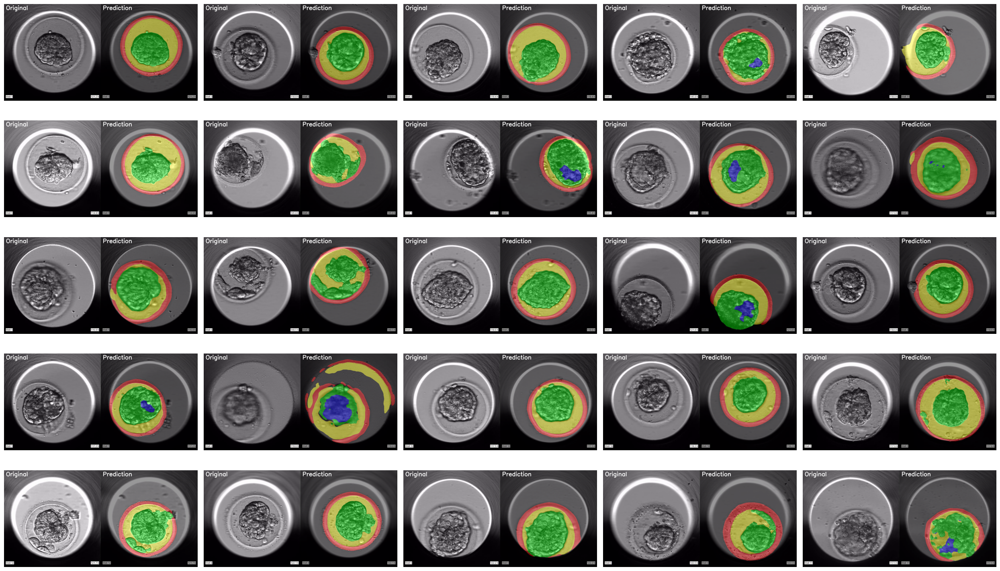

In [ ]:
#### IBRA PERFORMANCE VISUAL EVAL

# ------------------------------------------------------------
# 0)  INSTALL & IMPORT
# ------------------------------------------------------------
import os, sys, glob, pathlib, random
import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
from torchvision import transforms

# --- Ensure TransUNet is available ---
if not os.path.isdir("TransUNet"):
    print("Cloning TransUNet repository...")
    !git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git
sys.path.append(str(pathlib.Path.cwd() / "TransUNet"))

from networks.vit_seg_modeling import VisionTransformer as ViT_seg
from networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg

# ------------------------------------------------------------
# 1)  CONFIGURATION (✅ EDIT THESE VALUES)
# ------------------------------------------------------------
VIDEO_DIR   = "/content/drive/MyDrive/postbiopsy"      # 👈 Directory containing your video files
MODEL_PATH  = "/content/best_transunet.pth" # 👈 Path to your trained model weights
OUTPUT_GRID_IMG = "/content/visualization_grid.png" # 👈 Filename for the output grid image

# How many random frames to visualize
NUM_VISUALIZATIONS = 25 # 🚨 250 will create a HUGE image. Start with 25 or 50.

# --- Model & Data settings (MUST match your training script) ---
IMG_SIZE      = 512
NUM_CLASSES   = 5
CLASS_COLORS  = { # We need this again to map class IDs back to colors
    0: (  0,   0,   0),   # black (background)
    1: (255,   0,   0),   # red
    2: (  0, 255,   0),   # green
    3: (  0,   0, 255),   # blue
    4: (255, 255,   0)    # yellow
}

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------------------------------------
# 2)  HELPER FUNCTIONS (some are reused from previous scripts)
# ------------------------------------------------------------
def load_model(model_path, num_classes):
    print("Loading model...", end="")
    cfg = CONFIGS_ViT_seg["R50-ViT-B_16"]
    cfg.n_classes = num_classes
    cfg.n_skip = 3
    cfg.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)
    model = ViT_seg(cfg, img_size=IMG_SIZE, num_classes=num_classes)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()
    print("✓ Done")
    return model

def get_inference_transforms():
    return transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ])

def mask_to_rgb(pred_mask, class_colors):
    """Converts a mask of class IDs to an RGB color image."""
    rgb_mask = np.zeros((*pred_mask.shape, 3), dtype=np.uint8)
    for class_id, color in class_colors.items():
        rgb_mask[pred_mask == class_id] = color
    return rgb_mask

@torch.no_grad()
def create_comparison_image(frame_np, model, tf, class_colors):
    """
    Processes a frame and returns a side-by-side image of the
    original vs. the prediction overlay.
    """
    # --- Run Inference ---
    frame_rgb = cv2.cvtColor(frame_np, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(frame_rgb)
    input_tensor = tf(pil_img).unsqueeze(0).to(DEVICE)
    logits = model(input_tensor)
    pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

    # --- Create Visualization ---
    # Convert prediction mask to a color image
    color_mask = mask_to_rgb(pred_mask, class_colors)

    # Resize original frame to match output size for comparison
    original_resized = cv2.resize(frame_rgb, (IMG_SIZE, IMG_SIZE))

    # Create a transparent overlay
    # cv2.addWeighted(src1, alpha, src2, beta, gamma)
    overlay = cv2.addWeighted(original_resized, 0.6, color_mask, 0.4, 0)

    # Add labels
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(original_resized, 'Original', (10, 30), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(overlay, 'Prediction', (10, 30), font, 1, (255,255,255), 2, cv2.LINE_AA)

    # Stack images side-by-side
    comparison = np.hstack((original_resized, overlay))
    return comparison

# ------------------------------------------------------------
# 3)  MAIN EXECUTION
# ------------------------------------------------------------
def main():
    print(f"Gathering all video frames...")
    # Create a list of all possible frames (video_path, frame_index)
    # This is memory-efficient as we don't load all frames at once.
    all_frame_locs = []
    video_files = glob.glob(os.path.join(VIDEO_DIR, "*"))
    video_files = [v for v in video_files if v.lower().endswith(('.mp4', '.avi', '.mov', '.mkv'))]

    if not video_files:
        print(f"❌ No video files found in '{VIDEO_DIR}'. Please upload videos.")
        return

    for video_path in video_files:
        cap = cv2.VideoCapture(video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        for i in range(total_frames):
            all_frame_locs.append((video_path, i))
        cap.release()

    if not all_frame_locs:
        print("❌ Could not find any frames in the videos.")
        return

    print(f"Found {len(all_frame_locs)} total frames across {len(video_files)} videos.")

    # Randomly sample frames
    num_to_sample = min(NUM_VISUALIZATIONS, len(all_frame_locs))
    print(f"Randomly selecting {num_to_sample} frames to visualize...")
    sampled_frames = random.sample(all_frame_locs, num_to_sample)

    # Load model and transforms
    model = load_model(MODEL_PATH, NUM_CLASSES)
    transform = get_inference_transforms()

    comparison_images = []

    # Process only the sampled frames
    print("Generating comparison images...")
    for video_path, frame_idx in tqdm(sampled_frames, unit="frame"):
        cap = cv2.VideoCapture(video_path)
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx) # Jump to the specific frame
        ret, frame = cap.read()
        if ret:
            comp_img = create_comparison_image(frame, model, transform, CLASS_COLORS)
            comparison_images.append(comp_img)
        cap.release()

    # --- Create and save the grid ---
    if not comparison_images:
        print("Could not generate any comparison images.")
        return

    print("Creating image grid...")
    cols = 5 # Number of columns in the grid
    rows = (len(comparison_images) + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))
    axes = axes.flatten() # Flatten to make it easy to iterate

    for i, img in enumerate(comparison_images):
        axes[i].imshow(img)
        axes[i].axis('off')

    # Turn off any unused subplots
    for i in range(len(comparison_images), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.savefig(OUTPUT_GRID_IMG, dpi=300, bbox_inches='tight', pad_inches=0.1)
    print(f"\n✓ Success! Visualization grid saved to: {OUTPUT_GRID_IMG}")
    plt.show()

# Run it
if __name__ == "__main__":
    main()

Using device: cuda
Loading 5-class TransUNet model...
Loading model weights from /content/best_transunet.pth
Model weights loaded successfully.
Processing image: PHOTO-2025-05-09-12-45-05 2.jpg


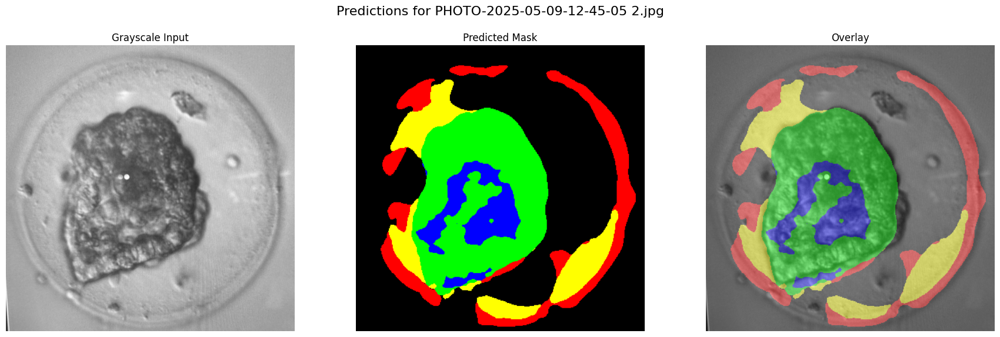

Visualization displayed for PHOTO-2025-05-09-12-45-05 2.jpg.

Image processing script finished.


In [ ]:
import cv2
import torch
import numpy as np
# import pandas as pd # Not used for single image processing
from PIL import Image
from torchvision import transforms
# from datetime import timedelta # Not needed for single images
import matplotlib.pyplot as plt
# from typing import Dict, List # Not explicitly used in the modified section
# from scipy.interpolate import LSQUnivariateSpline # Not needed
import os
from pathlib import Path
# import sys # Not used

# --- TransUNet Imports (Ensure these run) ---
if not os.path.isdir("TransUNet"):
     print("Cloning TransUNet repository...")
     # Consider using subprocess for better control if issues arise with os.system
     os.system("git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git")
from TransUNet.networks.vit_seg_modeling import VisionTransformer as ViT_seg
from TransUNet.networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg

# --- Constants (Ensure these match your model/training) ---
NUM_CLASSES = 5
IMG_SIZE = 384
CLASS_NAMES = ["Black", "Red", "Green", "Blue", "Yellow"]

# --- Visualization Color Map (Class ID -> RGB tuple 0-1 range for matplotlib) ---
VIS_COLORS_BGR = { # Using BGR for easy OpenCV compatibility
    0: (0, 0, 0),       # Black
    1: (0, 0, 255),     # Red
    2: (0, 255, 0),     # Green
    3: (255, 0, 0),     # Blue
    4: (0, 255, 255)    # Yellow
}

def colorize_mask(mask: np.ndarray) -> np.ndarray:
    """Converts a grayscale integer mask (HxW) to a color BGR image (HxWx3)."""
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color_bgr in VIS_COLORS_BGR.items():
        color_mask[mask == class_id] = color_bgr
    return color_mask

# --- predict_image function (remains the same) ---
def predict_image(model: torch.nn.Module, pil_image: Image.Image, device: torch.device) -> np.ndarray:
    """
    Predict segmentation mask for a single image using the 5-class model.
    Returns: numpy array with class indices (0: Black, 1: Red, 2: Green, 3: Blue, 4: Yellow)
    """
    transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    original_size = pil_image.size # PIL size is (width, height)
    input_tensor = transform(pil_image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        prediction = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
        # Resize prediction back to original image size
        prediction_pil = Image.fromarray(prediction.astype(np.uint8))
        prediction_pil = prediction_pil.resize(original_size, Image.NEAREST)
        prediction = np.array(prediction_pil)
    return prediction

# --- NEW Visualization Function for Single Image ---
def visualize_prediction_for_image(
    image_path: str,
    model: torch.nn.Module,
    device: torch.device
):
    """
    Generates and displays visualizations (grayscale, mask, overlay)
    for a single image file.
    """
    image_path_obj = Path(image_path)
    if not image_path_obj.exists():
        print(f"Error: Image file not found at {image_path}")
        return

    print(f"Processing image: {image_path_obj.name}")

    try:
        # 1. Prepare Input Image
        # Load with OpenCV to get BGR format easily for consistency
        frame_bgr = cv2.imread(image_path)
        if frame_bgr is None:
            print(f"Error: Could not read image file {image_path} with OpenCV. Trying PIL.")
            # Fallback to PIL if OpenCV fails (e.g., for some formats or paths)
            pil_image = Image.open(image_path).convert('RGB')
            frame_rgb = np.array(pil_image)
            frame_bgr = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
        else:
            # Convert BGR read by OpenCV to RGB for PIL
            frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
            pil_image = Image.fromarray(frame_rgb)


        # Create grayscale version for display
        gray_image = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)
        # Convert grayscale back to 3 channels for consistent display/overlay
        gray_3channel = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR) # BGR format

        # 2. Get Prediction
        prediction_mask_int = predict_image(model, pil_image, device) # Returns HxW numpy int array

        # 3. Colorize Prediction
        color_mask_bgr = colorize_mask(prediction_mask_int) # Returns HxWx3 numpy uint8 BGR

        # Ensure consistent dimensions (should be handled by predict_image resizing)
        if color_mask_bgr.shape[:2] != gray_3channel.shape[:2]:
             print(f"Warning: Dimension mismatch between frame ({gray_3channel.shape[:2]}) "
                   f"and mask ({color_mask_bgr.shape[:2]}). Resizing mask.")
             color_mask_bgr = cv2.resize(color_mask_bgr,
                                         (gray_3channel.shape[1], gray_3channel.shape[0]),
                                         interpolation=cv2.INTER_NEAREST)

        # 4. Create Overlay
        alpha = 0.6 # Opacity of the original frame
        beta = 0.4  # Opacity of the mask
        gamma = 0   # Scalar added to each sum
        overlay_bgr = cv2.addWeighted(gray_3channel, alpha, color_mask_bgr, beta, gamma)

        # 5. Display using Matplotlib
        fig, axes = plt.subplots(1, 3, figsize=(18, 6)) # Adjust figsize as needed
        fig.suptitle(f"Predictions for {image_path_obj.name}", fontsize=16)

        # Display Grayscale (convert BGR to RGB for plt)
        axes[0].imshow(cv2.cvtColor(gray_3channel, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Grayscale Input')
        axes[0].axis('off')

        # Display Color Mask (convert BGR to RGB for plt)
        axes[1].imshow(cv2.cvtColor(color_mask_bgr, cv2.COLOR_BGR2RGB))
        axes[1].set_title('Predicted Mask')
        axes[1].axis('off')

        # Display Overlay (convert BGR to RGB for plt)
        axes[2].imshow(cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB))
        axes[2].set_title('Overlay')
        axes[2].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout
        plt.show()
        print(f"Visualization displayed for {image_path_obj.name}.")

    except Exception as e:
        print(f"An error occurred while processing {image_path}: {e}")


# --- Main Execution Block ---
if __name__ == "__main__":
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load the 5-class model
    print("Loading 5-class TransUNet model...")
    config_vit = CONFIGS_ViT_seg['R50-ViT-B_16'] # Or your specific ViT config
    config_vit.n_classes = NUM_CLASSES
    config_vit.n_skip = 3 # Ensure this matches your trained model
    # Ensure IMG_SIZE is consistent with patch grid calculation
    if IMG_SIZE % 16 != 0:
        raise ValueError("IMG_SIZE must be divisible by 16 for patch grid calculation.")
    config_vit.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)

    model = ViT_seg(config_vit, img_size=IMG_SIZE, num_classes=NUM_CLASSES).to(device)

    model_path_str = "/content/best_transunet.pth" # <--- IMPORTANT: Update this path
    model_path = Path(model_path_str)

    if model_path.exists():
        print(f"Loading model weights from {model_path_str}")
        try:
            model.load_state_dict(torch.load(model_path_str, map_location=device))
            print("Model weights loaded successfully.")
        except Exception as e:
            print(f"Error loading model weights: {e}")
            print("Please ensure the model architecture in the script matches the saved checkpoint.")
            exit()
    else:
        print(f"Error: Model weights not found at {model_path_str}. Please check the path.")
        exit()

    # --- Process a single image or images in a folder ---

    # Option 1: Process a single image file
    # Update this path to your target image
    target_image_path = "/content/PHOTO-2025-05-09-12-45-05 2.jpg" # <--- IMPORTANT: Update this path

    # Option 2: Process all images in a folder
    # target_folder_path = "/content/folder2" # <--- IMPORTANT: Update this path
    # supported_formats = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.tif')

    # --- UNCOMMENT AND CHOOSE ONE OPTION BELOW ---

    # === For a single image: ===
    if Path(target_image_path).is_file():
        visualize_prediction_for_image(
            image_path=target_image_path,
            model=model,
            device=device
        )
    elif Path(target_image_path).is_dir():
         print(f"'{target_image_path}' is a directory. If you want to process all images "
               "in a directory, please uncomment the folder processing logic.")
    else:
        print(f"Error: Target image not found or path is invalid: {target_image_path}")
        print("Please set 'target_image_path' to a valid image file.")


    # === For all images in a folder (uncomment to use): ===
    # input_path_obj = Path(target_folder_path)
    # if input_path_obj.is_dir():
    #     print(f"Processing all supported images in folder: {target_folder_path}")
    #     image_files_processed = 0
    #     for item in input_path_obj.iterdir():
    #         if item.is_file() and item.suffix.lower() in supported_formats:
    #             try:
    #                 visualize_prediction_for_image(
    #                     image_path=str(item), # Pass as string
    #                     model=model,
    #                     device=device
    #                 )
    #                 image_files_processed += 1
    #             except Exception as e:
    #                 print(f"Skipping {item.name} due to error: {e}")
    #     if image_files_processed == 0:
    #         print(f"No supported image files found in {target_folder_path}")
    #     else:
    #         print(f"Finished processing {image_files_processed} image(s) in the folder.")
    # elif input_path_obj.is_file() and input_path_obj.suffix.lower() in supported_formats:
    #     print(f"'{target_folder_path}' is a file. Processing it as a single image.")
    #     visualize_prediction_for_image(
    #         image_path=str(input_path_obj),
    #         model=model,
    #         device=device
    #     )
    # else:
    #     print(f"Error: Target folder not found or path is invalid: {target_folder_path}")
    #     print("Please set 'target_folder_path' to a valid directory containing images.")

    print("\nImage processing script finished.")

In [ ]:
import cv2
import torch
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms
from datetime import timedelta, datetime # Added datetime for filename
import matplotlib.pyplot as plt
from typing import Dict, List
# from scipy.interpolate import LSQUnivariateSpline # Not needed
import os
from pathlib import Path
import sys
import time # For performance timing

# --- TransUNet Imports (Ensure these run) ---
if not os.path.isdir("TransUNet"):
     print("Cloning TransUNet repository...")
     # Use -q for quiet, --depth 1 for shallow clone
     os.system("git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git")
# Add TransUNet to sys.path if it's not already importable
transunet_path = Path("TransUNet")
if str(transunet_path.absolute()) not in sys.path:
     sys.path.insert(0, str(transunet_path.absolute()))
# Now import
try:
    from networks.vit_seg_modeling import VisionTransformer as ViT_seg
    from networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg
except ImportError as e:
    print(f"Error importing from TransUNet: {e}")
    print("Please ensure the TransUNet repository was cloned correctly and is in the expected location.")
    sys.exit(1)


# --- Constants (Ensure these match your model/training) ---
NUM_CLASSES = 5
IMG_SIZE = 512 # Input size for the model
CLASS_NAMES = ["Black", "Red", "Green", "Blue", "Yellow"]

# --- Visualization Color Map (Class ID -> BGR tuple 0-255 range) ---
VIS_COLORS_BGR = {
    0: (0, 0, 0),       # Black
    1: (0, 0, 255),     # Red
    2: (0, 255, 0),     # Green
    3: (255, 0, 0),     # Blue
    4: (0, 255, 255)    # Yellow
}

def colorize_mask(mask: np.ndarray) -> np.ndarray:
    """Converts a grayscale integer mask (HxW) to a color BGR image (HxWx3)."""
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color_bgr in VIS_COLORS_BGR.items():
        color_mask[mask == class_id] = color_bgr
    return color_mask

# --- predict_image function (remains the same) ---
def predict_image(model: torch.nn.Module, pil_image: Image.Image, device: torch.device) -> np.ndarray:
    """
    Predict segmentation mask for a single image using the 5-class model.
    Returns: numpy array with class indices (0-4) resized to original image size.
    """
    transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # Use appropriate norm stats
    ])
    original_size = pil_image.size # PIL size is (width, height)
    input_tensor = transform(pil_image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        # Output shape is (1, num_classes, H, W)
        prediction = torch.argmax(output, dim=1).squeeze(0).cpu().numpy() # Result is (H, W) with class indices
        # Resize prediction back to original image size using NEAREST interpolation
        prediction_pil = Image.fromarray(prediction.astype(np.uint8))
        # Image.resize takes (width, height)
        prediction_pil = prediction_pil.resize(original_size, Image.NEAREST)
        prediction_resized = np.array(prediction_pil)
    return prediction_resized # HxW numpy array

# --- NEW Function to Create Overlay Video ---
def create_overlay_video(
    video_path: str,
    output_video_path: str,
    model: torch.nn.Module,
    device: torch.device,
    start_second: int = 0,
    stop_second: int = None, # Process until the end if None
    target_fps: float = None, # Target FPS for output, None to use original
    overlay_alpha: float = 0.6 # Opacity of original frame in overlay
):
    """
    Processes a video, generates segmentation masks, creates a color overlay,
    and saves the result as a new video file.
    """
    if not Path(video_path).exists():
        print(f"Error: Video file not found at {video_path}")
        return

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    # Get video properties
    original_fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration_seconds = total_frames / original_fps if original_fps > 0 else 0

    if original_fps == 0:
         print(f"Warning: Could not get FPS for video {video_path}. Assuming 30.")
         original_fps = 30

    output_fps = target_fps if target_fps is not None else original_fps

    # --- Configure Video Writer ---
    # Use MP4V codec for .mp4 files, good compatibility
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, output_fps, (frame_width, frame_height))
    if not out.isOpened():
        print(f"Error: Could not open video writer for {output_video_path}")
        cap.release()
        return

    # --- Time and Frame Calculation ---
    start_frame = int(start_second * original_fps)
    stop_frame = None
    if stop_second is not None:
        if stop_second <= start_second:
            print(f"Warning: stop_second ({stop_second}) is less than or equal to start_second ({start_second}). No frames will be processed.")
            cap.release()
            out.release()
            return
        stop_frame = int(stop_second * original_fps)

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    current_frame_num = start_frame
    frames_processed_count = 0
    start_time = time.time()

    print(f"Processing video: {Path(video_path).name}")
    print(f"Original Dim: {frame_width}x{frame_height}, FPS: {original_fps:.2f}")
    print(f"Outputting to: {output_video_path} at {output_fps:.2f} FPS")
    if stop_second is not None:
        print(f"Processing from {start_second}s to {stop_second}s (Frames {start_frame} to {stop_frame})")
    else:
        print(f"Processing from {start_second}s to end (Frame {start_frame} onwards)")
    print(f"Overlay alpha (original frame opacity): {overlay_alpha}")

    while True:
        ret, frame_bgr = cap.read() # Read frame in BGR
        if not ret:
            print("End of video stream reached.")
            break

        # Check stop condition based on frame number
        if stop_frame is not None and current_frame_num >= stop_frame:
            print(f"Reached stop frame ({stop_frame}). Stopping processing.")
            break

        timestamp_sec = current_frame_num / original_fps

        # --- Perform Prediction and Overlay ---
        # 1. Prepare Input Image (BGR to RGB for PIL)
        frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(frame_rgb)

        # 2. Get Prediction (returns HxW numpy int array, resized to original)
        prediction_mask_int = predict_image(model, pil_image, device)

        # 3. Colorize Prediction Mask
        color_mask_bgr = colorize_mask(prediction_mask_int) # Returns HxWx3 BGR

        # Ensure dimensions match (should already be handled by predict_image resizing)
        if color_mask_bgr.shape[:2] != frame_bgr.shape[:2]:
             print(f"Warning: Dimension mismatch! Frame: {frame_bgr.shape}, Mask: {color_mask_bgr.shape}. Resizing mask.")
             # Use frame_bgr's width and height
             color_mask_bgr = cv2.resize(color_mask_bgr, (frame_bgr.shape[1], frame_bgr.shape[0]), interpolation=cv2.INTER_NEAREST)

        # 4. Create Overlay using the *original color frame*
        beta = 1.0 - overlay_alpha # Opacity of the color mask
        overlay_bgr = cv2.addWeighted(frame_bgr, overlay_alpha, color_mask_bgr, beta, 0)

        # 5. Write Frame to Output Video
        out.write(overlay_bgr)

        frames_processed_count += 1
        current_frame_num += 1

        # --- Progress Reporting ---
        if frames_processed_count % 100 == 0: # Report every 100 frames
            elapsed_time = time.time() - start_time
            fps_proc = frames_processed_count / elapsed_time if elapsed_time > 0 else 0
            print(f"  Processed {frames_processed_count} frames | Time: {timestamp_sec:.2f}s | Processing FPS: {fps_proc:.2f}")


    # --- Cleanup ---
    end_time = time.time()
    cap.release()
    out.release()
    cv2.destroyAllWindows() # Just in case

    total_time = end_time - start_time
    avg_fps = frames_processed_count / total_time if total_time > 0 else 0
    print("-" * 30)
    print(f"Finished processing.")
    print(f"Processed {frames_processed_count} frames in {total_time:.2f} seconds.")
    print(f"Average processing speed: {avg_fps:.2f} FPS.")
    print(f"Overlay video saved to: {output_video_path}")
    print("-" * 30)


# --- (Optional) Original Visualization Function (for reference/debugging) ---
def visualize_predictions_for_video(
    video_path: str,
    model: torch.nn.Module,
    device: torch.device,
    start_second: int = 0,
    stop_second: int = 25,
    target_vis_fps: int = 2 # Target visualization FPS (sampling)
):
    """
    Generates and displays visualizations (grayscale, mask, overlay)
    for frames sampled from a video using matplotlib.
    """
    if not Path(video_path).exists():
        print(f"Error: Video file not found at {video_path}")
        return

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    original_fps = cap.get(cv2.CAP_PROP_FPS)
    if original_fps == 0:
         print(f"Warning: Could not get FPS for video {video_path}. Assuming 30.")
         original_fps = 30

    frame_interval = max(1, int(round(original_fps / target_vis_fps))) # Use round for better accuracy
    start_frame = int(start_second * original_fps)

    if stop_second is not None and stop_second <= start_second:
        print(f"Warning: stop_second ({stop_second}) <= start_second ({start_second}). No frames visualized.")
        cap.release()
        return

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    current_frame_num = start_frame
    frames_visualized_count = 0

    print(f"Visualizing {Path(video_path).name} from {start_second}s up to {stop_second}s at approx {target_vis_fps} analysis FPS...")

    while True:
        # Set frame position directly for more robust skipping
        cap.set(cv2.CAP_PROP_POS_FRAMES, current_frame_num)
        ret, frame_bgr = cap.read() # Read frame in BGR
        if not ret:
            print("End of video stream or error reading frame.")
            break

        timestamp_sec = current_frame_num / original_fps

        # Check stop condition
        if stop_second is not None and timestamp_sec > stop_second:
            print(f"Reached stop time ({stop_second:.2f}s). Stopping visualization.")
            break

        print(f"  Visualizing frame at {timestamp_sec:.2f}s (Frame {current_frame_num})")
        frames_visualized_count += 1

        # 1. Prepare Input Image
        frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(frame_rgb)
        gray_image = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)
        gray_3channel = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR) # For overlay consistency

        # 2. Get Prediction
        prediction_mask_int = predict_image(model, pil_image, device) # Returns HxW numpy int array

        # 3. Colorize Prediction
        color_mask_bgr = colorize_mask(prediction_mask_int) # Returns HxWx3 numpy uint8 BGR

        # Ensure consistent dimensions (should be handled by predict_image resizing)
        if color_mask_bgr.shape[:2] != gray_3channel.shape[:2]:
             print(f"Warning: Viz Dimension mismatch! Frame: {gray_3channel.shape}, Mask: {color_mask_bgr.shape}. Resizing mask.")
             color_mask_bgr = cv2.resize(color_mask_bgr, (gray_3channel.shape[1], gray_3channel.shape[0]), interpolation=cv2.INTER_NEAREST)

        # 4. Create Overlay (using GRAYSCALE for this visualization)
        alpha = 0.6
        beta = 0.4
        overlay_gray_bgr = cv2.addWeighted(gray_3channel, alpha, color_mask_bgr, beta, 0)

        # 5. Display using Matplotlib
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(f"Frame at {timestamp_sec:.2f}s", fontsize=16)

        # Display Grayscale (convert BGR to RGB for plt)
        axes[0].imshow(cv2.cvtColor(gray_3channel, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Grayscale Input')
        axes[0].axis('off')

        # Display Color Mask (convert BGR to RGB for plt)
        axes[1].imshow(cv2.cvtColor(color_mask_bgr, cv2.COLOR_BGR2RGB))
        axes[1].set_title('Predicted Mask')
        axes[1].axis('off')

        # Display Overlay (convert BGR to RGB for plt)
        axes[2].imshow(cv2.cvtColor(overlay_gray_bgr, cv2.COLOR_BGR2RGB))
        axes[2].set_title('Overlay (Grayscale + Mask)')
        axes[2].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show() # Display the plot

        # Advance to the next frame to visualize
        current_frame_num += frame_interval

    cap.release()
    print(f"Visualization finished. Displayed {frames_visualized_count} frames.")


# --- Main Execution Block ---
if __name__ == "__main__":
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Load the 5-class model
    print("Loading 5-class TransUNet model...")
    config_vit = CONFIGS_ViT_seg['R50-ViT-B_16']
    config_vit.n_classes = NUM_CLASSES
    config_vit.n_skip = 3
    if hasattr(config_vit.patches, 'grid'): # Check if grid attribute exists
        config_vit.patches.grid = (IMG_SIZE // 16, IMG_SIZE // 16)
    else:
        print("Warning: config_vit.patches does not have 'grid' attribute. Model might expect different config.")

    model = ViT_seg(config_vit, img_size=IMG_SIZE, num_classes=NUM_CLASSES).to(device)

    # --- IMPORTANT: Set Correct Model Path ---
    model_path = "/content/best_transunet.pth" # <--- Make sure this path is correct!
    # ---

    if Path(model_path).exists():
        print(f"Loading model weights from {model_path}")
        try:
            # Load weights, mapping to the selected device
            model.load_state_dict(torch.load(model_path, map_location=device))
            print("Model weights loaded successfully.")
        except Exception as e:
            print(f"Error loading model weights: {e}")
            print("Ensure the model definition matches the saved weights.")
            sys.exit(1)
    else:
        print(f"Error: Model weights not found at {model_path}. Please check the path.")
        sys.exit(1)

    model.eval() # Set model to evaluation mode

    # --- Define Input and Output ---
    # Adjust input folder if needed
    video_input_folder = "/content/drive/MyDrive/All_Videos/All_Videos"
    # Choose the video you want to process
    # target_video_name = "204049782_1100_10_A.avi"
    # target_video_name = "204035495_361_2_A.avi"
    #target_video_name = "204049782_1100_6_E.mov"
    #target_video_name ="204135685_1170_1_A.mov"
    #target_video_name ="204135685_1170_2_A.mov"
    target_video_name ="204135685_1189_2_E.avi"

    target_video_path = Path(video_input_folder) / target_video_name

    # Define where to save the output video
    output_folder = Path("/content/video_outputs") # Save in Colab's temporary storage first
    output_folder.mkdir(parents=True, exist_ok=True) # Create folder if it doesn't exist
    output_video_name = f"{target_video_path.stem}_overlay_{datetime.now().strftime('%Y%m%d_%H%M')}.mp4"
    output_video_path = str(output_folder / output_video_name) # Pass path as string


    # --- Choose Action ---
    # Option 1: Create the overlay video
    create_overlay_video(
        video_path=str(target_video_path), # Ensure path is string
        output_video_path=output_video_path,
        model=model,
        device=device,
        start_second=0,
        stop_second=25,       # Process first 25 seconds (set to None to process whole video)
        target_fps=None,      # None = use original video FPS for output
        overlay_alpha=0.6     # Adjust transparency (0.0 = full mask, 1.0 = full original)
    )

    # Option 2: Run the frame-by-frame visualization (optional)
    # print("\nStarting frame-by-frame visualization (Matplotlib)...")
    # visualize_predictions_for_video(
    #     video_path=str(target_video_path), # Ensure path is string
    #     model=model,
    #     device=device,
    #     start_second=0,
    #     stop_second=5, # Visualize only first 5 seconds
    #     target_vis_fps=1 # Show 1 frame per second
    # )

    print("\nScript finished.")

Using device: cuda
Loading 5-class TransUNet model...
Loading model weights from /content/best_transunet.pth
Model weights loaded successfully.
Processing video: 204135685_1189_2_E.avi
Original Dim: 500x500, FPS: 15.06
Outputting to: /content/video_outputs/204135685_1189_2_E_overlay_20250502_1038.mp4 at 15.06 FPS
Processing from 0s to 25s (Frames 0 to 376)
Overlay alpha (original frame opacity): 0.6
  Processed 100 frames | Time: 6.57s | Processing FPS: 21.07
  Processed 200 frames | Time: 13.21s | Processing FPS: 21.35
  Processed 300 frames | Time: 19.85s | Processing FPS: 21.42
End of video stream reached.
------------------------------
Finished processing.
Processed 371 frames in 17.29 seconds.
Average processing speed: 21.46 FPS.
Overlay video saved to: /content/video_outputs/204135685_1189_2_E_overlay_20250502_1038.mp4
------------------------------

Script finished.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Define paths (adjust if your file is in a subfolder)
ZIP_FILE_PATH="/content/drive/MyDrive/Sorted_Images.zip"
DESTINATION_DIR="/content/Sorted_Images" # Or choose another destination

# Create the destination directory if it doesn't exist
!mkdir -p "{DESTINATION_DIR}"

# Unzip the archive
print(f"Unzipping {ZIP_FILE_PATH} to {DESTINATION_DIR}...")
!unzip -q "{ZIP_FILE_PATH}" -d "{DESTINATION_DIR}"
print("Unzipping complete.")

# Optional: List the contents of the destination directory
print("\nContents of extraction directory:")
!ls -lh "{DESTINATION_DIR}"

Unzipping /content/drive/MyDrive/Sorted_Images.zip to /content/Sorted_Images...
Unzipping complete.

Contents of extraction directory:
total 8.0K
drwxr-xr-x  3 root root 4.0K May  3 12:16 __MACOSX
drwxr-xr-x 18 root root 4.0K May  3 12:16 Sorted_Images


In [ ]:
zip_file_path = '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip'
extract_to_path = '/content/Sorted_Images_Tinted/'
!rm -r "{extract_to_path}" # Remove existing folder if it exists
!mkdir -p "{extract_to_path}"
print(f"Starting extraction of '{zip_file_path}' to '{extract_to_path}'...")
!unzip -q "{zip_file_path}" -d "{extract_to_path}"

zip_file_path = '/content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip'
extract_to_path = '/content/Sorted_Images/'
!rm -r "{extract_to_path}" # Remove existing folder if it exists
!mkdir -p "{extract_to_path}"
print(f"Starting extraction of '{zip_file_path}' to '{extract_to_path}'...")
!unzip -q "{zip_file_path}" -d "{extract_to_path}"
print("Extraction finished!")


rm: cannot remove '/content/Sorted_Images_Tinted/': No such file or directory
Starting extraction of '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip' to '/content/Sorted_Images_Tinted/'...
rm: cannot remove '/content/Sorted_Images/': No such file or directory
Starting extraction of '/content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip' to '/content/Sorted_Images/'...
Extraction finished!


In [ ]:
import os
import glob
import pandas as pd # Keep pandas import, might be useful later
from sklearn.model_selection import train_test_split
import numpy as np

# ------------------------------------------------------------
# GROUPING
# ------------------------------------------------------------

# 2. List All Image Files
sorted_data_dir = '/content/Sorted_Images/Sorted_Images' # Adjust path if needed
all_image_files = []
# Define allowed extensions tuple
allowed_extensions_tuple = ('.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp', '.gif')
print(f"Searching for files with extensions: {allowed_extensions_tuple}")

# Use os.walk for robust traversal, handling potential issues with glob's '**'
for dirpath, dirnames, filenames in os.walk(sorted_data_dir):
    for filename in filenames:
        # Check extension using endswith (case-insensitive)
        if filename.lower().endswith(allowed_extensions_tuple):
            full_path = os.path.join(dirpath, filename)
            all_image_files.append(full_path)

# Alternative using glob (simpler but sometimes less robust on Drive):
# for ext in allowed_extensions_tuple:
#    all_image_files.extend(glob.glob(os.path.join(sorted_data_dir, '**', f'*{ext}'), recursive=True))
# all_image_files = list(set(all_image_files)) # Ensure uniqueness if using glob multiple times

print(f"Found {len(all_image_files)} image files.")
if not all_image_files:
     print("Warning: No image files found. Check the path and file extensions.")
# Example file path: '/content/drive/MyDrive/Sorted_Images/t2/D2015.11.18_S1523_I132_WELL4_RUN142.jpeg'

# --- 3. Extract Unique Embryo Identifier (Prefix) ---

def get_embryo_prefix_from_filename(filepath):
    """
    Extracts the unique identifier prefix from the image filename.
    Assumes the format is 'PREFIX_RUN<number>.<extension>'.
    """
    try:
        filename = os.path.basename(filepath)
        # Split at '_RUN' and take the first part
        # Use rsplit limit 1 in case prefix itself contains '_RUN' (unlikely but safer)
        parts = filename.rsplit('_RUN', 1)
        if len(parts) > 1:
             prefix = parts[0]
             return prefix
        else:
             # Filename doesn't contain '_RUN' as expected
             print(f"Warning: Could not parse prefix from filename: {filename}")
             return None
    except Exception as e:
        print(f"Error parsing filename {filepath}: {e}")
        return None

# Apply the function to get prefix for each file
file_embryo_pairs = []
for fp in all_image_files:
    embryo_prefix = get_embryo_prefix_from_filename(fp)
    if embryo_prefix: # Only include files where prefix was successfully extracted
        file_embryo_pairs.append((fp, embryo_prefix))
    else:
        print(f"Skipping file due to parsing error: {fp}")


print(f"Successfully mapped {len(file_embryo_pairs)} files to embryo prefixes.")

if not file_embryo_pairs:
     print("Error: No files could be mapped to embryo prefixes. Check filenames and parsing function.")
     # Exit or handle error appropriately
     unique_embryo_prefixes = [] # Ensure list exists but is empty
else:
    # Get unique embryo prefixes
    unique_embryo_prefixes = sorted(list(set([pair[1] for pair in file_embryo_pairs])))
    print(f"Found {len(unique_embryo_prefixes)} unique embryo prefixes (groups).")

# --- 4. Split Embryo Prefixes ---

# Ensure unique_embryo_prefixes is not empty before proceeding
if not unique_embryo_prefixes:
     print("Error: No unique embryo prefixes found. Cannot proceed with splitting.")
     # Set empty lists to avoid errors later
     train_files, val_files, test_files = [], [], []
else:
    # Split prefixes into train and remaining (val + test)
    train_embryos, val_test_embryos = train_test_split(
        unique_embryo_prefixes,
        test_size=0.3, # Adjust ratio as needed (e.g., 0.3 means 70% train)
        random_state=42 # Ensures split is the same each time code runs
    )

    # Split remaining into validation and test
    if not val_test_embryos: # Handle case val_test list might be empty
        val_embryos = []
        test_embryos = []
        print("Warning: No embryos left for validation/testing after initial split.")
    elif len(val_test_embryos) == 1: # Handle case only one embryo left
        print("Warning: Only one embryo group left for validation/testing. Assigning to validation.")
        val_embryos = val_test_embryos
        test_embryos = []
    else:
       val_embryos, test_embryos = train_test_split(
            val_test_embryos,
            test_size=0.5, # Adjust ratio as needed (e.g., 0.5 means 50% of the remaining -> 15% total)
            random_state=42
       )

    print(f"Train embryo groups: {len(train_embryos)}")
    print(f"Validation embryo groups: {len(val_embryos)}")
    print(f"Test embryo groups: {len(test_embryos)}")

    # Create sets for faster lookup during file assignment
    train_embryos_set = set(train_embryos)
    val_embryos_set = set(val_embryos)
    test_embryos_set = set(test_embryos)

    # --- 5. Create File Lists for Each Split ---
    train_files = []
    val_files = []
    test_files = []

    for filepath, embryo_prefix in file_embryo_pairs:
        if embryo_prefix in train_embryos_set:
            train_files.append(filepath)
        elif embryo_prefix in val_embryos_set:
            val_files.append(filepath)
        elif embryo_prefix in test_embryos_set:
            test_files.append(filepath)

    print(f"\n--- Split Summary ---")
    print(f"Total image files mapped: {len(file_embryo_pairs)}")
    print(f"Train files: {len(train_files)}")
    print(f"Validation files: {len(val_files)}")
    print(f"Test files: {len(test_files)}")
    print(f"Check sum: {len(train_files) + len(val_files) + len(test_files)}")


# --- Ready for Data Loaders ---
# You can now use train_files, val_files, test_files with your
# TensorFlow or PyTorch data loaders. For example:
# tf_train_ds = tf.data.Dataset.from_tensor_slices(train_files).map(...)
# torch_train_dataset = CustomImageDataset(train_files, transform=...)

Searching for files with extensions: ('.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp', '.gif')
Found 287816 image files.
Successfully mapped 287816 files to embryo prefixes.
Found 704 unique embryo prefixes (groups).
Train embryo groups: 492
Validation embryo groups: 106
Test embryo groups: 106

--- Split Summary ---
Total image files mapped: 287816
Train files: 203382
Validation files: 41575
Test files: 42859
Check sum: 287816


In [ ]:
# ------------------------------------------------------------
# TINTING & CLEAN GRAYSCALE EXTRACTION
# ------------------------------------------------------------

# !pip install ml_collections # Make sure this is run in your environment if needed
import cv2
import torch
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms
from datetime import timedelta
import matplotlib.pyplot as plt
from typing import Dict, List
import os
from pathlib import Path
import sys
from tqdm.notebook import tqdm # Use notebook version for Colab progress bars
import ml_collections

# --- TransUNet Imports ---
# Ensure the repository is cloned and accessible
transunet_path = "TransUNet"
if not os.path.isdir(transunet_path):
     print("Cloning TransUNet repository...")
     # Using quiet mode and depth 1 for faster clone
     os.system(f"git clone -q --depth 1 https://github.com/Beckschen/TransUNet.git {transunet_path}")
     print("TransUNet repository cloned.")
else:
    print("TransUNet repository already exists.")

# Add TransUNet to Python path if not already done
if transunet_path not in sys.path:
    sys.path.insert(0, transunet_path)
    print(f"Added {transunet_path} to sys.path")

try:
    from networks.vit_seg_modeling import VisionTransformer as ViT_seg
    from networks.vit_seg_modeling import CONFIGS as CONFIGS_ViT_seg
    print("TransUNet components imported successfully.")
except ImportError as e:
    print(f"Error importing TransUNet components: {e}")
    print("Please ensure the TransUNet repository is correctly cloned and accessible.")
    # Depending on the environment, sys.path manipulation might need adjustment
    # Or you might need to install dependencies from TransUNet's requirements
    raise # Stop execution if imports fail

# --- Configuration ---

# !!! IMPORTANT: Replace with the actual lists generated by your data splitting script !!!
# Placeholder lists - replace these with your actual file lists
# Example (MAKE SURE THESE ARE DEFINED from your previous step):
# train_files = ['/content/drive/MyDrive/Sorted_Images/t2/embryoA_RUN100.jpeg', ...]
# val_files = ['/content/drive/MyDrive/Sorted_Images/t4/embryoB_RUN210.jpeg', ...]
# test_files = ['/content/drive/MyDrive/Sorted_Images/tM/embryoC_RUN500.jpeg', ...]

# !!! ===================================================================== !!!
# !!! ENSURE THESE LISTS ARE DEFINED FROM YOUR DATA SPLITTING STEP          !!!
# !!! Example placeholder (replace with your actual data):                  !!!
#train_files = [] # e.g., ['/path/to/input/train/img1.jpeg', ...]
#val_files = []   # e.g., ['/path/to/input/val/img2.jpeg', ...]
#test_files = []  # e.g., ['/path/to/input/test/img3.jpeg', ...]
# !!! ===================================================================== !!!


# Basic check if lists exist and prompt user if not defined
if 'train_files' not in locals() or 'val_files' not in locals() or 'test_files' not in locals():
     raise NameError("ERROR: Please define train_files, val_files, and test_files lists from your data splitting step before running this.")
# Check if lists are populated (can be empty if a split has no files)
if not train_files: print("Warning: train_files list is empty.")
if not val_files: print("Warning: val_files list is empty.")
if not test_files: print("Warning: test_files list is empty.")


# --- Model & Paths ---
TRANSUNET_MODEL_PATH = "/content/best_transunet.pth" # Path to your trained 5-class model
INPUT_BASE_DIR = "/content/Sorted_Images/Sorted_Images" # Base dir of original sorted images
OUTPUT_TINTED_BASE_DIR = "/content/Sorted_Images_Tinted" # Base dir for NEW tinted images
OUTPUT_GRAYSCALE_BASE_DIR = "/content/Sorted_Images_Grayscale_Clean" # <<< NEW: Base dir for CLEAN original grayscale images

# --- Segmentation Model Constants ---
NUM_CLASSES = 5 # Number of classes for TransUNet
IMG_SIZE = 384 # Input size for TransUNet

# --- Color Map (BGR for OpenCV) ---
VIS_COLORS_BGR = {
    0: (0, 0, 0),       # Black (Background)
    1: (0, 0, 255),     # Red   (Class 1)
    2: (0, 255, 0),     # Green (Class 2)
    3: (255, 0, 0),     # Blue  (Class 3)
    4: (0, 255, 255)    # Yellow(Class 4)
}

# --- Helper Functions ---

def colorize_mask(mask: np.ndarray) -> np.ndarray:
    """Converts a grayscale integer mask (HxW) to a color BGR image (HxWx3)."""
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color_bgr in VIS_COLORS_BGR.items():
        # Ensure mask values are within expected range
        if class_id < NUM_CLASSES:
             color_mask[mask == class_id] = color_bgr
        # else: # Optional: handle unexpected class IDs if necessary
        #    print(f"Warning: Unexpected class ID {class_id} found in mask.")
    return color_mask

def predict_segmentation_mask(model: torch.nn.Module, pil_image_rgb: Image.Image, device: torch.device) -> np.ndarray:
    """
    Predicts segmentation mask for a single RGB PIL image.
    Returns: numpy array (HxW) with class indices (0-4).
    """
    # Define the transform inside the function to ensure it's consistent
    transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)), # Resize for model input
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # Normalization expected by TransUNet
    ])

    original_size = pil_image_rgb.size # PIL size is (width, height)
    input_tensor = transform(pil_image_rgb).unsqueeze(0).to(device)

    model.eval() # Ensure model is in evaluation mode
    with torch.no_grad():
        output = model(input_tensor)
        # Get prediction by finding the class with the highest score for each pixel
        prediction = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
        # Resize the prediction back to the original image size using NEAREST interpolation
        # to avoid creating new class values at boundaries.
        prediction_pil = Image.fromarray(prediction.astype(np.uint8))
        # Use original_size (width, height) for PIL resize
        prediction_pil = prediction_pil.resize(original_size, Image.NEAREST)
        prediction_resized = np.array(prediction_pil)

    return prediction_resized

# --- Main Processing Function ---

def create_tinted_and_save_clean_grayscale( # <<< Renamed function for clarity
    input_file_list: List[str],
    input_base_dir: str,
    output_tinted_base_dir: str, # <<< Renamed param
    output_grayscale_base_dir: str, # <<< NEW param
    model: torch.nn.Module,
    device: torch.device
):
    """
    Processes images from the input list, applies segmentation tinting,
    saves tinted images, and saves the original grayscale image *only if*
    processing was successful.
    """
    print(f"Starting processing for {len(input_file_list)} images...")
    processed_count = 0
    error_count = 0

    # Ensure the main output directories exist
    os.makedirs(output_tinted_base_dir, exist_ok=True)
    os.makedirs(output_grayscale_base_dir, exist_ok=True) # <<< NEW: Ensure grayscale base dir exists

    # Use tqdm for progress bar
    for input_path_str in tqdm(input_file_list, desc="Processing images"):
        input_path = Path(input_path_str)
        # <<< NEW: Define grayscale_image_cv outside try block scope
        gray_image_cv = None
        try:
            # --- Determine Output Paths ---
            # Get the relative path from the input base directory
            relative_path = input_path.relative_to(input_base_dir)
            # Construct the full output path for the tinted image
            tinted_output_path = Path(output_tinted_base_dir) / relative_path
            # <<< NEW: Construct the full output path for the clean grayscale image
            grayscale_output_path = Path(output_grayscale_base_dir) / relative_path

            # Create the output subdirectories if they don't exist
            tinted_output_path.parent.mkdir(parents=True, exist_ok=True)
            grayscale_output_path.parent.mkdir(parents=True, exist_ok=True) # <<< NEW

            # --- Load Original Image (Grayscale) ---
            # Load original grayscale using OpenCV FIRST for saving later if successful
            # and for tinting multiplication.
            gray_image_cv = cv2.imread(str(input_path), cv2.IMREAD_GRAYSCALE)
            if gray_image_cv is None:
                # This error indicates a problem loading the file with OpenCV
                raise IOError(f"Failed to load image with OpenCV: {input_path}")

            # --- Load with PIL and Convert to RGB for Prediction ---
            # We still need PIL for the prediction pipeline's transforms
            # Open the already verified path
            pil_image_gray = Image.open(input_path)
            # Convert grayscale PIL image to RGB for TransUNet prediction
            pil_image_rgb = pil_image_gray.convert('RGB')

            # --- Predict Segmentation Mask ---
            prediction_mask_int = predict_segmentation_mask(model, pil_image_rgb, device)

            # --- Colorize Mask ---
            color_mask_bgr = colorize_mask(prediction_mask_int) # HxWx3 BGR uint8

            # --- Prepare Grayscale for Multiplication ---
            # We already loaded gray_image_cv with OpenCV
            # Convert grayscale to 3-channel BGR for multiplication
            gray_3channel_bgr = cv2.cvtColor(gray_image_cv, cv2.COLOR_GRAY2BGR) # HxWx3 BGR uint8

            # --- Ensure Dimensions Match ---
            # Mask should already be resized in predict function, but double-check
            if color_mask_bgr.shape[:2] != gray_3channel_bgr.shape[:2]:
                 print(f"\nWarning: Resizing color mask ({color_mask_bgr.shape[:2]}) to match frame ({gray_3channel_bgr.shape[:2]}) for {input_path.name}")
                 color_mask_bgr = cv2.resize(
                     color_mask_bgr,
                     (gray_3channel_bgr.shape[1], gray_3channel_bgr.shape[0]), # Target shape (width, height)
                     interpolation=cv2.INTER_NEAREST
                 )

            # --- Perform Tinting Multiplication ---
            # Convert images to float32 in range [0.0, 1.0]
            gray_float = gray_3channel_bgr.astype(np.float32) / 255.0
            color_mask_float = color_mask_bgr.astype(np.float32) / 255.0

            # Element-wise multiplication
            tinted_float = gray_float * color_mask_float

            # Convert back to uint8 in range [0, 255]
            tinted_uint8 = (tinted_float * 255.0).clip(0, 255).astype(np.uint8)

            # --- Save Tinted Image ---
            success_tinted = cv2.imwrite(str(tinted_output_path), tinted_uint8)
            if not success_tinted:
                raise IOError(f"Failed to save tinted image to: {tinted_output_path}")

            # --- <<< NEW: Save Original Grayscale Image (only if tinting succeeded) >>> ---
            if gray_image_cv is not None: # Double check it was loaded
                success_gray = cv2.imwrite(str(grayscale_output_path), gray_image_cv)
                if not success_gray:
                    # Log a warning but don't increment error count for the primary task (tinting)
                    print(f"\nWarning: Successfully tinted but failed to save clean grayscale image to: {grayscale_output_path}")
            else:
                 # This case shouldn't be reached if loading check above worked, but good to have.
                 print(f"\nWarning: Cannot save grayscale for {input_path_str}, as it wasn't loaded correctly earlier.")


            processed_count += 1

        except FileNotFoundError:
            print(f"\nError: Input file not found: {input_path_str}")
            error_count += 1
        except IOError as e: # Catch specific loading/saving errors
             print(f"\nError (IO): Problem loading/saving file {input_path_str}: {e}")
             error_count += 1
        except Exception as e:
            # Catch any other unexpected errors during processing (PIL loading, prediction, etc.)
            print(f"\nError processing file {input_path_str}: {type(e).__name__} - {e}")
            error_count += 1
            # Original grayscale will NOT be saved due to the exception

    print(f"\nFinished processing.")
    print(f"Successfully processed (tinted & saved grayscale): {processed_count} images.")
    print(f"Errors encountered (skipped saving): {error_count} images.")

# --- Main Execution ---
if __name__ == "__main__":
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # --- Load TransUNet Model ---
    print("Loading 5-class TransUNet model...")
    segmentation_model = None # Initialize
    try:
        config_vit = CONFIGS_ViT_seg['R50-ViT-B_16'] # Make sure this config matches your trained model basis
        config_vit.n_classes = NUM_CLASSES
        config_vit.n_skip = 3 # Check if this matches your trained model config
        # Calculate grid size based on IMG_SIZE and patch size (usually 16)
        patch_size = 16
        if IMG_SIZE % patch_size != 0:
             print(f"Warning: IMG_SIZE ({IMG_SIZE}) is not perfectly divisible by patch_size ({patch_size}). Check model compatibility.")
        grid_size = (IMG_SIZE // patch_size, IMG_SIZE // patch_size)
        config_vit.patches.grid = grid_size

        segmentation_model = ViT_seg(config_vit, img_size=IMG_SIZE, num_classes=NUM_CLASSES).to(device)

        if Path(TRANSUNET_MODEL_PATH).exists():
            print(f"Loading model weights from {TRANSUNET_MODEL_PATH}")
            segmentation_model.load_state_dict(torch.load(TRANSUNET_MODEL_PATH, map_location=device))
            segmentation_model.eval() # Set to evaluation mode
            print("Segmentation model loaded successfully.")
        else:
             # Raise error instead of just printing and exiting for better script practice
             raise FileNotFoundError(f"Error: Segmentation model weights not found at {TRANSUNET_MODEL_PATH}. Cannot proceed.")

    except Exception as e:
        print(f"Error loading segmentation model: {e}")
        # Exit if model loading fails
        sys.exit(1) # Use sys.exit for clearer termination

    # --- Process datasets ---
    # Ensure the file lists are defined and the model loaded before calling the function
    if segmentation_model is not None:
        if 'train_files' in locals() and train_files:
            print("\n--- Processing Training Set ---")
            create_tinted_and_save_clean_grayscale(
                train_files,
                INPUT_BASE_DIR,
                OUTPUT_TINTED_BASE_DIR,      # Pass tinted dir
                OUTPUT_GRAYSCALE_BASE_DIR,   # Pass grayscale dir
                segmentation_model,
                device
            )
        else:
            print("\nSkipping Training Set processing (train_files list not defined or empty).")

        if 'val_files' in locals() and val_files:
            print("\n--- Processing Validation Set ---")
            create_tinted_and_save_clean_grayscale(
                val_files,
                INPUT_BASE_DIR,
                OUTPUT_TINTED_BASE_DIR,      # Pass tinted dir
                OUTPUT_GRAYSCALE_BASE_DIR,   # Pass grayscale dir
                segmentation_model,
                device
            )
        else:
            print("\nSkipping Validation Set processing (val_files list not defined or empty).")

        if 'test_files' in locals() and test_files:
            print("\n--- Processing Test Set ---")
            create_tinted_and_save_clean_grayscale(
                test_files,
                INPUT_BASE_DIR,
                OUTPUT_TINTED_BASE_DIR,      # Pass tinted dir
                OUTPUT_GRAYSCALE_BASE_DIR,   # Pass grayscale dir
                segmentation_model,
                device
            )
        else:
            print("\nSkipping Test Set processing (test_files list not defined or empty).")
    else:
        print("\nSkipping dataset processing because segmentation model failed to load.")


    print("\nTinted dataset creation and clean grayscale extraction script finished.")

TransUNet repository already exists.
TransUNet components imported successfully.
Using device: cuda
Loading 5-class TransUNet model...
Loading model weights from /content/best_transunet.pth
Segmentation model loaded successfully.

--- Processing Training Set ---
Starting processing for 203382 images...


Processing images:   0%|          | 0/203382 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2017.05.10_S1927_I132_WELL11_RUN251.jpeg: image file is truncated (4 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2017.02.15_S0613_I647_WELL7_RUN216.jpeg: image file is truncated (5 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2016.10.25_S0516_I647_WELL8_RUN318.jpeg: image file is truncated (1 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2017.07.07_S0755_I647_WELL2_RUN286.jpeg: image file is truncated (5 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2016.11.07_S1773_I132_WELL1_RUN231.jpeg: image file is truncated (5 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t7/D2017.07.07_S

Processing images:   0%|          | 0/41575 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2016.11.23_S1781_I132_WELL5_RUN496.jpeg: image file is truncated (2 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2017.01.23_S0586_I647_WELL10_RUN558.jpeg: image file is truncated (4 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2017.01.23_S0586_I647_WELL10_RUN480.jpeg: image file is truncated (1 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2016.11.23_S1781_I132_WELL5_RUN487.jpeg: image file is truncated (5 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2017.02.15_S0613_I647_WELL6_RUN492.jpeg: image file is truncated (3 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/tB/D2017.01.23_

Processing images:   0%|          | 0/42859 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2017.04.15_S1905_I132_WELL6_RUN266.jpeg: image file is truncated (0 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2017.04.15_S1905_I132_WELL6_RUN405.jpeg: image file is truncated (5 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2016.10.26_S0517_I647_WELL2_RUN305.jpeg: image file is truncated (3 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2017.05.10_S0698_I647_WELL8_RUN279.jpeg: image file is truncated (6 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2016.10.26_S0517_I647_WELL2_RUN377.jpeg: image file is truncated (1 bytes not processed)

Error (IO): Problem loading/saving file /content/Sorted_Images/Sorted_Images/t9+/D2017.0

In [ ]:
torch.cuda.empty_cache()

In [ ]:
# ------------------------------------------------------------
# ARCHIVING TINTED IMAGES
# ------------------------------------------------------------


import os
import shutil
from google.colab import drive
import datetime

# --- Configuration ---
# The directory within Colab's runtime that you want to compress
source_directory = '/content/Sorted_Images_Grayscale_Clean'

# The desired name for the output compressed file (without extension)
# You can change this if you like.
archive_name_base = 'Sorted_Images_Grayscale_Clean_Archive'

# The compression format ('zip', 'tar', 'gztar' for .tar.gz, 'bztar' for .tar.bz2)
# 'zip' is generally recommended for cross-platform compatibility.
archive_format = 'zip'

# The path within your Google Drive where you want to save the compressed file.
# '/content/drive/MyDrive/' is the root of your "My Drive".
# You can change this to '/content/drive/MyDrive/MyFolder/' to save it in a specific folder.
drive_destination_folder = '/content/drive/MyDrive/'
# --- End Configuration ---

# Construct the full archive filename and paths
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
archive_filename = f"{archive_name_base}_{timestamp}.{archive_format}"
local_archive_path = f"/content/{archive_filename}" # Where the archive will be temporarily created in Colab
drive_destination_path = os.path.join(drive_destination_folder, archive_filename) # Full path in Google Drive

print(f"Attempting to compress: {source_directory}")
print(f"Archive format: {archive_format}")
print(f"Output archive name: {archive_filename}")
print(f"Saving to Google Drive path: {drive_destination_path}")
print("-" * 30)

# 1. Mount Google Drive
try:
    print("Mounting Google Drive...")
    drive.mount('/content/drive', force_remount=True) # force_remount can be helpful if already mounted
    print("Google Drive mounted successfully at /content/drive")
except Exception as e:
    print(f"ERROR: Failed to mount Google Drive: {e}")
    # Stop execution if Drive mounting fails
    raise SystemExit("Cannot proceed without Google Drive access.")

# 2. Check if the source directory exists
if not os.path.isdir(source_directory):
    print(f"\nERROR: Source directory '{source_directory}' not found.")
    print("Please ensure the directory path is correct and the files are present.")
else:
    print(f"\nSource directory '{source_directory}' found.")

    # 3. Compress the directory
    print(f"Starting compression into '{local_archive_path}'...")
    try:
        # shutil.make_archive(base_name, format, root_dir)
        # base_name: the path to the file to create (including dir, excluding extension)
        # format: 'zip', 'tar', 'gztar', etc.
        # root_dir: the directory to compress
        # Note: This will create an archive containing the *contents* of source_directory.
        # If you want the archive to contain the 'Sorted_Images_Tinted' folder itself,
        # you might need to adjust root_dir and base_dir arguments, e.g.:
        # shutil.make_archive(f'/content/{archive_name_base}_{timestamp}', archive_format, root_dir='/content', base_dir='Sorted_Images_Tinted')

        shutil.make_archive(f'/content/{archive_name_base}_{timestamp}', archive_format, source_directory)

        print("Compression successful.")

        # 4. Check if the compressed file was created locally
        if os.path.exists(local_archive_path):
            print(f"Local archive created: {local_archive_path} (Size: {os.path.getsize(local_archive_path)/1024/1024:.2f} MB)")

            # 5. Copy the compressed file to Google Drive
            print(f"Copying archive to Google Drive: '{drive_destination_path}'...")
            try:
                # Ensure the destination directory exists in Drive (optional but good practice)
                os.makedirs(os.path.dirname(drive_destination_path), exist_ok=True)

                shutil.copy(local_archive_path, drive_destination_path)
                print("Successfully copied archive to Google Drive.")

                # 6. Optional: Verify the file exists in Google Drive
                print("Verifying file in Google Drive...")
                if os.path.exists(drive_destination_path):
                   print(f"Verification successful: File found at '{drive_destination_path}'")
                   # Using !ls to show details can be helpful
                   print("\nGoogle Drive file details:")
                   !ls -lh "$drive_destination_path"
                else:
                   print("ERROR: Verification failed. File not found in Google Drive after copy.")

                # 7. Optional: Clean up the local archive file in Colab runtime to save space
                # print(f"\nCleaning up local file '{local_archive_path}'...")
                # os.remove(local_archive_path)
                # print("Local archive file removed.")

            except Exception as e:
                print(f"ERROR: Failed to copy file to Google Drive: {e}")
        else:
            print(f"ERROR: Local archive file '{local_archive_path}' was not found after compression attempt.")

    except Exception as e:
        print(f"ERROR: An error occurred during compression: {e}")

print("\nScript finished.")

Attempting to compress: /content/Sorted_Images_Grayscale_Clean
Archive format: zip
Output archive name: Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip
Saving to Google Drive path: /content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip
------------------------------
Mounting Google Drive...
Mounted at /content/drive
Google Drive mounted successfully at /content/drive

Source directory '/content/Sorted_Images_Grayscale_Clean' found.
Starting compression into '/content/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip'...
Compression successful.
Local archive created: /content/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip (Size: 9490.89 MB)
Copying archive to Google Drive: '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip'...
Successfully copied archive to Google Drive.
Verifying file in Google Drive...
Verification successful: File found at '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archiv

In [ ]:
zip_file_path = '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip'
extract_to_path = '/content/Sorted_Images_Tinted/'
!rm -r "{extract_to_path}" # Remove existing folder if it exists
!mkdir -p "{extract_to_path}"
print(f"Starting extraction of '{zip_file_path}' to '{extract_to_path}'...")
!unzip -q "{zip_file_path}" -d "{extract_to_path}"

zip_file_path = '/content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip'
extract_to_path = '/content/Sorted_Images/'
!rm -r "{extract_to_path}" # Remove existing folder if it exists
!mkdir -p "{extract_to_path}"
print(f"Starting extraction of '{zip_file_path}' to '{extract_to_path}'...")
!unzip -q "{zip_file_path}" -d "{extract_to_path}"
print("Extraction finished!")


rm: cannot remove '/content/Sorted_Images_Tinted/': No such file or directory
Starting extraction of '/content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip' to '/content/Sorted_Images_Tinted/'...
unzip:  cannot find or open /content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip, /content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip.zip or /content/drive/MyDrive/Sorted_Images_Grayscale_Clean_Archive_20250502_145040.zip.ZIP.
rm: cannot remove '/content/Sorted_Images/': No such file or directory
Starting extraction of '/content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip' to '/content/Sorted_Images/'...
unzip:  cannot find or open /content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip, /content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip.zip or /content/drive/MyDrive/Sorted_Images_Tinted_Archive_20250502_144612.zip.ZIP.
Extraction finished!


In [ ]:
torch.cuda.empty_cache()

In [ ]:
delete_path1="/content/Sorted_Images_Tinted/t3"
pth_del1="/content/Sorted_Images_Tinted/t5"
delete_path2="/content/Sorted_Images_Tinted/t6"
delete_path3="/content/Sorted_Images_Tinted/t7"
delete_path4="/content/Sorted_Images_Tinted/tM"
delete_path5="/content/Sorted_Images_Tinted/tPB2"
delete_path6="/content/Sorted_Images_Tinted/tPNf"
pth_del2="/content/Sorted_Images_Tinted/tEB"

!rm -r "{delete_path1}"
!rm -r "{delete_path2}"
!rm -r "{delete_path3}"
!rm -r "{delete_path4}"
!rm -r "{delete_path5}"
!rm -r "{delete_path6}"
!rm -r "{pth_del1}"
!rm -r "{pth_del2}"

In [ ]:
torch.cuda.empty_cache()

In [ ]:
# ------------------------------------------------------------
# NEW TRAINING (Corrected Full Script)
# ------------------------------------------------------------

import os
import time
import copy
import glob
import math
import random
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Sampler
from torch.amp import GradScaler, autocast
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode

import timm
import timm.scheduler as ts
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
from tqdm.auto import tqdm

# -----------------------------
# Configuration (edit here)
# -----------------------------
DATA_DIR       = "/content/Sorted_Images"  # root with class subfolders
MODEL_NAME     = "convnext_base.clip_laion2b_augreg_ft_in12k_in1k"
INPUT_SIZE     = 256
BATCH_SIZE     = 7*24
NUM_EPOCHS     = 30
LEARNING_RATE  = 1e-4
WEIGHT_DECAY   = 5e-3
ETA_MIN_FACTOR = 100
RANDOM_STATE   = 1337
NUM_WORKERS    = 2     # Set to 0 for debugging DataLoader issues
DEVICE         = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PRINT_FREQ     = 5
SAVE_MODEL_PATH= "best_embryo_classifier_grayscale.pth" # Define save path

# ============================
# Helpers
# ============================
class AddGaussianNoise(nn.Module):
    """Additive Gaussian noise to a tensor with probability p."""
    def __init__(self, mean: float = 0.0, std: float = 0.05, p: float = 0.5):
        super().__init__()
        self.mean, self.std, self.p = mean, std, p

    def forward(self, x: torch.Tensor):
        if torch.rand(1).item() < self.p:
            # Ensure noise tensor is on the same device as input tensor x
            noise = torch.randn_like(x) * self.std + self.mean
            return x + noise
        return x


def get_embryo_prefix(filepath: str):
    """Return substring before the first `_RUN` in filename."""
    fname = os.path.basename(filepath)
    parts = fname.rsplit("_RUN", 1)
    return parts[0] if len(parts) > 1 else None


def compute_class_weights(file_list, class_to_idx):
    """Computes class weights based on inverse frequency, clamped."""
    labels = [class_to_idx.get(Path(p).parent.name) for p in file_list]
    # Filter out None labels if a file's parent dir doesn't match a class
    labels = [l for l in labels if l is not None]
    if not labels:
        print("Warning: No valid labels found for weight calculation.")
        return None

    freq   = Counter(labels)
    total  = sum(freq.values())
    num_classes = len(class_to_idx)

    # Calculate weights, handle missing classes gracefully (assign weight 1 or mean weight)
    weights = []
    mean_weight = total / len(freq) if freq else 1.0 # Avg weight for observed classes
    for i in range(num_classes):
        if freq.get(i, 0) == 0:
             # Assign mean weight or 1.0 to classes not present in this subset
             class_weight = mean_weight
             print(f"Warning: Class index {i} not found in file list for weight calculation. Assigning weight {class_weight:.2f}.")
        else:
             class_weight = total / freq[i]
        weights.append(class_weight)

    weights_tensor = torch.tensor(weights, dtype=torch.float32)
    # Clamp weights to prevent extreme values - adjust max clamp value as needed
    weights_tensor = torch.clamp(weights_tensor, min=0.1, max=10.0) # Increased max clamp
    print(f"Computed class weights (clamped): {weights_tensor.numpy().round(2)}")
    return weights_tensor

# ============================
# 1) Discover all image files
# ============================
print(f"Searching for images in: {DATA_DIR}")
ALLOWED_EXT = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".gif"}
all_image_files = []
for root, _, files in os.walk(DATA_DIR):
    # Ensure the directory itself exists before proceeding
    if not os.path.isdir(root):
        print(f"Warning: Skipping non-directory path found during walk: {root}")
        continue
    for f in files:
        file_path = os.path.join(root, f)
        # Basic check if it's a file and has an allowed extension
        if os.path.isfile(file_path) and Path(f).suffix.lower() in ALLOWED_EXT:
            all_image_files.append(file_path)

if not all_image_files:
    raise RuntimeError(f"No images with allowed extensions {ALLOWED_EXT} found in {DATA_DIR} or its subdirectories.")
print(f"Found {len(all_image_files)} image files.")

# Map each file to its embryo prefix
file_embryo_pairs = [(fp, get_embryo_prefix(fp)) for fp in all_image_files]
file_embryo_pairs = [(fp, e) for fp, e in file_embryo_pairs if e]
unique_embryos    = sorted({e for _, e in file_embryo_pairs})

if not unique_embryos:
    raise RuntimeError(f"No files found with the '_RUN' naming convention needed for embryo splitting.")
if len(unique_embryos) < 3:
    # Adjust split logic if needed, ensure consistency if resuming
    print(f"Warning: Found only {len(unique_embryos)} embryo groups. Splitting might be suboptimal or change behavior if <3.")
    if len(unique_embryos) == 2:
         train_embryos, val_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
         test_embryos = [] # No separate test set
    elif len(unique_embryos) == 1:
         train_embryos = unique_embryos
         val_embryos, test_embryos = [], []
    else: # 0 embryos
        raise RuntimeError("No valid embryo groups found after filtering.")
else:
    train_embryos, val_test_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
    val_embryos, test_embryos       = train_test_split(val_test_embryos, test_size=0.5, random_state=RANDOM_STATE)

# Ensure sets are disjoint even if some are empty
assert not (set(train_embryos) & set(val_embryos))
assert not (set(train_embryos) & set(test_embryos))
assert not (set(val_embryos) & set(test_embryos))

train_set, val_set, test_set = map(set, (train_embryos, val_embryos, test_embryos))
train_files = [fp for fp, e in file_embryo_pairs if e in train_set]
val_files   = [fp for fp, e in file_embryo_pairs if e in val_set]
test_files  = [fp for fp, e in file_embryo_pairs if e in test_set]
print(f"Train files: {len(train_files)} (Embryos: {len(train_embryos)})")
print(f"Val files:   {len(val_files)} (Embryos: {len(val_embryos)})")
print(f"Test files:  {len(test_files)} (Embryos: {len(test_embryos)})")

# ============================
# 3) Class discovery
# ============================
# Robustly find class directories
class_names = []
if os.path.exists(DATA_DIR) and os.path.isdir(DATA_DIR):
    class_names = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])

if not class_names:
     raise RuntimeError(f"No subdirectories (classes) found directly under {DATA_DIR}")
num_classes = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}
idx_to_class = {i: c for c, i in class_to_idx.items()}
print(f"Found {num_classes} classes: {class_names}")

# ============================
# 4) Transforms (scale-preserving)
# ============================
try:
    model_cfg = timm.get_pretrained_cfg(MODEL_NAME)
    img_mean, img_std = model_cfg.mean, model_cfg.std
    interp_str = getattr(model_cfg, "interpolation", "bicubic")
    interpolation = InterpolationMode.BICUBIC if isinstance(interp_str, str) else interp_str
except Exception as e:
    print(f"Warning: Could not get pretrained config for {MODEL_NAME}. Using default ImageNet stats. Error: {e}")
    img_mean, img_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    interpolation = InterpolationMode.BICUBIC


train_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")), # Essential for pretrained models
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.RandomHorizontalFlip(p=0.5), # Adjusted p
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomResizedCrop(INPUT_SIZE, scale=(0.7, 1.0), ratio=(0.9, 1.1)),
    transforms.ToTensor(),
    AddGaussianNoise(std=0.075, p=0.5), # Adjusted std/p
    transforms.Normalize(img_mean, img_std),
    transforms.RandomErasing(p=0.25, scale=(0.05, 0.25), ratio=(0.5, 2.5), value=0)
])
val_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")), # Essential for pretrained models
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.ToTensor(),
    transforms.Normalize(img_mean, img_std),
])

data_transforms = {"train": train_tfms, "val": val_tfms, "test": val_tfms}

# ============================
# 5) Dataset & Balanced Sampler
# ============================

class EmbryoDataset(Dataset):
    def __init__(self, files, class_to_idx, transform=None):
        self.files = files
        self.class_to_idx = class_to_idx
        self.transform = transform
        # Pre-compute labels and check for validity
        self.labels = []
        valid_files = []
        for p in self.files:
            parent_name = Path(p).parent.name
            label = self.class_to_idx.get(parent_name) # Use .get for safety
            if label is not None:
                self.labels.append(label)
                valid_files.append(p)
            else:
                print(f"Warning: File '{p}' belongs to directory '{parent_name}' which is not in class_to_idx. Skipping file.")
        self.files = valid_files # Update file list to only include valid ones
        print(f"Initialized Dataset with {len(self.files)} valid files.")


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        label = self.labels[idx]
        try:
            # Open image and convert to RGB (expected by most pretrained models)
            img = Image.open(path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            return img, label
        except FileNotFoundError:
             print(f"\nERROR: File not found at {path}. Skipping.")
             return None # Handled by collate_fn
        except Exception as e:
            print(f"\nWARNING: Error loading/transforming image {path}: {e}. Skipping.")
            # Return placeholder data recognizable by collate_fn
            return None # Will be filtered by collate_fn

# --- Collate function to handle None items from Dataset ---
def collate_fn_skip_none(batch):
    # Filter out None items from the batch
    batch = [item for item in batch if item is not None]
    if not batch:
        return None # Return None if the whole batch was problematic
    try:
        # Use default collate on the filtered batch
        return torch.utils.data.dataloader.default_collate(batch)
    except RuntimeError as e:
        print(f"\nError during collate_fn: {e}. This might happen if tensors in a batch have different shapes after filtering Nones.")
        # You might need more sophisticated padding or filtering here if shapes vary wildly.
        return None # Skip batch if collation fails


# --- Custom sampler for exact per-batch class balance ---
class BalancedBatchSampler(Sampler):
    def __init__(self, labels, batch_size, num_classes): # Added num_classes
        self.labels = np.array(labels) # Use numpy for easier indexing
        self.batch_size = batch_size
        # Ensure all class indices up to num_classes-1 are considered, even if absent in labels
        self.labels_set = list(range(num_classes))
        self.num_classes = num_classes # Store num_classes

        if self.num_classes == 0:
             raise ValueError("No classes specified for BalancedBatchSampler.")
        if batch_size < self.num_classes:
            print(f"Warning: batch_size ({batch_size}) < num_classes ({self.num_classes}). Sampler might behave unexpectedly or error.")
            # Decide how to handle: raise error or try to proceed? For now, proceed with warning.
            # raise ValueError(f"batch_size ({batch_size}) must be >= num_classes ({self.num_classes})")
        if batch_size % self.num_classes != 0:
            print(f"Warning: batch_size {batch_size} not perfectly divisible by num_classes {self.num_classes}. Batches might have slight imbalance.")

        # Ensure samples_per_class is at least 1 if batch_size >= num_classes
        self.samples_per_class = max(1, batch_size // self.num_classes)

        # Store indices for each class, handle classes potentially missing from labels
        self.class_to_indices = {cls: np.where(self.labels == cls)[0] for cls in self.labels_set}
        # Store lengths for refill logic
        self.class_lengths = {cls: len(idxs) for cls, idxs in self.class_to_indices.items()}

        # Identify classes with 0 samples in the current dataset subset
        self.classes_with_zero_samples = {cls for cls, length in self.class_lengths.items() if length == 0}
        if self.classes_with_zero_samples:
            print(f"Warning: Classes with zero samples in this dataset split: {self.classes_with_zero_samples}")

        # Effective number of classes with samples
        self.num_effective_classes = self.num_classes - len(self.classes_with_zero_samples)
        if self.num_effective_classes == 0:
             raise ValueError("No classes with samples available for sampling in this dataset split.")

        # Calculate number of batches based on total samples and batch size
        self.num_batches = len(self.labels) // self.batch_size


    def __iter__(self):
        # Copy indices for shuffling within epoch - only for classes with samples
        indices_copy = {cls: idxs.copy() for cls, idxs in self.class_to_indices.items() if self.class_lengths[cls] > 0}
        # Shuffle indices within each class list initially
        for cls in indices_copy:
            np.random.shuffle(indices_copy[cls])

        # Keep track of remaining indices per class
        current_indices = {cls: list(indices_copy[cls]) for cls in indices_copy}
        # Pointer to current position in each list
        current_pos = {cls: 0 for cls in indices_copy}

        # List of classes that actually have samples
        active_classes = [cls for cls in self.labels_set if cls not in self.classes_with_zero_samples]
        if not active_classes: # Should be caught earlier, but double-check
             return iter([]) # Return empty iterator

        # Adjust samples per class dynamically based on active classes for better balance
        effective_samples_per_class = max(1, self.batch_size // self.num_effective_classes)


        for _ in range(self.num_batches):
            batch = []
            samples_drawn = 0
            class_idx_cycle = 0 # Cycle through active classes

            while samples_drawn < self.batch_size:
                 cls = active_classes[class_idx_cycle % len(active_classes)]
                 class_idx_cycle += 1

                 # How many samples to try drawing for this class in this round
                 # Aim for adjusted samples_per_class, but don't exceed batch_size
                 needed_now = min(effective_samples_per_class, self.batch_size - samples_drawn)

                 drawn_for_cls = 0
                 while drawn_for_cls < needed_now:
                      # Check if we need to refill (reshuffle and reset pointer)
                      if current_pos[cls] >= self.class_lengths[cls]:
                           np.random.shuffle(indices_copy[cls]) # Reshuffle original list copy
                           current_indices[cls] = list(indices_copy[cls])
                           current_pos[cls] = 0

                      # Add index to batch
                      batch.append(current_indices[cls][current_pos[cls]])
                      current_pos[cls] += 1
                      drawn_for_cls += 1
                      samples_drawn += 1
                      if samples_drawn >= self.batch_size:
                          break # Exit inner loop if batch is full

            # Shuffle the final batch to mix classes
            if len(batch) == self.batch_size: # Only yield complete batches
                random.shuffle(batch)
                yield batch
            # else: print(f"Debug: Skipped incomplete batch of size {len(batch)}") # Optional debug

    def __len__(self):
        # Return the calculated number of full batches
        return self.num_batches


# Instantiate datasets
train_ds = EmbryoDataset(train_files, class_to_idx, train_tfms) if train_files else None
val_ds   = EmbryoDataset(val_files,   class_to_idx, val_tfms) if val_files else None
test_ds  = EmbryoDataset(test_files,  class_to_idx, val_tfms) if test_files else None

# DataLoaders
train_loader, val_loader, test_loader = None, None, None
steps_per_epoch = 0

if train_ds and len(train_ds) > 0:
    train_labels = train_ds.labels # Use pre-computed, validated labels
    if not train_labels:
        print("Warning: No labels found for training data after validation. Using standard DataLoader.")
        train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                  num_workers=NUM_WORKERS, pin_memory=True,
                                  persistent_workers=(NUM_WORKERS > 0),
                                  collate_fn=collate_fn_skip_none)
    else:
        # Adjust BATCH_SIZE if needed for divisibility by num_classes
        if BATCH_SIZE % num_classes != 0:
            original_bs = BATCH_SIZE
            # Find nearest lower batch size divisible by num_classes
            BATCH_SIZE = (BATCH_SIZE // num_classes) * num_classes
            if BATCH_SIZE == 0: BATCH_SIZE = num_classes # Ensure it's at least num_classes
            print(f"Warning: Original BATCH_SIZE {original_bs} not divisible by num_classes {num_classes}. Adjusted BATCH_SIZE to {BATCH_SIZE} for Balanced Sampler.")

        try:
            # Pass num_classes to the sampler
            balanced_sampler = BalancedBatchSampler(train_labels, BATCH_SIZE, num_classes)
            train_loader = DataLoader(train_ds,
                                      batch_sampler=balanced_sampler,
                                      num_workers=NUM_WORKERS,
                                      pin_memory=True,
                                      persistent_workers=(NUM_WORKERS > 0), # persistent_workers requires num_workers > 0
                                      collate_fn=collate_fn_skip_none) # Use the collate function here too
            steps_per_epoch = len(balanced_sampler) # Length comes from the sampler
        except ValueError as e:
            print(f"Error creating BalancedBatchSampler: {e}. Falling back to standard DataLoader.")
            train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                      num_workers=NUM_WORKERS, pin_memory=True,
                                      persistent_workers=(NUM_WORKERS > 0),
                                      collate_fn=collate_fn_skip_none)
            steps_per_epoch = len(train_loader)
else:
    print("Training dataset is empty or failed to initialize.")

if val_ds and len(val_ds) > 0:
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,
                            num_workers=NUM_WORKERS, pin_memory=True,
                            persistent_workers=(NUM_WORKERS > 0),
                            collate_fn=collate_fn_skip_none) # Use collate here too
else:
    print("Validation dataset is empty or failed to initialize.")

if test_ds and len(test_ds) > 0:
    test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=NUM_WORKERS, pin_memory=True,
                             persistent_workers=(NUM_WORKERS > 0),
                             collate_fn=collate_fn_skip_none) # Use collate here too
else:
    print("Test dataset is empty or failed to initialize.")

print(f"Train steps per epoch: {steps_per_epoch}")

# ============================
# 6) Model & optimizer
# ============================
model = timm.create_model(MODEL_NAME, pretrained=True, num_classes=num_classes)
model.to(DEVICE)
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# Scheduler setup
max_steps = steps_per_epoch * NUM_EPOCHS if steps_per_epoch > 0 else 1 # Avoid 0 max_steps
warmup_steps = int(0.05 * max_steps) if max_steps > 1 else 0

qscheduler = ts.CosineLRScheduler(
    optimizer,
    t_initial=max_steps,
    warmup_t=warmup_steps,
    warmup_lr_init=LEARNING_RATE * 0.1, # Consider LEARNING_RATE * 0.01
    lr_min=LEARNING_RATE / ETA_MIN_FACTOR,
    t_in_epochs=False, # Step per batch
)

# Criterion setup
class_weights = None
if train_ds and len(train_ds) > 0:
    # Pass train_ds.files and train_ds.class_to_idx if files/labels were filtered
    class_weights = compute_class_weights(train_ds.files, train_ds.class_to_idx)
    if class_weights is not None:
        class_weights = class_weights.to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)

# AMP GradScaler (Corrected)
scaler = GradScaler(enabled=(DEVICE.type == 'cuda'))

# ============================
# 7) Training & Validation Function (Corrected)
# ============================
def run_epoch(model, loader, criterion, scaler, device, optimizer=None, scheduler=None, phase="train", epoch_idx=0, steps_per_epoch=1):
    is_train = phase == "train"
    if is_train:
        if optimizer is None:
            raise ValueError("Optimizer must be provided for training phase.")
        model.train()
    else:
        model.eval()

    running_loss, running_corrects = 0.0, 0
    total_samples_processed = 0
    all_labels, all_preds = [], [] # For validation/test metrics

    pbar = tqdm(loader, desc=f"{phase.capitalize():<5} Epoch {epoch_idx+1}", leave=False)

    for step, batch in enumerate(pbar):
        if batch is None:
            # This message comes from collate_fn or can be added here
            # print(f"Skipping potentially problematic batch at step {step}.")
            continue  # Skip this iteration if batch is invalid

        try:
            # --- Unpack the batch *after* the None check ---
            inputs, labels = batch
        except Exception as e:
             print(f"\nError unpacking batch at step {step}: {e}. Skipping batch.")
             continue
        # --------------------------------------------------

        # Move data to device
        inputs = inputs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        # Use torch.set_grad_enabled for clarity
        with torch.set_grad_enabled(is_train):
            # AMP Autocast (Corrected)
            with autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                outputs = model(inputs)
                # Ensure labels are compatible with loss (e.g., LongTensor for CrossEntropyLoss)
                loss = criterion(outputs, labels.long())

            # Get predictions (outside autocast context is fine)
            preds = torch.argmax(outputs, dim=1)

        # --- Perform backward pass and optimization ONLY if training ---
        if is_train:
            optimizer.zero_grad(set_to_none=True)
            scaler.scale(loss).backward()
            # Optional: Gradient Clipping (uncomment if needed)
            # scaler.unscale_(optimizer)
            # torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            # Update scheduler per step
            if scheduler is not None:
                 global_step = step + epoch_idx * steps_per_epoch
                 try:
                     scheduler.step_update(global_step)
                 except Exception as e_sched:
                     print(f"\nError updating scheduler at global step {global_step}: {e_sched}")


        # --- Accumulate statistics ---
        current_batch_size = inputs.size(0) # Get actual batch size processed
        if current_batch_size > 0:
            running_loss += loss.item() * current_batch_size
            running_corrects += (preds == labels).sum().item()
            total_samples_processed += current_batch_size

            if not is_train:
                all_labels.extend(labels.cpu().tolist())
                all_preds.extend(preds.cpu().tolist())

            # Update postfix using accumulated stats for accuracy
            current_acc = running_corrects / total_samples_processed if total_samples_processed > 0 else 0
            lr_string = f"{optimizer.param_groups[0]['lr']:.2e}" if is_train else ""
            pbar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{current_acc:.3f}", lr=lr_string)
        # --- End Batch Loop ---

    # Calculate epoch metrics using total_samples_processed
    if total_samples_processed == 0:
         print(f"Warning: No samples processed in {phase} epoch {epoch_idx+1}.")
         # Return structure consistent with later expectation
         metrics = {"loss": 0, "acc": 0, "precision": 0, "recall": 0, "f1": 0}
         # Return tuple if needed by calling code: return metrics, [], []
         return metrics

    epoch_loss = running_loss / total_samples_processed
    epoch_acc  = running_corrects / total_samples_processed
    metrics = {"loss": epoch_loss, "acc": epoch_acc}

    # Calculate detailed metrics for val/test phases
    if not is_train:
        if all_labels and all_preds:
            try:
                p, r, f1, _ = precision_recall_fscore_support(
                    all_labels, all_preds, average="weighted", zero_division=0
                )
                metrics.update({"precision": p, "recall": r, "f1": f1})
            except Exception as e_metrics:
                 print(f"\nWarning: Could not calculate detailed metrics for {phase}: {e_metrics}")
                 metrics.update({"precision": 0, "recall": 0, "f1": 0}) # Add defaults
        else:
             metrics.update({"precision": 0, "recall": 0, "f1": 0}) # Add defaults if no labels/preds

    # Return just the metrics dict, as used in the main loop below
    return metrics

# ============================
# 8) Main Training Loop
# ============================
best_val_acc, best_weights = 0.0, None
history = {k: [] for k in ["train_loss", "train_acc", "val_loss", "val_acc", "lr"]}

# Check if training can proceed
if not train_loader:
    print("ERROR: Training loader is not available. Cannot start training.")
else:
    print(f"\nStarting training on {DEVICE} for {NUM_EPOCHS} epochs...")
    for epoch in range(NUM_EPOCHS):
        epoch_start_time = time.time()
        print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

        # --- Train Phase ---
        # Pass necessary components to run_epoch
        train_metrics = run_epoch(
            model, train_loader, criterion, scaler, DEVICE,
            optimizer=optimizer, scheduler=qscheduler, phase="train",
            epoch_idx=epoch, steps_per_epoch=steps_per_epoch
        )
        history["train_loss"].append(train_metrics["loss"])
        history["train_acc"].append(train_metrics["acc"])
        history["lr"].append(optimizer.param_groups[0]['lr']) # Record LR after epoch step updates

        # --- Validation Phase ---
        val_metrics = {"loss": 0, "acc": 0} # Default if no val_loader
        if val_loader:
            # Pass None for optimizer and scheduler in validation phase
            val_metrics = run_epoch(
                model, val_loader, criterion, scaler, DEVICE,
                optimizer=None, scheduler=None, phase="val",
                epoch_idx=epoch # Pass epoch_idx for TQDM description
            )
            history["val_loss"].append(val_metrics["loss"])
            history["val_acc"].append(val_metrics["acc"])
        else:
            # Append default values if no validation set
            history["val_loss"].append(0)
            history["val_acc"].append(0)

        epoch_duration = time.time() - epoch_start_time
        print(f"Epoch {epoch+1} Summary - Time: {epoch_duration:.2f}s")
        print(f"  LR: {optimizer.param_groups[0]['lr']:.2e}")
        print(f"  Train Loss: {train_metrics['loss']:.4f} | Train Acc: {train_metrics['acc']:.4f}")
        if val_loader:
             print(f"  Val Loss:   {val_metrics['loss']:.4f} | Val Acc:   {val_metrics['acc']:.4f}")


        # Save best model based on validation accuracy
        current_val_acc = val_metrics.get('acc', 0) # Use .get for safety
        if val_loader and current_val_acc > best_val_acc:
            best_val_acc = current_val_acc
            best_weights = copy.deepcopy(model.state_dict())
            torch.save(best_weights, SAVE_MODEL_PATH)
            print(f"  ** Best Val Acc ({best_val_acc:.4f}) achieved. Model saved to {SAVE_MODEL_PATH} **")
        elif not val_loader and epoch == NUM_EPOCHS - 1: # Save last model if no validation
             if best_weights is None: # Only save if we haven't saved before
                 best_weights = copy.deepcopy(model.state_dict())
                 torch.save(best_weights, SAVE_MODEL_PATH)
                 print(f"  ** No validation set. Saved model from last epoch to {SAVE_MODEL_PATH} **")


    print("\nTraining finished.")
    # Load the best weights back into the model if they were saved
    if best_weights is not None:
        print("Loading best weights found during training for final testing.")
        model.load_state_dict(best_weights)
    elif os.path.exists(SAVE_MODEL_PATH):
        print(f"Loading previously saved best weights from {SAVE_MODEL_PATH}")
        model.load_state_dict(torch.load(SAVE_MODEL_PATH, map_location=DEVICE))
    else:
        print("Warning: No best weights recorded or saved. Testing with the final model state.")


# ============================
# 9) Testing
# ============================
print("\n" + "="*30)
print(" Starting Evaluation on Test Set")
print("="*30)

if test_loader:
    model.eval() # Ensure model is in eval mode
    test_metrics = run_epoch(
        model, test_loader, criterion, scaler, DEVICE,
        optimizer=None, scheduler=None, phase="test"
    )
    print("\n--- Overall Test Metrics ---")
    print(f" Test Loss: {test_metrics.get('loss', 0):.4f}")
    print(f" Test Acc : {test_metrics.get('acc', 0):.4f}")
    print(f" Test Prec: {test_metrics.get('precision', 0):.4f} (weighted avg)")
    print(f" Test Rec : {test_metrics.get('recall', 0):.4f} (weighted avg)")
    print(f" Test F1  : {test_metrics.get('f1', 0):.4f} (weighted avg)")
    # Note: run_epoch now returns the detailed metrics dict directly
    # print({k:round(v,4) for k,v in test_metrics.items()}) # Alternative print format
else:
    print("Test data loader not available. Skipping testing.")

# ============================
# 10) Plot history
# ============================
if history['train_acc']: # Check if training actually ran and recorded history
    print("\nPlotting training history...")
    try:
        import matplotlib.pyplot as plt
        epochs_ran = list(range(1, len(history['train_acc']) + 1))

        plt.figure(figsize=(18, 5)) # Wider figure

        # Accuracy Plot
        plt.subplot(1, 3, 1)
        plt.plot(epochs_ran, history['train_acc'], 'bo-', label='Train Acc')
        if history['val_acc']: # Only plot if val data exists and was recorded
            plt.plot(epochs_ran, history['val_acc'], 'ro-', label='Val Acc')
        plt.title('Model Accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        # Add marker for best validation accuracy epoch
        if history['val_acc'] and best_val_acc > 0:
            try:
                best_epoch_idx = history['val_acc'].index(max(history['val_acc']))
                best_epoch = best_epoch_idx + 1
                plt.scatter(best_epoch, best_val_acc, marker='*', color='red', s=150, zorder=5, label=f'Best Val Acc ({best_val_acc:.3f})')
                plt.legend(loc='best') # Update legend
            except ValueError:
                print("Could not find max validation accuracy in history for plotting marker.")


        # Loss Plot
        plt.subplot(1, 3, 2)
        plt.plot(epochs_ran, history['train_loss'], 'bo-', label='Train Loss')
        if history['val_loss']: # Only plot if val data exists
            plt.plot(epochs_ran, history['val_loss'], 'ro-', label='Val Loss')
        plt.title('Model Loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)

        # Learning Rate Plot
        plt.subplot(1, 3, 3)
        plt.plot(epochs_ran, history['lr'], 'go-', label='Learning Rate')
        plt.title('Learning Rate Schedule')
        plt.ylabel('Learning Rate')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0)) # Use scientific notation if needed


        plt.tight_layout()
        plt.savefig('training_history_grayscale.png', dpi=150)
        print("Training curves saved to training_history_grayscale.png")
        # plt.show() # Optionally display the plot directly
    except ImportError:
        print("Matplotlib not found. Skipping history plotting. Install with: pip install matplotlib")
    except Exception as e_plot:
        print(f"Could not plot training history: {e_plot}")
else:
    print("\nNo training history recorded (training might not have run). Skipping plotting.")

print("\nScript finished.")

Searching for images in: /content/Sorted_Images
Found 191448 image files.
Train files: 134031 (Embryos: 492)
Val files:   28856 (Embryos: 106)
Test files:  28561 (Embryos: 106)
Found 8 classes: ['noemb', 't2', 't4', 't8', 't9+', 'tB', 'tPNa', 'tSB']
Initialized Dataset with 134031 valid files.
Initialized Dataset with 28856 valid files.
Initialized Dataset with 28561 valid files.
Train steps per epoch: 797


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/354M [00:00<?, ?B/s]

Computed class weights (clamped): [10.    6.91  7.14  6.51  4.3  10.    4.84 10.  ]

Starting training on cuda for 30 epochs...

Epoch 1/30


Train Epoch 1:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 1:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 1 Summary - Time: 682.33s
  LR: 6.99e-05
  Train Loss: 0.7782 | Train Acc: 0.8378
  Val Loss:   0.9338 | Val Acc:   0.8336
  ** Best Val Acc (0.8336) achieved. Model saved to best_embryo_classifier_grayscale.pth **

Epoch 2/30


Train Epoch 2:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 2:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 2 Summary - Time: 681.77s
  LR: 9.89e-05
  Train Loss: 0.6817 | Train Acc: 0.8855
  Val Loss:   0.9567 | Val Acc:   0.8254

Epoch 3/30


Train Epoch 3:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 3:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 3 Summary - Time: 680.68s
  LR: 9.76e-05
  Train Loss: 0.6304 | Train Acc: 0.9135
  Val Loss:   0.9276 | Val Acc:   0.8446
  ** Best Val Acc (0.8446) achieved. Model saved to best_embryo_classifier_grayscale.pth **

Epoch 4/30


Train Epoch 4:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 4:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 4 Summary - Time: 681.24s
  LR: 9.57e-05
  Train Loss: 0.5997 | Train Acc: 0.9294
  Val Loss:   0.9944 | Val Acc:   0.8247

Epoch 5/30


Train Epoch 5:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 5:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 5 Summary - Time: 679.79s
  LR: 9.34e-05
  Train Loss: 0.5753 | Train Acc: 0.9428
  Val Loss:   0.9884 | Val Acc:   0.8438

Epoch 6/30


Train Epoch 6:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 6:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 6 Summary - Time: 677.75s
  LR: 9.06e-05
  Train Loss: 0.5601 | Train Acc: 0.9501
  Val Loss:   1.0476 | Val Acc:   0.8161

Epoch 7/30


Train Epoch 7:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 7:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 7 Summary - Time: 680.62s
  LR: 8.73e-05
  Train Loss: 0.5507 | Train Acc: 0.9550
  Val Loss:   1.0014 | Val Acc:   0.8374

Epoch 8/30


Train Epoch 8:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 8:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 8 Summary - Time: 680.41s
  LR: 8.36e-05
  Train Loss: 0.5379 | Train Acc: 0.9614
  Val Loss:   1.0464 | Val Acc:   0.8293

Epoch 9/30


Train Epoch 9:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 9:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 9 Summary - Time: 682.41s
  LR: 7.96e-05
  Train Loss: 0.5291 | Train Acc: 0.9659
  Val Loss:   1.0223 | Val Acc:   0.8373

Epoch 10/30


Train Epoch 10:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 10:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 10 Summary - Time: 681.06s
  LR: 7.53e-05
  Train Loss: 0.5236 | Train Acc: 0.9683
  Val Loss:   0.9968 | Val Acc:   0.8359

Epoch 11/30


Train Epoch 11:   0%|          | 0/797 [00:00<?, ?it/s]

KeyboardInterrupt: 

Looking for images in: /content/Sorted_Images
Found 191448 total image files.
Identified 28561 test files belonging to 106 embryo groups.
Found 8 classes (alphabetical): ['noemb', 't2', 't4', 't8', 't9+', 'tB', 'tPNa', 'tSB']
Using semantic order for plots: ['tPNa', 't2', 't4', 't8', 't9+', 'tSB', 'tB', 'noemb']
Test DataLoader created with 358 batches for 28561 samples.
Loading model architecture: convnext_base.clip_laion2b_augreg_ft_in12k_in1k
Loading trained weights from: /content/best_embryo_classifier_grayscale.pth
Model loaded and set to evaluation mode.

Running inference on the test set using device: cuda...


Evaluating:   0%|          | 0/358 [00:00<?, ?it/s]

Inference complete.

 Classification Report (Test Set)
              precision    recall  f1-score   support

        tPNa     0.9791    1.0000    0.9895       469
          t2     0.9376    0.8700    0.9025      3986
          t4     0.8821    0.8968    0.8894      3923
          t8     0.6728    0.7491    0.7089      3639
         t9+     0.8522    0.8066    0.8288      7168
         tSB     0.7500    0.7343    0.7421      1197
          tB     0.9831    0.9768    0.9799      5900
       noemb     0.7417    0.8214    0.7795      2279

    accuracy                         0.8570     28561
   macro avg     0.8498    0.8569    0.8526     28561
weighted avg     0.8614    0.8570    0.8584     28561

Classification report saved to test_classification_report_semantic.txt

 Confusion Matrix (Test Set - Semantically Ordered)
Confusion Matrix values (semantically ordered):
       tPNa    t2    t4    t8   t9+   tSB   tB  noemb
tPNa   5763   126     4     0     0     7    0      0
t2       95  3

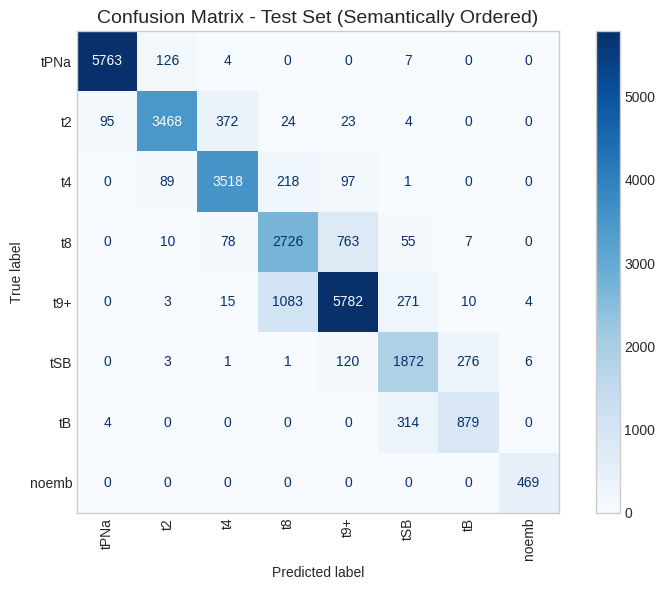

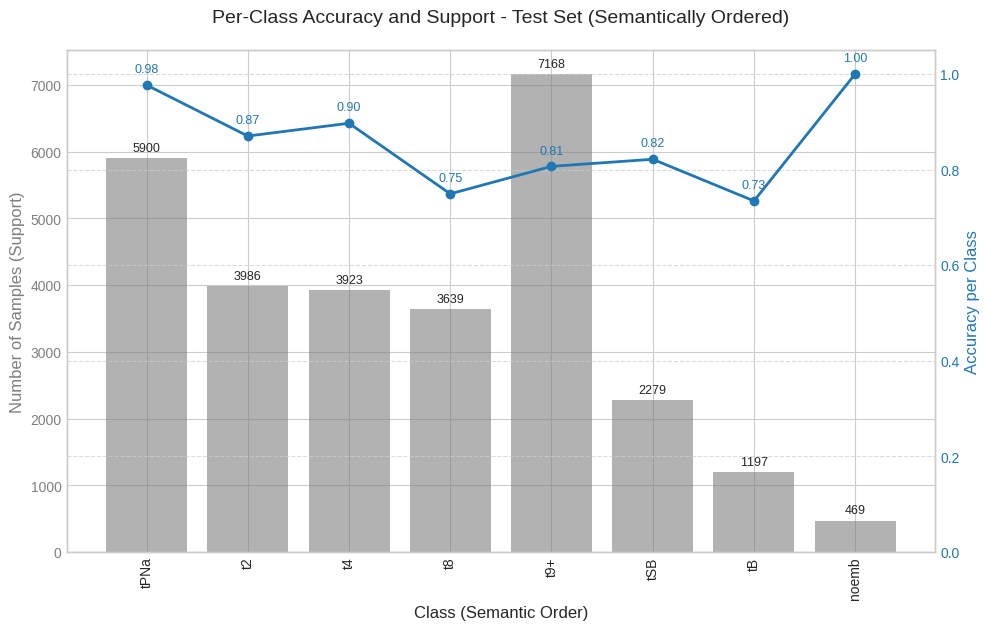

In [ ]:
# -*- coding: utf-8 -*-
import os, time, copy
from pathlib import Path
from collections import Counter
import warnings # Import warnings module

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode

import timm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# ==========================================
# Configuration (Should match training setup)
# ==========================================
DATA_DIR          = "/content/Sorted_Images" # Root directory with class subfolders
BEST_MODEL_PATH   = "/content/best_embryo_classifier_grayscale.pth" # Path to your saved model
MODEL_NAME        = "convnext_base.clip_laion2b_augreg_ft_in12k_in1k" # Model architecture used for training
INPUT_SIZE        = 256   # Input size used during training
BATCH_SIZE        = 16*5 # Use a reasonable batch size for inference (e.g., 64, 128, or the one from training)
RANDOM_STATE      = 1337  # MUST be the same as used for the original train/val/test split
NUM_WORKERS       = 2
DEVICE            = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the desired semantic order for classes
# <<< MODIFICATION START >>>
SEMANTIC_CLASS_ORDER = [
    'tPB2', 'tPNa', 'tPNf', 't2', 't3', 't4', 't5',
    't6', 't7', 't8', 't9+', 'tM', 'tSB', 'tB', 'tEB',"noemb"
]

SEMANTIC_CLASS_ORDER = [
    'tPNa',  't2',  't4',  't8', 't9+',  'tSB', 'tB',"noemb"
]
# <<< MODIFICATION END >>>


# ============================
# 1) Helper Functions (from training)
# ============================
def get_embryo_prefix(filepath: str):
    """Return substring before the first `_RUN` in filename."""
    fname = os.path.basename(filepath)
    parts = fname.rsplit("_RUN", 1)
    return parts[0] if len(parts) > 1 else None

# ============================
# 2) Discover Classes and Test Files (MUST replicate original split)
# ============================
print(f"Looking for images in: {DATA_DIR}")
ALLOWED_EXT = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".gif"}
all_image_files = []
for root, _, files in os.walk(DATA_DIR):
    for f in files:
        if Path(f).suffix.lower() in ALLOWED_EXT:
            all_image_files.append(os.path.join(root, f))

if not all_image_files:
    raise RuntimeError(f"No images found in {DATA_DIR}. Cannot perform evaluation.")

print(f"Found {len(all_image_files)} total image files.")

# --- Replicate the exact train/val/test split logic ---
file_embryo_pairs = [(fp, get_embryo_prefix(fp)) for fp in all_image_files]
file_embryo_pairs = [(fp, e) for fp, e in file_embryo_pairs if e]
unique_embryos    = sorted({e for _, e in file_embryo_pairs})

if len(unique_embryos) < 3:
    print(f"Warning: Found only {len(unique_embryos)} embryo groups. Splitting might differ if training used >2.")
    if len(unique_embryos) == 2:
         train_embryos, val_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
         test_embryos = []
    elif len(unique_embryos) <= 1:
         train_embryos = unique_embryos
         val_embryos, test_embryos = [], []
    else:
        test_embryos = []
else:
    train_embryos, val_test_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
    val_embryos, test_embryos       = train_test_split(val_test_embryos, test_size=0.5, random_state=RANDOM_STATE)

test_set = set(test_embryos)
test_files = [fp for fp, e in file_embryo_pairs if e in test_set]

if not test_files:
    print("No test files identified using the specified split logic and random state. Exiting.")
    exit()

print(f"Identified {len(test_files)} test files belonging to {len(test_set)} embryo groups.")

# --- Discover classes (Alphabetical order initially) ---
discovered_class_names = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])
if not discovered_class_names:
     raise RuntimeError(f"No subdirectories (classes) found in {DATA_DIR}")
num_classes = len(discovered_class_names)

# <<< MODIFICATION START >>>
# Verify consistency between discovered classes and semantic order
discovered_set = set(discovered_class_names)
semantic_set = set(SEMANTIC_CLASS_ORDER)

if discovered_set != semantic_set:
    error_message = "Mismatch between discovered classes and SEMANTIC_CLASS_ORDER!\n"
    missing_in_semantic = discovered_set - semantic_set
    missing_in_discovered = semantic_set - discovered_set
    if missing_in_semantic:
        error_message += f"  Classes discovered but not in SEMANTIC_CLASS_ORDER: {sorted(list(missing_in_semantic))}\n"
    if missing_in_discovered:
        error_message += f"  Classes in SEMANTIC_CLASS_ORDER but not discovered: {sorted(list(missing_in_discovered))}\n"
    raise ValueError(error_message + "Please update SEMANTIC_CLASS_ORDER or check your data directory.")

# Use the original alphabetical mapping for data loading & model output interpretation
# This assumes the model was trained with classes sorted alphabetically
original_class_to_idx = {c: i for i, c in enumerate(discovered_class_names)}
original_idx_to_class = {i: c for c, i in original_class_to_idx.items()}
print(f"Found {num_classes} classes (alphabetical): {discovered_class_names}")
print(f"Using semantic order for plots: {SEMANTIC_CLASS_ORDER}")
# <<< MODIFICATION END >>>


# ============================
# 3) Define Transforms (MUST match validation/test transforms from training)
# ============================
try:
    model_cfg = timm.get_pretrained_cfg(MODEL_NAME)
    img_mean, img_std = model_cfg.mean, model_cfg.std
    interp_str = getattr(model_cfg, "interpolation", "bicubic")
    interpolation = InterpolationMode.BICUBIC if isinstance(interp_str, str) else interp_str
except Exception as e:
    print(f"Warning: Could not get pretrained config for {MODEL_NAME}. Using default ImageNet stats. Error: {e}")
    img_mean, img_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    interpolation = InterpolationMode.BICUBIC

eval_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")),
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.ToTensor(),
    transforms.Normalize(img_mean, img_std),
])

# ============================
# 4) Create Dataset & DataLoader for Test Set
# ============================
class EvaluationDataset(Dataset):
    def __init__(self, files, class_to_idx, transform=None): # Use original_class_to_idx here
        self.files = files
        self.class_to_idx = class_to_idx # This should be the original mapping
        self.transform = transform
        self.labels = []
        valid_files = []
        for p in self.files:
             # Ensure the parent directory name (class) is valid
             class_name = Path(p).parent.name
             if class_name in self.class_to_idx:
                  self.labels.append(self.class_to_idx[class_name])
                  valid_files.append(p)
             else:
                  warnings.warn(f"Skipping file '{p}' because its class '{class_name}' is not in the recognized class list.")
        self.files = valid_files # Update files list to only include valid ones


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        label = self.labels[idx] # Already mapped to original index
        try:
            img = Image.open(path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            return img, label
        except Exception as e:
            print(f"Error loading image {path}: {e}. Returning dummy data.")
            return torch.zeros((3, INPUT_SIZE, INPUT_SIZE)), -1 # Use -1 for error label

def collate_fn_skip_errors(batch):
    batch = [item for item in batch if item[1] != -1]
    if not batch:
        return None
    return torch.utils.data.dataloader.default_collate(batch)

# <<< MODIFICATION START >>>
# Pass the original alphabetical class mapping to the Dataset
test_ds = EvaluationDataset(test_files, original_class_to_idx, eval_tfms)
# <<< MODIFICATION END >>>

if not test_ds:
     print("Test dataset is empty after initialization/filtering. Exiting.")
     exit()

test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True,
                         collate_fn=collate_fn_skip_errors)

print(f"Test DataLoader created with {len(test_loader)} batches for {len(test_ds)} samples.")

# ============================
# 5) Load Trained Model
# ============================
print(f"Loading model architecture: {MODEL_NAME}")
# num_classes must match the number of classes the model was trained on (using the original alphabetical order)
model = timm.create_model(MODEL_NAME, pretrained=False, num_classes=num_classes)

print(f"Loading trained weights from: {BEST_MODEL_PATH}")
if not os.path.exists(BEST_MODEL_PATH):
    raise FileNotFoundError(f"Model weights file not found at {BEST_MODEL_PATH}. Cannot evaluate.")

state_dict = torch.load(BEST_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)

model.to(DEVICE)
model.eval()
print("Model loaded and set to evaluation mode.")

# ============================
# 6) Run Inference on Test Set
# ============================
all_labels = [] # Will contain original numeric labels (0 to N-1, alphabetical)
all_preds = []  # Will contain original numeric predictions (0 to N-1, alphabetical)

print(f"\nRunning inference on the test set using device: {DEVICE}...")
with torch.no_grad():
    for batch in tqdm(test_loader, desc="Evaluating"):
        if batch is None:
             print("Skipping an empty batch (likely due to image loading errors).")
             continue

        inputs, labels = batch # labels are original indices
        inputs = inputs.to(DEVICE, non_blocking=True)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1) # preds are original indices

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

print("Inference complete.")

if not all_labels:
    print("No labels were collected. Cannot generate report or confusion matrix. Check data loading.")
    exit()

all_labels = np.array(all_labels)
all_preds = np.array(all_preds)

# ============================
# 7) Calculate & Display Metrics (with Semantic Ordering for Plots)
# ============================

# --- Get Class Names in Both Orders ---
# <<< MODIFICATION START >>>
# original_target_names corresponds to indices 0, 1, ... from the alphabetical discovery
original_target_names = [original_idx_to_class[i] for i in sorted(original_idx_to_class.keys())]
# semantic_target_names is the desired order for display
semantic_target_names = SEMANTIC_CLASS_ORDER
# <<< MODIFICATION END >>>


# --- Classification Report ---
print("\n" + "="*30)
print(" Classification Report (Test Set)")
print("="*30)
try:
    # Generate report using original indices but display with semantic names
    # NOTE: The *order* of rows in the report will follow semantic_target_names.
    #       The metrics themselves are calculated based on the original numeric labels.
    report = classification_report(
        all_labels,
        all_preds,
        labels=range(num_classes), # Ensure all potential original labels are considered
        target_names=semantic_target_names, # Use semantic names for display
        digits=4,
        zero_division=0
    )
    print(report)
    with open("test_classification_report_semantic.txt", "w") as f:
        f.write(f"Report based on semantic class order: {semantic_target_names}\n\n")
        f.write(report)
    print("Classification report saved to test_classification_report_semantic.txt")

except Exception as e:
    print(f"Error generating classification report: {e}")
    print(f"Unique True Labels encountered (numeric): {np.unique(all_labels)}")
    print(f"Unique Predicted Labels encountered (numeric): {np.unique(all_preds)}")


# --- Confusion Matrix ---
print("\n" + "="*30)
print(" Confusion Matrix (Test Set - Semantically Ordered)")
print("="*30)
try:
    # <<< MODIFICATION START >>>
    # 1. Calculate CM using original numeric labels (indices 0..N-1)
    cm_original = confusion_matrix(all_labels, all_preds, labels=range(num_classes))

    # 2. Create mapping from original names to their indices
    original_name_to_idx = {name: i for i, name in enumerate(original_target_names)}

    # 3. Get the list of *original indices* corresponding to the desired semantic order
    semantic_idx_order = [original_name_to_idx[name] for name in semantic_target_names]

    # 4. Reorder the rows and columns of the confusion matrix
    cm_reordered = cm_original[semantic_idx_order][:, semantic_idx_order]

    # 5. Create DataFrame with semantic order
    cm_df_semantic = pd.DataFrame(cm_reordered, index=semantic_target_names, columns=semantic_target_names)
    # <<< MODIFICATION END >>>

    print("Confusion Matrix values (semantically ordered):")
    print(cm_df_semantic)
    # Save reordered CM to CSV
    cm_df_semantic.to_csv("test_confusion_matrix_semantic.csv")
    print("Semantically ordered confusion matrix saved to test_confusion_matrix_semantic.csv")


    # --- Plot Reordered Confusion Matrix ---
    print("\nGenerating semantically ordered confusion matrix plot...")
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(max(8, num_classes * 0.6), max(6, num_classes * 0.5)))

    # <<< MODIFICATION START >>>
    # Use the reordered matrix and semantic labels for display
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_reordered, display_labels=semantic_target_names)
    # <<< MODIFICATION END >>>

    disp.plot(cmap='Blues', ax=ax, xticks_rotation='vertical', values_format='d')
    ax.set_title('Confusion Matrix - Test Set (Semantically Ordered)', fontsize=14)
    ax.grid(False)
    plt.tight_layout()
    plt.savefig("test_confusion_matrix_semantic.png", dpi=150)
    print("Semantically ordered confusion matrix plot saved to test_confusion_matrix_semantic.png")
    # plt.show()


    # --- Plot Class Distribution vs. Correct/Incorrect (Semantically Ordered) ---
    print("\nGenerating semantically ordered per-class accuracy plot...")
    # <<< MODIFICATION START >>>
    # Calculate metrics from the *reordered* confusion matrix
    with np.errstate(divide='ignore', invalid='ignore'): # Suppress divide-by-zero warnings for classes with no support
         class_accuracy_reordered = cm_reordered.diagonal() / cm_reordered.sum(axis=1)
    support_reordered = cm_reordered.sum(axis=1)
    # Replace NaN results (from zero support) with 0 or another indicator if preferred
    class_accuracy_reordered = np.nan_to_num(class_accuracy_reordered, nan=0.0)
    # <<< MODIFICATION END >>>


    fig, ax1 = plt.subplots(figsize=(max(10, num_classes * 0.7), 6))

    color_support = 'tab:grey'
    ax1.set_xlabel('Class (Semantic Order)', fontsize=12)
    ax1.set_ylabel('Number of Samples (Support)', color=color_support, fontsize=12)
    # <<< MODIFICATION START >>>
    # Use semantic names and reordered support
    bars = ax1.bar(semantic_target_names, support_reordered, color=color_support, alpha=0.6, label='Support')
    # <<< MODIFICATION END >>>
    ax1.tick_params(axis='y', labelcolor=color_support)
    ax1.tick_params(axis='x', rotation=90)
    ax1.bar_label(bars, padding=3, fontsize=9)

    ax2 = ax1.twinx()
    color_acc = 'tab:blue'
    ax2.set_ylabel('Accuracy per Class', color=color_acc, fontsize=12)
    # <<< MODIFICATION START >>>
    # Use semantic names and reordered accuracy
    ax2.plot(semantic_target_names, class_accuracy_reordered, color=color_acc, marker='o', linestyle='-', linewidth=2, label='Class Accuracy')
     # Add accuracy values as text on the line plot
    for i, acc in enumerate(class_accuracy_reordered):
        # Plot text slightly offset for readability, using the index i for x-position
        ax2.text(i, acc + 0.02, f'{acc:.2f}', color=color_acc, ha='center', va='bottom', fontsize=9)
    # <<< MODIFICATION END >>>
    ax2.tick_params(axis='y', labelcolor=color_acc)
    ax2.set_ylim(0, 1.05)


    fig.tight_layout()
    ax1.set_title('Per-Class Accuracy and Support - Test Set (Semantically Ordered)', fontsize=14, pad=20)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.savefig("test_per_class_accuracy_semantic.png", dpi=150)
    print("Semantically ordered per-class accuracy plot saved to test_per_class_accuracy_semantic.png")
    # plt.show()

except Exception as e:
    print(f"Error generating confusion matrix or plots: {e}")
    # Print details relevant to the reordering
    print(f"Original CM shape: {cm_original.shape if 'cm_original' in locals() else 'Not calculated'}")
    print(f"Reordered CM shape: {cm_reordered.shape if 'cm_reordered' in locals() else 'Not calculated'}")
    print(f"Semantic target names: {semantic_target_names}")
    print(f"Original target names: {original_target_names}")


print("\nEvaluation finished.")

In [ ]:
# ------------------------------------------------------------
# NEW TRAINING (Corrected Full Script)
# ------------------------------------------------------------

import os
import time
import copy
import glob
import math
import random
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Sampler
from torch.amp import GradScaler, autocast
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode

import timm
import timm.scheduler as ts
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
from tqdm.auto import tqdm

# -----------------------------
# Configuration (edit here)
# -----------------------------
DATA_DIR       = "/content/Sorted_Images_Tinted"  # root with class subfolders
MODEL_NAME     = "convnext_base.clip_laion2b_augreg_ft_in12k_in1k"
INPUT_SIZE     = 256
BATCH_SIZE     = 7*24
NUM_EPOCHS     = 5
LEARNING_RATE  = 1e-4
WEIGHT_DECAY   = 5e-3
ETA_MIN_FACTOR = 100
RANDOM_STATE   = 1337
NUM_WORKERS    = 2     # Set to 0 for debugging DataLoader issues
DEVICE         = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PRINT_FREQ     = 5
SAVE_MODEL_PATH= "best_embryo_classifie_rtinted.pth" # Define save path

# ============================
# Helpers
# ============================
class AddGaussianNoise(nn.Module):
    """Additive Gaussian noise to a tensor with probability p."""
    def __init__(self, mean: float = 0.0, std: float = 0.05, p: float = 0.5):
        super().__init__()
        self.mean, self.std, self.p = mean, std, p

    def forward(self, x: torch.Tensor):
        if torch.rand(1).item() < self.p:
            # Ensure noise tensor is on the same device as input tensor x
            noise = torch.randn_like(x) * self.std + self.mean
            return x + noise
        return x


def get_embryo_prefix(filepath: str):
    """Return substring before the first `_RUN` in filename."""
    fname = os.path.basename(filepath)
    parts = fname.rsplit("_RUN", 1)
    return parts[0] if len(parts) > 1 else None


def compute_class_weights(file_list, class_to_idx):
    """Computes class weights based on inverse frequency, clamped."""
    labels = [class_to_idx.get(Path(p).parent.name) for p in file_list]
    # Filter out None labels if a file's parent dir doesn't match a class
    labels = [l for l in labels if l is not None]
    if not labels:
        print("Warning: No valid labels found for weight calculation.")
        return None

    freq   = Counter(labels)
    total  = sum(freq.values())
    num_classes = len(class_to_idx)

    # Calculate weights, handle missing classes gracefully (assign weight 1 or mean weight)
    weights = []
    mean_weight = total / len(freq) if freq else 1.0 # Avg weight for observed classes
    for i in range(num_classes):
        if freq.get(i, 0) == 0:
             # Assign mean weight or 1.0 to classes not present in this subset
             class_weight = mean_weight
             print(f"Warning: Class index {i} not found in file list for weight calculation. Assigning weight {class_weight:.2f}.")
        else:
             class_weight = total / freq[i]
        weights.append(class_weight)

    weights_tensor = torch.tensor(weights, dtype=torch.float32)
    # Clamp weights to prevent extreme values - adjust max clamp value as needed
    weights_tensor = torch.clamp(weights_tensor, min=0.1, max=10.0) # Increased max clamp
    print(f"Computed class weights (clamped): {weights_tensor.numpy().round(2)}")
    return weights_tensor

# ============================
# 1) Discover all image files
# ============================
print(f"Searching for images in: {DATA_DIR}")
ALLOWED_EXT = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".gif"}
all_image_files = []
for root, _, files in os.walk(DATA_DIR):
    # Ensure the directory itself exists before proceeding
    if not os.path.isdir(root):
        print(f"Warning: Skipping non-directory path found during walk: {root}")
        continue
    for f in files:
        file_path = os.path.join(root, f)
        # Basic check if it's a file and has an allowed extension
        if os.path.isfile(file_path) and Path(f).suffix.lower() in ALLOWED_EXT:
            all_image_files.append(file_path)

if not all_image_files:
    raise RuntimeError(f"No images with allowed extensions {ALLOWED_EXT} found in {DATA_DIR} or its subdirectories.")
print(f"Found {len(all_image_files)} image files.")

# Map each file to its embryo prefix
file_embryo_pairs = [(fp, get_embryo_prefix(fp)) for fp in all_image_files]
file_embryo_pairs = [(fp, e) for fp, e in file_embryo_pairs if e]
unique_embryos    = sorted({e for _, e in file_embryo_pairs})

if not unique_embryos:
    raise RuntimeError(f"No files found with the '_RUN' naming convention needed for embryo splitting.")
if len(unique_embryos) < 3:
    # Adjust split logic if needed, ensure consistency if resuming
    print(f"Warning: Found only {len(unique_embryos)} embryo groups. Splitting might be suboptimal or change behavior if <3.")
    if len(unique_embryos) == 2:
         train_embryos, val_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
         test_embryos = [] # No separate test set
    elif len(unique_embryos) == 1:
         train_embryos = unique_embryos
         val_embryos, test_embryos = [], []
    else: # 0 embryos
        raise RuntimeError("No valid embryo groups found after filtering.")
else:
    train_embryos, val_test_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
    val_embryos, test_embryos       = train_test_split(val_test_embryos, test_size=0.5, random_state=RANDOM_STATE)

# Ensure sets are disjoint even if some are empty
assert not (set(train_embryos) & set(val_embryos))
assert not (set(train_embryos) & set(test_embryos))
assert not (set(val_embryos) & set(test_embryos))

train_set, val_set, test_set = map(set, (train_embryos, val_embryos, test_embryos))
train_files = [fp for fp, e in file_embryo_pairs if e in train_set]
val_files   = [fp for fp, e in file_embryo_pairs if e in val_set]
test_files  = [fp for fp, e in file_embryo_pairs if e in test_set]
print(f"Train files: {len(train_files)} (Embryos: {len(train_embryos)})")
print(f"Val files:   {len(val_files)} (Embryos: {len(val_embryos)})")
print(f"Test files:  {len(test_files)} (Embryos: {len(test_embryos)})")

# ============================
# 3) Class discovery
# ============================
# Robustly find class directories
class_names = []
if os.path.exists(DATA_DIR) and os.path.isdir(DATA_DIR):
    class_names = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])

if not class_names:
     raise RuntimeError(f"No subdirectories (classes) found directly under {DATA_DIR}")
num_classes = len(class_names)
class_to_idx = {c: i for i, c in enumerate(class_names)}
idx_to_class = {i: c for c, i in class_to_idx.items()}
print(f"Found {num_classes} classes: {class_names}")

# ============================
# 4) Transforms (scale-preserving)
# ============================
try:
    model_cfg = timm.get_pretrained_cfg(MODEL_NAME)
    img_mean, img_std = model_cfg.mean, model_cfg.std
    interp_str = getattr(model_cfg, "interpolation", "bicubic")
    interpolation = InterpolationMode.BICUBIC if isinstance(interp_str, str) else interp_str
except Exception as e:
    print(f"Warning: Could not get pretrained config for {MODEL_NAME}. Using default ImageNet stats. Error: {e}")
    img_mean, img_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    interpolation = InterpolationMode.BICUBIC


train_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")), # Essential for pretrained models
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.RandomHorizontalFlip(p=0.5), # Adjusted p
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomResizedCrop(INPUT_SIZE, scale=(0.7, 1.0), ratio=(0.9, 1.1)),
    transforms.ToTensor(),
    AddGaussianNoise(std=0.075, p=0.5), # Adjusted std/p
    transforms.Normalize(img_mean, img_std),
    transforms.RandomErasing(p=0.25, scale=(0.05, 0.25), ratio=(0.5, 2.5), value=0)
])
val_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")), # Essential for pretrained models
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.ToTensor(),
    transforms.Normalize(img_mean, img_std),
])

data_transforms = {"train": train_tfms, "val": val_tfms, "test": val_tfms}

# ============================
# 5) Dataset & Balanced Sampler
# ============================

class EmbryoDataset(Dataset):
    def __init__(self, files, class_to_idx, transform=None):
        self.files = files
        self.class_to_idx = class_to_idx
        self.transform = transform
        # Pre-compute labels and check for validity
        self.labels = []
        valid_files = []
        for p in self.files:
            parent_name = Path(p).parent.name
            label = self.class_to_idx.get(parent_name) # Use .get for safety
            if label is not None:
                self.labels.append(label)
                valid_files.append(p)
            else:
                print(f"Warning: File '{p}' belongs to directory '{parent_name}' which is not in class_to_idx. Skipping file.")
        self.files = valid_files # Update file list to only include valid ones
        print(f"Initialized Dataset with {len(self.files)} valid files.")


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        label = self.labels[idx]
        try:
            # Open image and convert to RGB (expected by most pretrained models)
            img = Image.open(path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            return img, label
        except FileNotFoundError:
             print(f"\nERROR: File not found at {path}. Skipping.")
             return None # Handled by collate_fn
        except Exception as e:
            print(f"\nWARNING: Error loading/transforming image {path}: {e}. Skipping.")
            # Return placeholder data recognizable by collate_fn
            return None # Will be filtered by collate_fn

# --- Collate function to handle None items from Dataset ---
def collate_fn_skip_none(batch):
    # Filter out None items from the batch
    batch = [item for item in batch if item is not None]
    if not batch:
        return None # Return None if the whole batch was problematic
    try:
        # Use default collate on the filtered batch
        return torch.utils.data.dataloader.default_collate(batch)
    except RuntimeError as e:
        print(f"\nError during collate_fn: {e}. This might happen if tensors in a batch have different shapes after filtering Nones.")
        # You might need more sophisticated padding or filtering here if shapes vary wildly.
        return None # Skip batch if collation fails


# --- Custom sampler for exact per-batch class balance ---
class BalancedBatchSampler(Sampler):
    def __init__(self, labels, batch_size, num_classes): # Added num_classes
        self.labels = np.array(labels) # Use numpy for easier indexing
        self.batch_size = batch_size
        # Ensure all class indices up to num_classes-1 are considered, even if absent in labels
        self.labels_set = list(range(num_classes))
        self.num_classes = num_classes # Store num_classes

        if self.num_classes == 0:
             raise ValueError("No classes specified for BalancedBatchSampler.")
        if batch_size < self.num_classes:
            print(f"Warning: batch_size ({batch_size}) < num_classes ({self.num_classes}). Sampler might behave unexpectedly or error.")
            # Decide how to handle: raise error or try to proceed? For now, proceed with warning.
            # raise ValueError(f"batch_size ({batch_size}) must be >= num_classes ({self.num_classes})")
        if batch_size % self.num_classes != 0:
            print(f"Warning: batch_size {batch_size} not perfectly divisible by num_classes {self.num_classes}. Batches might have slight imbalance.")

        # Ensure samples_per_class is at least 1 if batch_size >= num_classes
        self.samples_per_class = max(1, batch_size // self.num_classes)

        # Store indices for each class, handle classes potentially missing from labels
        self.class_to_indices = {cls: np.where(self.labels == cls)[0] for cls in self.labels_set}
        # Store lengths for refill logic
        self.class_lengths = {cls: len(idxs) for cls, idxs in self.class_to_indices.items()}

        # Identify classes with 0 samples in the current dataset subset
        self.classes_with_zero_samples = {cls for cls, length in self.class_lengths.items() if length == 0}
        if self.classes_with_zero_samples:
            print(f"Warning: Classes with zero samples in this dataset split: {self.classes_with_zero_samples}")

        # Effective number of classes with samples
        self.num_effective_classes = self.num_classes - len(self.classes_with_zero_samples)
        if self.num_effective_classes == 0:
             raise ValueError("No classes with samples available for sampling in this dataset split.")

        # Calculate number of batches based on total samples and batch size
        self.num_batches = len(self.labels) // self.batch_size


    def __iter__(self):
        # Copy indices for shuffling within epoch - only for classes with samples
        indices_copy = {cls: idxs.copy() for cls, idxs in self.class_to_indices.items() if self.class_lengths[cls] > 0}
        # Shuffle indices within each class list initially
        for cls in indices_copy:
            np.random.shuffle(indices_copy[cls])

        # Keep track of remaining indices per class
        current_indices = {cls: list(indices_copy[cls]) for cls in indices_copy}
        # Pointer to current position in each list
        current_pos = {cls: 0 for cls in indices_copy}

        # List of classes that actually have samples
        active_classes = [cls for cls in self.labels_set if cls not in self.classes_with_zero_samples]
        if not active_classes: # Should be caught earlier, but double-check
             return iter([]) # Return empty iterator

        # Adjust samples per class dynamically based on active classes for better balance
        effective_samples_per_class = max(1, self.batch_size // self.num_effective_classes)


        for _ in range(self.num_batches):
            batch = []
            samples_drawn = 0
            class_idx_cycle = 0 # Cycle through active classes

            while samples_drawn < self.batch_size:
                 cls = active_classes[class_idx_cycle % len(active_classes)]
                 class_idx_cycle += 1

                 # How many samples to try drawing for this class in this round
                 # Aim for adjusted samples_per_class, but don't exceed batch_size
                 needed_now = min(effective_samples_per_class, self.batch_size - samples_drawn)

                 drawn_for_cls = 0
                 while drawn_for_cls < needed_now:
                      # Check if we need to refill (reshuffle and reset pointer)
                      if current_pos[cls] >= self.class_lengths[cls]:
                           np.random.shuffle(indices_copy[cls]) # Reshuffle original list copy
                           current_indices[cls] = list(indices_copy[cls])
                           current_pos[cls] = 0

                      # Add index to batch
                      batch.append(current_indices[cls][current_pos[cls]])
                      current_pos[cls] += 1
                      drawn_for_cls += 1
                      samples_drawn += 1
                      if samples_drawn >= self.batch_size:
                          break # Exit inner loop if batch is full

            # Shuffle the final batch to mix classes
            if len(batch) == self.batch_size: # Only yield complete batches
                random.shuffle(batch)
                yield batch
            # else: print(f"Debug: Skipped incomplete batch of size {len(batch)}") # Optional debug

    def __len__(self):
        # Return the calculated number of full batches
        return self.num_batches


# Instantiate datasets
train_ds = EmbryoDataset(train_files, class_to_idx, train_tfms) if train_files else None
val_ds   = EmbryoDataset(val_files,   class_to_idx, val_tfms) if val_files else None
test_ds  = EmbryoDataset(test_files,  class_to_idx, val_tfms) if test_files else None

# DataLoaders
train_loader, val_loader, test_loader = None, None, None
steps_per_epoch = 0

if train_ds and len(train_ds) > 0:
    train_labels = train_ds.labels # Use pre-computed, validated labels
    if not train_labels:
        print("Warning: No labels found for training data after validation. Using standard DataLoader.")
        train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                  num_workers=NUM_WORKERS, pin_memory=True,
                                  persistent_workers=(NUM_WORKERS > 0),
                                  collate_fn=collate_fn_skip_none)
    else:
        # Adjust BATCH_SIZE if needed for divisibility by num_classes
        if BATCH_SIZE % num_classes != 0:
            original_bs = BATCH_SIZE
            # Find nearest lower batch size divisible by num_classes
            BATCH_SIZE = (BATCH_SIZE // num_classes) * num_classes
            if BATCH_SIZE == 0: BATCH_SIZE = num_classes # Ensure it's at least num_classes
            print(f"Warning: Original BATCH_SIZE {original_bs} not divisible by num_classes {num_classes}. Adjusted BATCH_SIZE to {BATCH_SIZE} for Balanced Sampler.")

        try:
            # Pass num_classes to the sampler
            balanced_sampler = BalancedBatchSampler(train_labels, BATCH_SIZE, num_classes)
            train_loader = DataLoader(train_ds,
                                      batch_sampler=balanced_sampler,
                                      num_workers=NUM_WORKERS,
                                      pin_memory=True,
                                      persistent_workers=(NUM_WORKERS > 0), # persistent_workers requires num_workers > 0
                                      collate_fn=collate_fn_skip_none) # Use the collate function here too
            steps_per_epoch = len(balanced_sampler) # Length comes from the sampler
        except ValueError as e:
            print(f"Error creating BalancedBatchSampler: {e}. Falling back to standard DataLoader.")
            train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                      num_workers=NUM_WORKERS, pin_memory=True,
                                      persistent_workers=(NUM_WORKERS > 0),
                                      collate_fn=collate_fn_skip_none)
            steps_per_epoch = len(train_loader)
else:
    print("Training dataset is empty or failed to initialize.")

if val_ds and len(val_ds) > 0:
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False,
                            num_workers=NUM_WORKERS, pin_memory=True,
                            persistent_workers=(NUM_WORKERS > 0),
                            collate_fn=collate_fn_skip_none) # Use collate here too
else:
    print("Validation dataset is empty or failed to initialize.")

if test_ds and len(test_ds) > 0:
    test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=NUM_WORKERS, pin_memory=True,
                             persistent_workers=(NUM_WORKERS > 0),
                             collate_fn=collate_fn_skip_none) # Use collate here too
else:
    print("Test dataset is empty or failed to initialize.")

print(f"Train steps per epoch: {steps_per_epoch}")

# ============================
# 6) Model & optimizer
# ============================
model = timm.create_model(MODEL_NAME, pretrained=True, num_classes=num_classes)
model.to(DEVICE)
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# Scheduler setup
max_steps = steps_per_epoch * NUM_EPOCHS if steps_per_epoch > 0 else 1 # Avoid 0 max_steps
warmup_steps = int(0.05 * max_steps) if max_steps > 1 else 0

qscheduler = ts.CosineLRScheduler(
    optimizer,
    t_initial=max_steps,
    warmup_t=warmup_steps,
    warmup_lr_init=LEARNING_RATE * 0.1, # Consider LEARNING_RATE * 0.01
    lr_min=LEARNING_RATE / ETA_MIN_FACTOR,
    t_in_epochs=False, # Step per batch
)

# Criterion setup
class_weights = None
if train_ds and len(train_ds) > 0:
    # Pass train_ds.files and train_ds.class_to_idx if files/labels were filtered
    class_weights = compute_class_weights(train_ds.files, train_ds.class_to_idx)
    if class_weights is not None:
        class_weights = class_weights.to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)

# AMP GradScaler (Corrected)
scaler = GradScaler(enabled=(DEVICE.type == 'cuda'))

# ============================
# 7) Training & Validation Function (Corrected)
# ============================
def run_epoch(model, loader, criterion, scaler, device, optimizer=None, scheduler=None, phase="train", epoch_idx=0, steps_per_epoch=1):
    is_train = phase == "train"
    if is_train:
        if optimizer is None:
            raise ValueError("Optimizer must be provided for training phase.")
        model.train()
    else:
        model.eval()

    running_loss, running_corrects = 0.0, 0
    total_samples_processed = 0
    all_labels, all_preds = [], [] # For validation/test metrics

    pbar = tqdm(loader, desc=f"{phase.capitalize():<5} Epoch {epoch_idx+1}", leave=False)

    for step, batch in enumerate(pbar):
        if batch is None:
            # This message comes from collate_fn or can be added here
            # print(f"Skipping potentially problematic batch at step {step}.")
            continue  # Skip this iteration if batch is invalid

        try:
            # --- Unpack the batch *after* the None check ---
            inputs, labels = batch
        except Exception as e:
             print(f"\nError unpacking batch at step {step}: {e}. Skipping batch.")
             continue
        # --------------------------------------------------

        # Move data to device
        inputs = inputs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        # Use torch.set_grad_enabled for clarity
        with torch.set_grad_enabled(is_train):
            # AMP Autocast (Corrected)
            with autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                outputs = model(inputs)
                # Ensure labels are compatible with loss (e.g., LongTensor for CrossEntropyLoss)
                loss = criterion(outputs, labels.long())

            # Get predictions (outside autocast context is fine)
            preds = torch.argmax(outputs, dim=1)

        # --- Perform backward pass and optimization ONLY if training ---
        if is_train:
            optimizer.zero_grad(set_to_none=True)
            scaler.scale(loss).backward()
            # Optional: Gradient Clipping (uncomment if needed)
            # scaler.unscale_(optimizer)
            # torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            # Update scheduler per step
            if scheduler is not None:
                 global_step = step + epoch_idx * steps_per_epoch
                 try:
                     scheduler.step_update(global_step)
                 except Exception as e_sched:
                     print(f"\nError updating scheduler at global step {global_step}: {e_sched}")


        # --- Accumulate statistics ---
        current_batch_size = inputs.size(0) # Get actual batch size processed
        if current_batch_size > 0:
            running_loss += loss.item() * current_batch_size
            running_corrects += (preds == labels).sum().item()
            total_samples_processed += current_batch_size

            if not is_train:
                all_labels.extend(labels.cpu().tolist())
                all_preds.extend(preds.cpu().tolist())

            # Update postfix using accumulated stats for accuracy
            current_acc = running_corrects / total_samples_processed if total_samples_processed > 0 else 0
            lr_string = f"{optimizer.param_groups[0]['lr']:.2e}" if is_train else ""
            pbar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{current_acc:.3f}", lr=lr_string)
        # --- End Batch Loop ---

    # Calculate epoch metrics using total_samples_processed
    if total_samples_processed == 0:
         print(f"Warning: No samples processed in {phase} epoch {epoch_idx+1}.")
         # Return structure consistent with later expectation
         metrics = {"loss": 0, "acc": 0, "precision": 0, "recall": 0, "f1": 0}
         # Return tuple if needed by calling code: return metrics, [], []
         return metrics

    epoch_loss = running_loss / total_samples_processed
    epoch_acc  = running_corrects / total_samples_processed
    metrics = {"loss": epoch_loss, "acc": epoch_acc}

    # Calculate detailed metrics for val/test phases
    if not is_train:
        if all_labels and all_preds:
            try:
                p, r, f1, _ = precision_recall_fscore_support(
                    all_labels, all_preds, average="weighted", zero_division=0
                )
                metrics.update({"precision": p, "recall": r, "f1": f1})
            except Exception as e_metrics:
                 print(f"\nWarning: Could not calculate detailed metrics for {phase}: {e_metrics}")
                 metrics.update({"precision": 0, "recall": 0, "f1": 0}) # Add defaults
        else:
             metrics.update({"precision": 0, "recall": 0, "f1": 0}) # Add defaults if no labels/preds

    # Return just the metrics dict, as used in the main loop below
    return metrics

# ============================
# 8) Main Training Loop
# ============================
best_val_acc, best_weights = 0.0, None
history = {k: [] for k in ["train_loss", "train_acc", "val_loss", "val_acc", "lr"]}

# Check if training can proceed
if not train_loader:
    print("ERROR: Training loader is not available. Cannot start training.")
else:
    print(f"\nStarting training on {DEVICE} for {NUM_EPOCHS} epochs...")
    for epoch in range(NUM_EPOCHS):
        epoch_start_time = time.time()
        print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

        # --- Train Phase ---
        # Pass necessary components to run_epoch
        train_metrics = run_epoch(
            model, train_loader, criterion, scaler, DEVICE,
            optimizer=optimizer, scheduler=qscheduler, phase="train",
            epoch_idx=epoch, steps_per_epoch=steps_per_epoch
        )
        history["train_loss"].append(train_metrics["loss"])
        history["train_acc"].append(train_metrics["acc"])
        history["lr"].append(optimizer.param_groups[0]['lr']) # Record LR after epoch step updates

        # --- Validation Phase ---
        val_metrics = {"loss": 0, "acc": 0} # Default if no val_loader
        if val_loader:
            # Pass None for optimizer and scheduler in validation phase
            val_metrics = run_epoch(
                model, val_loader, criterion, scaler, DEVICE,
                optimizer=None, scheduler=None, phase="val",
                epoch_idx=epoch # Pass epoch_idx for TQDM description
            )
            history["val_loss"].append(val_metrics["loss"])
            history["val_acc"].append(val_metrics["acc"])
        else:
            # Append default values if no validation set
            history["val_loss"].append(0)
            history["val_acc"].append(0)

        epoch_duration = time.time() - epoch_start_time
        print(f"Epoch {epoch+1} Summary - Time: {epoch_duration:.2f}s")
        print(f"  LR: {optimizer.param_groups[0]['lr']:.2e}")
        print(f"  Train Loss: {train_metrics['loss']:.4f} | Train Acc: {train_metrics['acc']:.4f}")
        if val_loader:
             print(f"  Val Loss:   {val_metrics['loss']:.4f} | Val Acc:   {val_metrics['acc']:.4f}")


        # Save best model based on validation accuracy
        current_val_acc = val_metrics.get('acc', 0) # Use .get for safety
        if val_loader and current_val_acc > best_val_acc:
            best_val_acc = current_val_acc
            best_weights = copy.deepcopy(model.state_dict())
            torch.save(best_weights, SAVE_MODEL_PATH)
            print(f"  ** Best Val Acc ({best_val_acc:.4f}) achieved. Model saved to {SAVE_MODEL_PATH} **")
        elif not val_loader and epoch == NUM_EPOCHS - 1: # Save last model if no validation
             if best_weights is None: # Only save if we haven't saved before
                 best_weights = copy.deepcopy(model.state_dict())
                 torch.save(best_weights, SAVE_MODEL_PATH)
                 print(f"  ** No validation set. Saved model from last epoch to {SAVE_MODEL_PATH} **")


    print("\nTraining finished.")
    # Load the best weights back into the model if they were saved
    if best_weights is not None:
        print("Loading best weights found during training for final testing.")
        model.load_state_dict(best_weights)
    elif os.path.exists(SAVE_MODEL_PATH):
        print(f"Loading previously saved best weights from {SAVE_MODEL_PATH}")
        model.load_state_dict(torch.load(SAVE_MODEL_PATH, map_location=DEVICE))
    else:
        print("Warning: No best weights recorded or saved. Testing with the final model state.")


# ============================
# 9) Testing
# ============================
print("\n" + "="*30)
print(" Starting Evaluation on Test Set")
print("="*30)

if test_loader:
    model.eval() # Ensure model is in eval mode
    test_metrics = run_epoch(
        model, test_loader, criterion, scaler, DEVICE,
        optimizer=None, scheduler=None, phase="test"
    )
    print("\n--- Overall Test Metrics ---")
    print(f" Test Loss: {test_metrics.get('loss', 0):.4f}")
    print(f" Test Acc : {test_metrics.get('acc', 0):.4f}")
    print(f" Test Prec: {test_metrics.get('precision', 0):.4f} (weighted avg)")
    print(f" Test Rec : {test_metrics.get('recall', 0):.4f} (weighted avg)")
    print(f" Test F1  : {test_metrics.get('f1', 0):.4f} (weighted avg)")
    # Note: run_epoch now returns the detailed metrics dict directly
    # print({k:round(v,4) for k,v in test_metrics.items()}) # Alternative print format
else:
    print("Test data loader not available. Skipping testing.")

# ============================
# 10) Plot history
# ============================
if history['train_acc']: # Check if training actually ran and recorded history
    print("\nPlotting training history...")
    try:
        import matplotlib.pyplot as plt
        epochs_ran = list(range(1, len(history['train_acc']) + 1))

        plt.figure(figsize=(18, 5)) # Wider figure

        # Accuracy Plot
        plt.subplot(1, 3, 1)
        plt.plot(epochs_ran, history['train_acc'], 'bo-', label='Train Acc')
        if history['val_acc']: # Only plot if val data exists and was recorded
            plt.plot(epochs_ran, history['val_acc'], 'ro-', label='Val Acc')
        plt.title('Model Accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        # Add marker for best validation accuracy epoch
        if history['val_acc'] and best_val_acc > 0:
            try:
                best_epoch_idx = history['val_acc'].index(max(history['val_acc']))
                best_epoch = best_epoch_idx + 1
                plt.scatter(best_epoch, best_val_acc, marker='*', color='red', s=150, zorder=5, label=f'Best Val Acc ({best_val_acc:.3f})')
                plt.legend(loc='best') # Update legend
            except ValueError:
                print("Could not find max validation accuracy in history for plotting marker.")


        # Loss Plot
        plt.subplot(1, 3, 2)
        plt.plot(epochs_ran, history['train_loss'], 'bo-', label='Train Loss')
        if history['val_loss']: # Only plot if val data exists
            plt.plot(epochs_ran, history['val_loss'], 'ro-', label='Val Loss')
        plt.title('Model Loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)

        # Learning Rate Plot
        plt.subplot(1, 3, 3)
        plt.plot(epochs_ran, history['lr'], 'go-', label='Learning Rate')
        plt.title('Learning Rate Schedule')
        plt.ylabel('Learning Rate')
        plt.xlabel('Epoch')
        plt.legend(loc='best')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0)) # Use scientific notation if needed


        plt.tight_layout()
        plt.savefig('training_history_grayscale.png', dpi=150)
        print("Training curves saved to training_history_grayscale.png")
        # plt.show() # Optionally display the plot directly
    except ImportError:
        print("Matplotlib not found. Skipping history plotting. Install with: pip install matplotlib")
    except Exception as e_plot:
        print(f"Could not plot training history: {e_plot}")
else:
    print("\nNo training history recorded (training might not have run). Skipping plotting.")

print("\nScript finished.")

Searching for images in: /content/Sorted_Images_Tinted
Found 191448 image files.
Train files: 134031 (Embryos: 492)
Val files:   28856 (Embryos: 106)
Test files:  28561 (Embryos: 106)
Found 8 classes: ['noemb', 't2', 't4', 't8', 't9+', 'tB', 'tPNa', 'tSB']
Initialized Dataset with 134031 valid files.
Initialized Dataset with 28856 valid files.
Initialized Dataset with 28561 valid files.
Train steps per epoch: 797
Computed class weights (clamped): [10.    6.91  7.14  6.51  4.3  10.    4.84 10.  ]

Starting training on cuda for 5 epochs...

Epoch 1/5


Train Epoch 1:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 1:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 1 Summary - Time: 708.25s
  LR: 9.06e-05
  Train Loss: 0.7607 | Train Acc: 0.8465
  Val Loss:   0.9496 | Val Acc:   0.8332
  ** Best Val Acc (0.8332) achieved. Model saved to best_embryo_classifie_rtinted.pth **

Epoch 2/5


Train Epoch 2:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 2:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 2 Summary - Time: 687.81s
  LR: 6.58e-05
  Train Loss: 0.6262 | Train Acc: 0.9150
  Val Loss:   0.9440 | Val Acc:   0.8424
  ** Best Val Acc (0.8424) achieved. Model saved to best_embryo_classifie_rtinted.pth **

Epoch 3/5


Train Epoch 3:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 3:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 3 Summary - Time: 677.45s
  LR: 3.52e-05
  Train Loss: 0.5667 | Train Acc: 0.9457
  Val Loss:   0.9704 | Val Acc:   0.8393

Epoch 4/5


Train Epoch 4:   0%|          | 0/797 [00:00<?, ?it/s]

Val   Epoch 4:   0%|          | 0/172 [00:00<?, ?it/s]

Epoch 4 Summary - Time: 676.77s
  LR: 1.05e-05
  Train Loss: 0.5257 | Train Acc: 0.9661
  Val Loss:   0.9490 | Val Acc:   0.8590
  ** Best Val Acc (0.8590) achieved. Model saved to best_embryo_classifie_rtinted.pth **

Epoch 5/5


Train Epoch 5:   0%|          | 0/797 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a31d09be5c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a31d09be5c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

RuntimeError: DataLoader worker (pid(s) 34188) exited unexpectedly

Looking for images in: /content/Sorted_Images_Tinted
Found 191448 total image files.
Identified 28561 test files belonging to 106 embryo groups.
Found 8 classes (alphabetical): ['noemb', 't2', 't4', 't8', 't9+', 'tB', 'tPNa', 'tSB']
Using semantic order for plots: ['tPNa', 't2', 't4', 't8', 't9+', 'tSB', 'tB', 'noemb']
Test DataLoader created with 358 batches for 28561 samples.
Loading model architecture: convnext_base.clip_laion2b_augreg_ft_in12k_in1k
Loading trained weights from: /content/best_embryo_classifie_rtinted.pth
Model loaded and set to evaluation mode.

Running inference on the test set using device: cuda...


Evaluating:   0%|          | 0/358 [00:00<?, ?it/s]

Inference complete.

 Classification Report (Test Set)
              precision    recall  f1-score   support

        tPNa     0.9785    0.9723    0.9754       469
          t2     0.9439    0.9237    0.9337      3986
          t4     0.8973    0.9154    0.9062      3923
          t8     0.7015    0.6878    0.6946      3639
         t9+     0.8443    0.8093    0.8264      7168
         tSB     0.7583    0.7627    0.7605      1197
          tB     0.9858    0.9876    0.9867      5900
       noemb     0.7237    0.8376    0.7765      2279

    accuracy                         0.8642     28561
   macro avg     0.8542    0.8621    0.8575     28561
weighted avg     0.8655    0.8642    0.8644     28561

Classification report saved to test_classification_report_semantic.txt

 Confusion Matrix (Test Set - Semantically Ordered)
Confusion Matrix values (semantically ordered):
       tPNa    t2    t4    t8   t9+   tSB   tB  noemb
tPNa   5827    57    12     0     0     2    2      0
t2       81  3

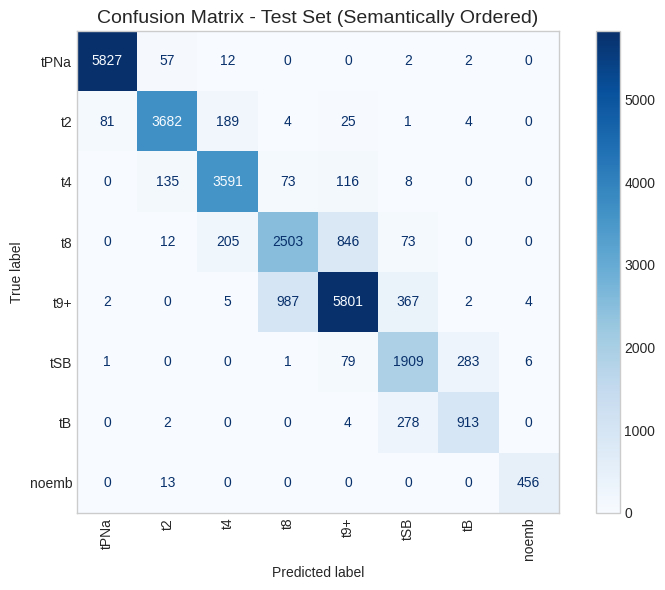

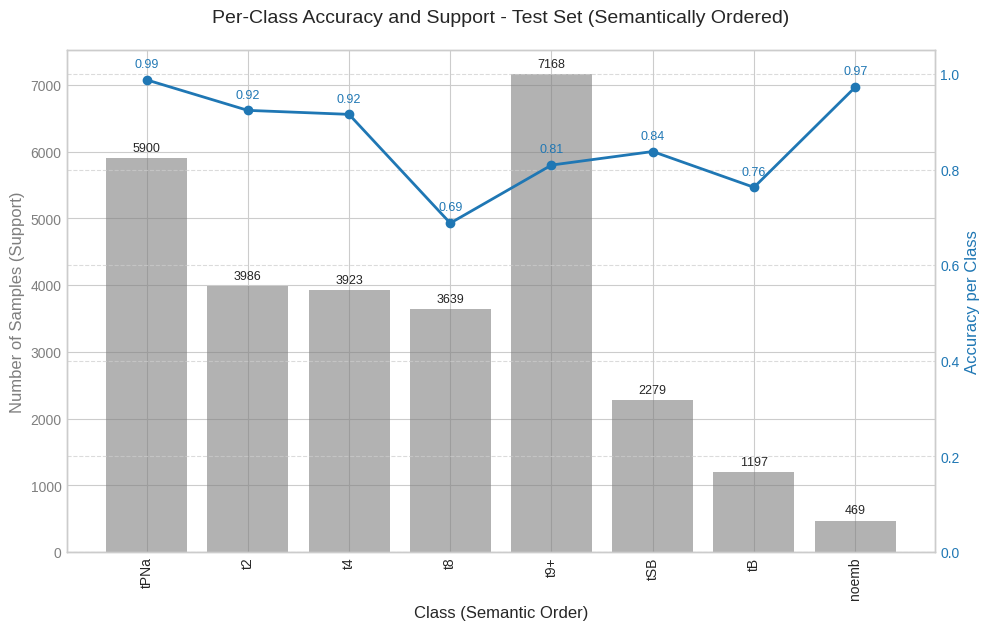

In [ ]:
# -*- coding: utf-8 -*-
import os, time, copy
from pathlib import Path
from collections import Counter
import warnings # Import warnings module

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode

import timm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# ==========================================
# Configuration (Should match training setup)
# ==========================================
DATA_DIR          = "/content/Sorted_Images_Tinted" # Root directory with class subfolders
BEST_MODEL_PATH   = "/content/best_embryo_classifie_rtinted.pth" # Path to your saved model
MODEL_NAME        = "convnext_base.clip_laion2b_augreg_ft_in12k_in1k" # Model architecture used for training
INPUT_SIZE        = 256   # Input size used during training
BATCH_SIZE        = 16*5 # Use a reasonable batch size for inference (e.g., 64, 128, or the one from training)
RANDOM_STATE      = 1337  # MUST be the same as used for the original train/val/test split
NUM_WORKERS       = 2
DEVICE            = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the desired semantic order for classes
# <<< MODIFICATION START >>>
SEMANTIC_CLASS_ORDER = [
    'tPB2', 'tPNa', 'tPNf', 't2', 't3', 't4', 't5',
    't6', 't7', 't8', 't9+', 'tM', 'tSB', 'tB', 'tEB',"noemb"
]

SEMANTIC_CLASS_ORDER = [
    'tPNa',  't2',  't4',  't8', 't9+',  'tSB', 'tB',"noemb"
]
# <<< MODIFICATION END >>>


# ============================
# 1) Helper Functions (from training)
# ============================
def get_embryo_prefix(filepath: str):
    """Return substring before the first `_RUN` in filename."""
    fname = os.path.basename(filepath)
    parts = fname.rsplit("_RUN", 1)
    return parts[0] if len(parts) > 1 else None

# ============================
# 2) Discover Classes and Test Files (MUST replicate original split)
# ============================
print(f"Looking for images in: {DATA_DIR}")
ALLOWED_EXT = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp", ".gif"}
all_image_files = []
for root, _, files in os.walk(DATA_DIR):
    for f in files:
        if Path(f).suffix.lower() in ALLOWED_EXT:
            all_image_files.append(os.path.join(root, f))

if not all_image_files:
    raise RuntimeError(f"No images found in {DATA_DIR}. Cannot perform evaluation.")

print(f"Found {len(all_image_files)} total image files.")

# --- Replicate the exact train/val/test split logic ---
file_embryo_pairs = [(fp, get_embryo_prefix(fp)) for fp in all_image_files]
file_embryo_pairs = [(fp, e) for fp, e in file_embryo_pairs if e]
unique_embryos    = sorted({e for _, e in file_embryo_pairs})

if len(unique_embryos) < 3:
    print(f"Warning: Found only {len(unique_embryos)} embryo groups. Splitting might differ if training used >2.")
    if len(unique_embryos) == 2:
         train_embryos, val_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
         test_embryos = []
    elif len(unique_embryos) <= 1:
         train_embryos = unique_embryos
         val_embryos, test_embryos = [], []
    else:
        test_embryos = []
else:
    train_embryos, val_test_embryos = train_test_split(unique_embryos, test_size=0.3, random_state=RANDOM_STATE)
    val_embryos, test_embryos       = train_test_split(val_test_embryos, test_size=0.5, random_state=RANDOM_STATE)

test_set = set(test_embryos)
test_files = [fp for fp, e in file_embryo_pairs if e in test_set]

if not test_files:
    print("No test files identified using the specified split logic and random state. Exiting.")
    exit()

print(f"Identified {len(test_files)} test files belonging to {len(test_set)} embryo groups.")

# --- Discover classes (Alphabetical order initially) ---
discovered_class_names = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])
if not discovered_class_names:
     raise RuntimeError(f"No subdirectories (classes) found in {DATA_DIR}")
num_classes = len(discovered_class_names)

# <<< MODIFICATION START >>>
# Verify consistency between discovered classes and semantic order
discovered_set = set(discovered_class_names)
semantic_set = set(SEMANTIC_CLASS_ORDER)

if discovered_set != semantic_set:
    error_message = "Mismatch between discovered classes and SEMANTIC_CLASS_ORDER!\n"
    missing_in_semantic = discovered_set - semantic_set
    missing_in_discovered = semantic_set - discovered_set
    if missing_in_semantic:
        error_message += f"  Classes discovered but not in SEMANTIC_CLASS_ORDER: {sorted(list(missing_in_semantic))}\n"
    if missing_in_discovered:
        error_message += f"  Classes in SEMANTIC_CLASS_ORDER but not discovered: {sorted(list(missing_in_discovered))}\n"
    raise ValueError(error_message + "Please update SEMANTIC_CLASS_ORDER or check your data directory.")

# Use the original alphabetical mapping for data loading & model output interpretation
# This assumes the model was trained with classes sorted alphabetically
original_class_to_idx = {c: i for i, c in enumerate(discovered_class_names)}
original_idx_to_class = {i: c for c, i in original_class_to_idx.items()}
print(f"Found {num_classes} classes (alphabetical): {discovered_class_names}")
print(f"Using semantic order for plots: {SEMANTIC_CLASS_ORDER}")
# <<< MODIFICATION END >>>


# ============================
# 3) Define Transforms (MUST match validation/test transforms from training)
# ============================
try:
    model_cfg = timm.get_pretrained_cfg(MODEL_NAME)
    img_mean, img_std = model_cfg.mean, model_cfg.std
    interp_str = getattr(model_cfg, "interpolation", "bicubic")
    interpolation = InterpolationMode.BICUBIC if isinstance(interp_str, str) else interp_str
except Exception as e:
    print(f"Warning: Could not get pretrained config for {MODEL_NAME}. Using default ImageNet stats. Error: {e}")
    img_mean, img_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    interpolation = InterpolationMode.BICUBIC

eval_tfms = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")),
    transforms.Resize(INPUT_SIZE, interpolation=interpolation),
    transforms.ToTensor(),
    transforms.Normalize(img_mean, img_std),
])

# ============================
# 4) Create Dataset & DataLoader for Test Set
# ============================
class EvaluationDataset(Dataset):
    def __init__(self, files, class_to_idx, transform=None): # Use original_class_to_idx here
        self.files = files
        self.class_to_idx = class_to_idx # This should be the original mapping
        self.transform = transform
        self.labels = []
        valid_files = []
        for p in self.files:
             # Ensure the parent directory name (class) is valid
             class_name = Path(p).parent.name
             if class_name in self.class_to_idx:
                  self.labels.append(self.class_to_idx[class_name])
                  valid_files.append(p)
             else:
                  warnings.warn(f"Skipping file '{p}' because its class '{class_name}' is not in the recognized class list.")
        self.files = valid_files # Update files list to only include valid ones


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        label = self.labels[idx] # Already mapped to original index
        try:
            img = Image.open(path).convert("RGB")
            if self.transform:
                img = self.transform(img)
            return img, label
        except Exception as e:
            print(f"Error loading image {path}: {e}. Returning dummy data.")
            return torch.zeros((3, INPUT_SIZE, INPUT_SIZE)), -1 # Use -1 for error label

def collate_fn_skip_errors(batch):
    batch = [item for item in batch if item[1] != -1]
    if not batch:
        return None
    return torch.utils.data.dataloader.default_collate(batch)

# <<< MODIFICATION START >>>
# Pass the original alphabetical class mapping to the Dataset
test_ds = EvaluationDataset(test_files, original_class_to_idx, eval_tfms)
# <<< MODIFICATION END >>>

if not test_ds:
     print("Test dataset is empty after initialization/filtering. Exiting.")
     exit()

test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True,
                         collate_fn=collate_fn_skip_errors)

print(f"Test DataLoader created with {len(test_loader)} batches for {len(test_ds)} samples.")

# ============================
# 5) Load Trained Model
# ============================
print(f"Loading model architecture: {MODEL_NAME}")
# num_classes must match the number of classes the model was trained on (using the original alphabetical order)
model = timm.create_model(MODEL_NAME, pretrained=False, num_classes=num_classes)

print(f"Loading trained weights from: {BEST_MODEL_PATH}")
if not os.path.exists(BEST_MODEL_PATH):
    raise FileNotFoundError(f"Model weights file not found at {BEST_MODEL_PATH}. Cannot evaluate.")

state_dict = torch.load(BEST_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)

model.to(DEVICE)
model.eval()
print("Model loaded and set to evaluation mode.")

# ============================
# 6) Run Inference on Test Set
# ============================
all_labels = [] # Will contain original numeric labels (0 to N-1, alphabetical)
all_preds = []  # Will contain original numeric predictions (0 to N-1, alphabetical)

print(f"\nRunning inference on the test set using device: {DEVICE}...")
with torch.no_grad():
    for batch in tqdm(test_loader, desc="Evaluating"):
        if batch is None:
             print("Skipping an empty batch (likely due to image loading errors).")
             continue

        inputs, labels = batch # labels are original indices
        inputs = inputs.to(DEVICE, non_blocking=True)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1) # preds are original indices

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

print("Inference complete.")

if not all_labels:
    print("No labels were collected. Cannot generate report or confusion matrix. Check data loading.")
    exit()

all_labels = np.array(all_labels)
all_preds = np.array(all_preds)

# ============================
# 7) Calculate & Display Metrics (with Semantic Ordering for Plots)
# ============================

# --- Get Class Names in Both Orders ---
# <<< MODIFICATION START >>>
# original_target_names corresponds to indices 0, 1, ... from the alphabetical discovery
original_target_names = [original_idx_to_class[i] for i in sorted(original_idx_to_class.keys())]
# semantic_target_names is the desired order for display
semantic_target_names = SEMANTIC_CLASS_ORDER
# <<< MODIFICATION END >>>


# --- Classification Report ---
print("\n" + "="*30)
print(" Classification Report (Test Set)")
print("="*30)
try:
    # Generate report using original indices but display with semantic names
    # NOTE: The *order* of rows in the report will follow semantic_target_names.
    #       The metrics themselves are calculated based on the original numeric labels.
    report = classification_report(
        all_labels,
        all_preds,
        labels=range(num_classes), # Ensure all potential original labels are considered
        target_names=semantic_target_names, # Use semantic names for display
        digits=4,
        zero_division=0
    )
    print(report)
    with open("test_classification_report_semantic.txt", "w") as f:
        f.write(f"Report based on semantic class order: {semantic_target_names}\n\n")
        f.write(report)
    print("Classification report saved to test_classification_report_semantic.txt")

except Exception as e:
    print(f"Error generating classification report: {e}")
    print(f"Unique True Labels encountered (numeric): {np.unique(all_labels)}")
    print(f"Unique Predicted Labels encountered (numeric): {np.unique(all_preds)}")


# --- Confusion Matrix ---
print("\n" + "="*30)
print(" Confusion Matrix (Test Set - Semantically Ordered)")
print("="*30)
try:
    # <<< MODIFICATION START >>>
    # 1. Calculate CM using original numeric labels (indices 0..N-1)
    cm_original = confusion_matrix(all_labels, all_preds, labels=range(num_classes))

    # 2. Create mapping from original names to their indices
    original_name_to_idx = {name: i for i, name in enumerate(original_target_names)}

    # 3. Get the list of *original indices* corresponding to the desired semantic order
    semantic_idx_order = [original_name_to_idx[name] for name in semantic_target_names]

    # 4. Reorder the rows and columns of the confusion matrix
    cm_reordered = cm_original[semantic_idx_order][:, semantic_idx_order]

    # 5. Create DataFrame with semantic order
    cm_df_semantic = pd.DataFrame(cm_reordered, index=semantic_target_names, columns=semantic_target_names)
    # <<< MODIFICATION END >>>

    print("Confusion Matrix values (semantically ordered):")
    print(cm_df_semantic)
    # Save reordered CM to CSV
    cm_df_semantic.to_csv("test_confusion_matrix_semantic.csv")
    print("Semantically ordered confusion matrix saved to test_confusion_matrix_semantic.csv")


    # --- Plot Reordered Confusion Matrix ---
    print("\nGenerating semantically ordered confusion matrix plot...")
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(max(8, num_classes * 0.6), max(6, num_classes * 0.5)))

    # <<< MODIFICATION START >>>
    # Use the reordered matrix and semantic labels for display
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_reordered, display_labels=semantic_target_names)
    # <<< MODIFICATION END >>>

    disp.plot(cmap='Blues', ax=ax, xticks_rotation='vertical', values_format='d')
    ax.set_title('Confusion Matrix - Test Set (Semantically Ordered)', fontsize=14)
    ax.grid(False)
    plt.tight_layout()
    plt.savefig("test_confusion_matrix_semantic.png", dpi=150)
    print("Semantically ordered confusion matrix plot saved to test_confusion_matrix_semantic.png")
    # plt.show()


    # --- Plot Class Distribution vs. Correct/Incorrect (Semantically Ordered) ---
    print("\nGenerating semantically ordered per-class accuracy plot...")
    # <<< MODIFICATION START >>>
    # Calculate metrics from the *reordered* confusion matrix
    with np.errstate(divide='ignore', invalid='ignore'): # Suppress divide-by-zero warnings for classes with no support
         class_accuracy_reordered = cm_reordered.diagonal() / cm_reordered.sum(axis=1)
    support_reordered = cm_reordered.sum(axis=1)
    # Replace NaN results (from zero support) with 0 or another indicator if preferred
    class_accuracy_reordered = np.nan_to_num(class_accuracy_reordered, nan=0.0)
    # <<< MODIFICATION END >>>


    fig, ax1 = plt.subplots(figsize=(max(10, num_classes * 0.7), 6))

    color_support = 'tab:grey'
    ax1.set_xlabel('Class (Semantic Order)', fontsize=12)
    ax1.set_ylabel('Number of Samples (Support)', color=color_support, fontsize=12)
    # <<< MODIFICATION START >>>
    # Use semantic names and reordered support
    bars = ax1.bar(semantic_target_names, support_reordered, color=color_support, alpha=0.6, label='Support')
    # <<< MODIFICATION END >>>
    ax1.tick_params(axis='y', labelcolor=color_support)
    ax1.tick_params(axis='x', rotation=90)
    ax1.bar_label(bars, padding=3, fontsize=9)

    ax2 = ax1.twinx()
    color_acc = 'tab:blue'
    ax2.set_ylabel('Accuracy per Class', color=color_acc, fontsize=12)
    # <<< MODIFICATION START >>>
    # Use semantic names and reordered accuracy
    ax2.plot(semantic_target_names, class_accuracy_reordered, color=color_acc, marker='o', linestyle='-', linewidth=2, label='Class Accuracy')
     # Add accuracy values as text on the line plot
    for i, acc in enumerate(class_accuracy_reordered):
        # Plot text slightly offset for readability, using the index i for x-position
        ax2.text(i, acc + 0.02, f'{acc:.2f}', color=color_acc, ha='center', va='bottom', fontsize=9)
    # <<< MODIFICATION END >>>
    ax2.tick_params(axis='y', labelcolor=color_acc)
    ax2.set_ylim(0, 1.05)


    fig.tight_layout()
    ax1.set_title('Per-Class Accuracy and Support - Test Set (Semantically Ordered)', fontsize=14, pad=20)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.savefig("test_per_class_accuracy_semantic.png", dpi=150)
    print("Semantically ordered per-class accuracy plot saved to test_per_class_accuracy_semantic.png")
    # plt.show()

except Exception as e:
    print(f"Error generating confusion matrix or plots: {e}")
    # Print details relevant to the reordering
    print(f"Original CM shape: {cm_original.shape if 'cm_original' in locals() else 'Not calculated'}")
    print(f"Reordered CM shape: {cm_reordered.shape if 'cm_reordered' in locals() else 'Not calculated'}")
    print(f"Semantic target names: {semantic_target_names}")
    print(f"Original target names: {original_target_names}")


print("\nEvaluation finished.")

In [ ]:
import cv2
import os
video_path = '/content/example_vid.mp4'

# 2. Update with the path for the output folder
output_folder = '/content/video_frames'

# 3. Desired frames to extract per second
frames_to_extract_per_second = 5
# ---------------------

# Create the output directory if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Open the video file
vid_cap = cv2.VideoCapture(video_path)
if not vid_cap.isOpened():
    raise IOError(f"Could not open video file: {video_path}")

# Get the video's original FPS
video_fps = vid_cap.get(cv2.CAP_PROP_FPS)

# Calculate the interval to skip frames.
# Example: 30 FPS video / 4 desired FPS = save one frame every 7.5 frames.
# We round to save every 8th frame to approximate the target rate.
frame_interval = round(video_fps / frames_to_extract_per_second)

frame_count = 0
saved_frame_count = 0

while True:
    # Read one frame from the video
    success, frame = vid_cap.read()
    if not success:
        break # End of video

    # Save a frame only at the calculated interval
    if frame_count % frame_interval == 0:
        save_path = os.path.join(output_folder, f"frame_{saved_frame_count}.jpg")
        cv2.imwrite(save_path, frame)
        saved_frame_count += 1

    frame_count += 1

vid_cap.release()
print(f"✅ Done! Extracted {saved_frame_count} frames to '{output_folder}'")

✅ Done! Extracted 18 frames to '/content/video_frames'


In [ ]:
!zip -r video.zip /content/video_frames

  adding: content/video_frames/ (stored 0%)
  adding: content/video_frames/frame_3.jpg (deflated 5%)
  adding: content/video_frames/frame_7.jpg (deflated 5%)
  adding: content/video_frames/frame_5.jpg (deflated 2%)
  adding: content/video_frames/frame_0.jpg (deflated 2%)
  adding: content/video_frames/frame_11.jpg (deflated 5%)
  adding: content/video_frames/frame_15.jpg (deflated 5%)
  adding: content/video_frames/frame_16.jpg (deflated 1%)
  adding: content/video_frames/frame_10.jpg (deflated 1%)
  adding: content/video_frames/frame_13.jpg (deflated 1%)
  adding: content/video_frames/frame_17.jpg (deflated 1%)
  adding: content/video_frames/frame_9.jpg (deflated 1%)
  adding: content/video_frames/frame_4.jpg (deflated 2%)
  adding: content/video_frames/frame_12.jpg (deflated 2%)
  adding: content/video_frames/frame_8.jpg (deflated 1%)
  adding: content/video_frames/frame_6.jpg (deflated 1%)
  adding: content/video_frames/frame_2.jpg (deflated 1%)
  adding: content/video_frames/frame_

Embryo Cell Counter

Options:
1. Upload an image from your computer
2. Use a sample image URL

Enter your choice (1 or 2): 1

Please upload your embryo image...


Saving 30998132_1781_1_E_frame_007_idx_00332.png to 30998132_1781_1_E_frame_007_idx_00332 (2).png

Analyzing image...


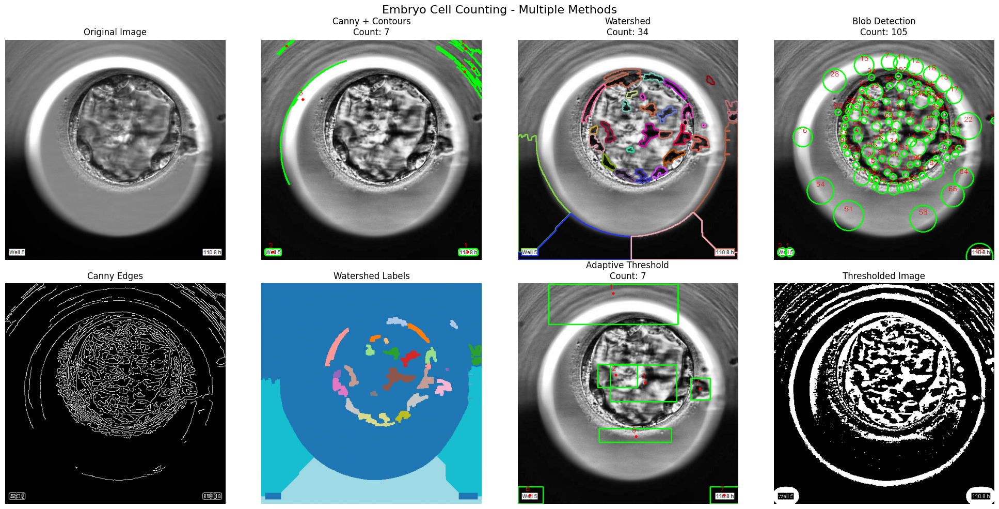

Cell Count Summary:
----------------------------------------
Canny + Contours    : 7 cells
Watershed           : 34 cells
Blob Detection      : 105 cells
Adaptive Threshold  : 7 cells
----------------------------------------
Average count: 38.2 cells

Would you like to fine-tune parameters for any method?
Enter method number or 0 to exit:
1. Canny + Contours
2. Watershed
3. Blob Detection
4. Adaptive Threshold


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import measure, morphology, segmentation
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import requests
from io import BytesIO
from PIL import Image

# For Google Colab file upload
from google.colab import files
import io

def upload_image():
    """Upload image file in Google Colab"""
    uploaded = files.upload()
    for filename in uploaded.keys():
        image = Image.open(io.BytesIO(uploaded[filename]))
        return np.array(image)
    return None

def load_image_from_url(url):
    """Load image from URL"""
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return np.array(img)

def preprocess_image(image):
    """Convert to grayscale and enhance contrast"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()

    # Enhance contrast using CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    return enhanced

def method1_canny_contours(image, min_area=100, max_area=5000):
    """
    Method 1: Canny edge detection with contour finding
    Good for well-separated cells with clear boundaries
    """
    gray = preprocess_image(image)

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Canny edge detection
    edges = cv2.Canny(blurred, 30, 100)

    # Close gaps in edges
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Find contours
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours by area
    valid_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_area < area < max_area:
            valid_contours.append(contour)

    # Draw results
    result = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    cv2.drawContours(result, valid_contours, -1, (0, 255, 0), 2)

    # Draw cell centers and numbers
    for i, contour in enumerate(valid_contours, 1):
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            cv2.circle(result, (cx, cy), 3, (255, 0, 0), -1)
            cv2.putText(result, str(i), (cx-10, cy-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    return len(valid_contours), result, edges

def method2_watershed_segmentation(image, min_distance=20):
    """
    Method 2: Watershed segmentation
    Good for touching or overlapping cells
    """
    gray = preprocess_image(image)

    # Apply threshold
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Remove small noise
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find sure background
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Find distance transform
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)

    # Find local maxima (cell centers) - updated for compatibility
    coordinates = peak_local_max(dist_transform, min_distance=min_distance,
                                 labels=opening)
    local_maxima = np.zeros_like(dist_transform, dtype=bool)
    local_maxima[tuple(coordinates.T)] = True
    markers = ndimage.label(local_maxima)[0]

    # Apply watershed
    labels = watershed(-dist_transform, markers, mask=opening)

    # Create result image
    result = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

    # Color each segmented cell differently
    for label in np.unique(labels):
        if label == 0:
            continue
        mask = np.zeros(gray.shape, dtype="uint8")
        mask[labels == label] = 255
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        color = np.random.randint(0, 255, size=3).tolist()
        cv2.drawContours(result, contours, -1, color, 2)

    cell_count = len(np.unique(labels)) - 1  # Subtract background

    return cell_count, result, labels

def method3_blob_detection(image, min_sigma=5, max_sigma=30, threshold=0.1):
    """
    Method 3: Blob detection using Laplacian of Gaussian
    Good for circular/elliptical cells
    """
    from skimage.feature import blob_log

    gray = preprocess_image(image)

    # Detect blobs
    blobs = blob_log(gray, min_sigma=min_sigma, max_sigma=max_sigma,
                     num_sigma=10, threshold=threshold)

    # Create result image
    result = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

    # Draw detected blobs
    for i, blob in enumerate(blobs, 1):
        y, x, r = blob
        cv2.circle(result, (int(x), int(y)), int(r * np.sqrt(2)), (0, 255, 0), 2)
        cv2.putText(result, str(i), (int(x)-10, int(y)-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    return len(blobs), result, blobs

def method4_adaptive_threshold(image, block_size=51, C=10, min_area=1000, max_area=5000):
    """
    Method 4: Adaptive thresholding with connected components
    Good for images with uneven illumination
    """
    gray = preprocess_image(image)

    # Apply adaptive threshold
    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY_INV, block_size, C)

    # Morphological operations to clean up
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel)

    # Find connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(cleaned, connectivity=8)

    # Filter by area
    result = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    valid_cells = 0

    for i in range(1, num_labels):  # Skip background (label 0)
        area = stats[i, cv2.CC_STAT_AREA]
        if min_area < area < max_area:
            valid_cells += 1
            # Draw bounding box
            x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                        stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
            cv2.rectangle(result, (x, y), (x + w, y + h), (0, 255, 0), 2)
            # Draw centroid
            cx, cy = int(centroids[i][0]), int(centroids[i][1])
            cv2.circle(result, (cx, cy), 3, (255, 0, 0), -1)
            cv2.putText(result, str(valid_cells), (cx-10, cy-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    return valid_cells, result, thresh

def analyze_embryo_image(image, show_all_methods=True):
    """
    Main function to analyze embryo image using multiple methods
    """
    results = {}

    # Method 1: Canny + Contours
    count1, result1, edges1 = method1_canny_contours(image)
    results['Canny + Contours'] = {'count': count1, 'result': result1, 'intermediate': edges1}

    # Method 2: Watershed
    count2, result2, labels2 = method2_watershed_segmentation(image)
    results['Watershed'] = {'count': count2, 'result': result2, 'intermediate': labels2}

    # Method 3: Blob Detection
    count3, result3, blobs3 = method3_blob_detection(image)
    results['Blob Detection'] = {'count': count3, 'result': result3, 'intermediate': None}

    # Method 4: Adaptive Threshold
    count4, result4, thresh4 = method4_adaptive_threshold(image)
    results['Adaptive Threshold'] = {'count': count4, 'result': result4, 'intermediate': thresh4}

    if show_all_methods:
        # Display all results
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))

        # Original image
        axes[0, 0].imshow(image, cmap='gray' if len(image.shape) == 2 else None)
        axes[0, 0].set_title('Original Image')
        axes[0, 0].axis('off')

        # Method 1
        axes[0, 1].imshow(result1)
        axes[0, 1].set_title(f'Canny + Contours\nCount: {count1}')
        axes[0, 1].axis('off')

        axes[1, 0].imshow(edges1, cmap='gray')
        axes[1, 0].set_title('Canny Edges')
        axes[1, 0].axis('off')

        # Method 2
        axes[0, 2].imshow(result2)
        axes[0, 2].set_title(f'Watershed\nCount: {count2}')
        axes[0, 2].axis('off')

        axes[1, 1].imshow(labels2, cmap='tab20')
        axes[1, 1].set_title('Watershed Labels')
        axes[1, 1].axis('off')

        # Method 3
        axes[0, 3].imshow(result3)
        axes[0, 3].set_title(f'Blob Detection\nCount: {count3}')
        axes[0, 3].axis('off')

        # Method 4
        axes[1, 2].imshow(result4)
        axes[1, 2].set_title(f'Adaptive Threshold\nCount: {count4}')
        axes[1, 2].axis('off')

        axes[1, 3].imshow(thresh4, cmap='gray')
        axes[1, 3].set_title('Thresholded Image')
        axes[1, 3].axis('off')

        plt.suptitle('Embryo Cell Counting - Multiple Methods', fontsize=16)
        plt.tight_layout()
        plt.show()

    # Print summary
    print("Cell Count Summary:")
    print("-" * 40)
    for method, data in results.items():
        print(f"{method:20s}: {data['count']} cells")
    print("-" * 40)
    avg_count = np.mean([data['count'] for data in results.values()])
    print(f"Average count: {avg_count:.1f} cells")

    return results

# Example usage in Google Colab
def main():
    print("Embryo Cell Counter")
    print("=" * 50)
    print("\nOptions:")
    print("1. Upload an image from your computer")
    print("2. Use a sample image URL")

    choice = input("\nEnter your choice (1 or 2): ")

    if choice == '1':
        print("\nPlease upload your embryo image...")
        image = upload_image()
        if image is None:
            print("No image uploaded.")
            return
    else:
        # You can replace this with your actual image URL
        url = input("\nEnter the image URL: ")
        try:
            image = load_image_from_url(url)
        except:
            print("Error loading image from URL.")
            return

    print("\nAnalyzing image...")
    results = analyze_embryo_image(image, show_all_methods=True)

    # Interactive parameter adjustment for fine-tuning
    print("\n" + "=" * 50)
    print("Would you like to fine-tune parameters for any method?")
    print("Enter method number or 0 to exit:")
    print("1. Canny + Contours")
    print("2. Watershed")
    print("3. Blob Detection")
    print("4. Adaptive Threshold")

    choice = input("\nYour choice: ")

    if choice == '1':
        min_area = int(input("Enter minimum cell area (default 100): ") or "100")
        max_area = int(input("Enter maximum cell area (default 5000): ") or "5000")
        count, result, _ = method1_canny_contours(image, min_area, max_area)
        plt.figure(figsize=(10, 5))
        plt.imshow(result)
        plt.title(f'Fine-tuned Canny + Contours - Count: {count}')
        plt.axis('off')
        plt.show()

# Run the main function
if __name__ == "__main__":
    main()